<a href="https://colab.research.google.com/github/shabnamsattar/Human-Data-Analysis/blob/main/chestMNIST/chestmnist.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Libraries

In [ ]:
import os
import random
import time
import pickle
import zipfile
import logging
import requests
import psutil
import math
import cv2
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from PIL import ImageFont
from tqdm import tqdm
from skimage.measure import label
from math import ceil
from tqdm.auto import tqdm

from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report, confusion_matrix, multilabel_confusion_matrix
from sklearn.metrics import precision_recall_curve
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.metrics import accuracy_score, hamming_loss, f1_score

import holoviews as hv
from holoviews import opts

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, optimizers, losses, metrics, regularizers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.layers import AvgPool2D, GlobalAveragePooling2D, MaxPool2D, Input, Conv2D, BatchNormalization, Dense, ReLU, concatenate, Lambda, Dropout
from tensorflow.keras.models import load_model, clone_model, Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow.keras.backend as K


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Necessary Functions

## Uploading Data

In [ ]:
dataset_paths = {
    64 : '/content/drive/MyDrive/chestMNIST/chestmnist_64.npz',
    128 : '/content/drive/MyDrive/chestMNIST/chestmnist_128.npz',
    224 : '/content/drive/MyDrive/chestMNIST/chestmnist_224.npz',
    }

def load_dataset(size):

    if size not in dataset_paths:
        raise ValueError(f"Dataset version {size} not found. Available: {list(dataset_paths.keys())}")
    data = np.load(dataset_paths[size], mmap_mode="r")

    train_images = data["train_images"]
    train_labels = data["train_labels"]
    val_images =   data["val_images"]
    val_labels =   data["val_labels"]
    test_images =  data["test_images"]
    test_labels =  data["test_labels"]

    return train_images ,train_labels ,val_images ,val_labels ,test_images ,test_labels

## Data Preprocessing

### Sub-sampling

In [ ]:
def subsample(imgs, labels, pct=0.05, seed= None):
    """Randomly subsample a percentage of a dataset."""
    n_samples = imgs.shape[0]
    n_select = int(n_samples * pct)
    rng = np.random.default_rng(seed)
    indices = rng.choice(n_samples, size=n_select, replace=False)
    return imgs[indices], labels[indices]

### Generators

In [ ]:
def get_datagen(augmentation=True):
    if augmentation:
        return ImageDataGenerator(
            rescale=1./255.,      # bring raw pixels to [0,1]
            rotation_range=10,    # ±10°
            horizontal_flip=True,
            width_shift_range=0.05,
            height_shift_range=0.05,
            zoom_range=0.05,
            featurewise_std_normalization=True
        )
    else:
        return ImageDataGenerator(
            rescale=1./255.,
            featurewise_std_normalization=True
        )

In [ ]:
def data_generator_1(images, labels, batch_size, augmentation=True, seed=None):
    gen = get_datagen(augmentation)
    rng = np.random.default_rng(seed)

    while True:
        idxs = np.arange(len(images))
        for start in range(0, len(images), batch_size):
            end   = min(start + batch_size, len(images))
            batch = idxs[start:end]

            x = images[batch]
            y = labels[batch]

            if x.ndim == 3:
                x = np.expand_dims(x, -1)

            # seed every individual transform
            x_aug = np.stack(
                [gen.random_transform(img, seed=int(rng.integers(1e9)))
                 for img in x]
            )
            yield x_aug, y


In [ ]:
def data_generator_2(images, labels, batch_size):

    while True:
        idxs = np.arange(len(images))
        for start in range(0, len(images), batch_size):
            end   = min(start + batch_size, len(images))
            batch = idxs[start:end]

            x = images[batch]
            y = labels[batch]

            if x.ndim == 3:
                x = np.expand_dims(x, -1)

            yield np.array(x), np.array(y)

In [ ]:
def data_generator_3(global_images, local_images, labels, batch_size, datagen=None):
    while True:
        idxs = np.arange(len(labels))
        for start in range(0, len(labels), batch_size):
            end = min(start + batch_size, len(labels))
            batch_indices = idxs[start:end]

            g = global_images[batch_indices]
            l = local_images[batch_indices]
            y = labels[batch_indices]

            # Add channel dimension for grayscale images
            g = np.expand_dims(g, axis=-1)
            l = np.expand_dims(l, axis=-1)

            # Apply augmentation if provided
            if datagen:
                g = np.array([datagen.random_transform(img) for img in g])
                l = np.array([datagen.random_transform(img) for img in l])

            yield (g, l), y

## HEATMAPS

In [ ]:
def generate_heatmaps(image, model, last_cnn_layer_name, dense_layer_name):
    # Get the last CNN layer output and Dense layer weights
    cnn_layer = model.get_layer(last_cnn_layer_name).output
    dense_layer = model.get_layer(dense_layer_name)
    dense_weights = dense_layer.get_weights()[0]

    # Create a model to extract features
    feature_extractor = Model(inputs=model.input, outputs=cnn_layer)
    feature_maps = feature_extractor.predict(image, verbose=0)

    # Compute heatmaps
    heatmaps = np.dot(feature_maps[0], dense_weights)
    return heatmaps

In [ ]:
def generate_heatmaps_batch(images, model, last_cnn_layer_name, dense_layer_name):

    # Get the last CNN layer output and Dense layer weights
    cnn_layer = model.get_layer(last_cnn_layer_name).output
    dense_layer = model.get_layer(dense_layer_name)
    dense_weights = dense_layer.get_weights()[0]

    # Create a model to extract features
    feature_extractor = Model(inputs=model.input, outputs=cnn_layer)

    # Extract feature maps for the entire batch
    feature_maps = feature_extractor.predict(images, verbose=0)

    # Compute heatmaps by matrix multiplication for each image in the batch
    heatmaps = np.tensordot(feature_maps, dense_weights, axes=([3], [0]))

    return heatmaps


In [ ]:
def heatmap_to_mask(hm, thresh=0.7):

    if isinstance(thresh, tuple):
        lo, hi = thresh
        mask = (hm >= lo) & (hm < hi)
    else:
        mask = hm >= thresh
    return mask.astype(np.uint8)

def mask_to_bbox(mask, margin=2):

    ys, xs = np.where(mask)
    if len(xs) == 0:
        return None
    xmin, xmax = xs.min(), xs.max()
    ymin, ymax = ys.min(), ys.max()

    # Optional safety margin so nothing important is clipped
    xmin = max(0, xmin - margin); ymin = max(0, ymin - margin)
    xmax = min(mask.shape[1] - 1, xmax + margin)
    ymax = min(mask.shape[0] - 1, ymax + margin)
    return xmin, ymin, xmax, ymax

def crop_and_resize(img, bbox, target_sz=(64, 64)):

    xmin, ymin, xmax, ymax = bbox
    crop = img[ymin:ymax+1, xmin:xmax+1]
    return cv2.resize(crop, target_sz, interpolation=cv2.INTER_LINEAR)


# Models

In [ ]:
def run_experiment(loss, batch_size, num_epochs, model,
                   train_generator, val_generator,
                   model_base, initial_lr = 0.01):
    # ---------- compile ----------
    model.compile(
        optimizer= tf.keras.optimizers.Adam(learning_rate= initial_lr),
        loss=loss,
        metrics=[tf.keras.metrics.BinaryAccuracy(name="acc"),
                 tf.keras.metrics.AUC(name="auc")]
    )

    steps_per_epoch  = math.ceil(len(train_images_64) / batch_size)
    validation_steps = math.ceil(len(val_images_64)   / batch_size)

    # ---------- callbacks ----------
    callbacks = [
        # 1) stop training if val-AUC hasn’t improved for 6 epochs
        tf.keras.callbacks.EarlyStopping(
            monitor='val_auc', mode='max',
            start_from_epoch=20,
            patience=6, restore_best_weights=True, verbose=1),


        # 2) one-line CSV of the metrics after every epoch
        tf.keras.callbacks.LearningRateScheduler(
            lambda epoch, lr: initial_lr * 0.1 ** (epoch // 20),
            verbose=1)
    ]

    # ---------- train ----------
    t0 = time.time()
    history = model.fit(
        train_generator,
        validation_data=val_generator,
        epochs=num_epochs,
        steps_per_epoch=steps_per_epoch,
        validation_steps=validation_steps,
        callbacks=callbacks,
        verbose=1
    )
    print(f"Training took {time.time() - t0:.1f}s")

    # ---------- save final model & history ----------
    model_file   = f'{model_base}.keras'
    history_file = f'{model_base}_history.pkl'
    os.makedirs(os.path.dirname(model_file), exist_ok=True)

    model.save(model_file)
    pickle.dump(history.history, open(history_file, 'wb'))

    # ---------- memory usage ----------
    mem_mb = psutil.Process().memory_info().rss / 1_048_576
    print(f"Current memory usage: {mem_mb:.2f} MB")

    print("saved:", model_file)
    print("saved:", history_file)
    return model, history


## 5layers_CNN

In [ ]:
def CNN5layers(input_shape, num_classes=14, l2_weight=1e-4, dropout_rate=0.25):


    weight_decay = regularizers.l2(l2_weight)
    inputs = layers.Input(shape=input_shape)

    # ----- Block 1 -----
    x = layers.Conv2D(32, (3, 3), padding="same",
                      kernel_regularizer=weight_decay)(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Dropout(dropout_rate)(x)

    # ----- Block 2 -----
    x = layers.Conv2D(64, (3, 3), padding="same",
                      kernel_regularizer=weight_decay)(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Dropout(dropout_rate)(x)

    # ----- Block 3 -----
    x = layers.Conv2D(128, (3, 3), padding="same",
                      kernel_regularizer=weight_decay)(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Dropout(dropout_rate)(x)

    # ----- Block 4 -----
    x = layers.Conv2D(256, (3, 3), padding="same",
                      kernel_regularizer=weight_decay)(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Dropout(dropout_rate)(x)

    # ----- Block 5 (no extra pooling, keep features rich) -----
    x = layers.Conv2D(256, (3, 3), padding="same",
                      kernel_regularizer=weight_decay)(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    # Global pooling makes the network resolution-agnostic
    x = layers.GlobalAveragePooling2D()(x)

    # Final dense → 14 logits → sigmoid for multi-label probs
    outputs = layers.Dense(num_classes, activation="sigmoid")(x)

    model = models.Model(inputs, outputs)
    return model


## RESNET_18, 34, 50

In [ ]:
L2 = 1e-4      # weight-decay

def conv_bn_relu(x, filters, k=3, s=1):

    x = layers.Conv2D(filters, k, strides=s, padding="same",
                      use_bias=False, kernel_regularizer=regularizers.l2(L2))(x)
    x = layers.BatchNormalization()(x)
    return layers.ReLU()(x)

def residual_block(x, filters, downsample, bottleneck=False):

    shortcut = x

    if bottleneck:            # -------- Bottleneck variant (1×1–3×3–1×1)
        f1, f2, f3 = filters//4, filters//4, filters
        x = conv_bn_relu(x, f1, k=1, s=1 if not downsample else 2)
        x = conv_bn_relu(x, f2, k=3, s=1)
        x = layers.Conv2D(f3, 1, padding="same", use_bias=False,
                          kernel_regularizer=regularizers.l2(L2))(x)
        x = layers.BatchNormalization()(x)
    else:                     # -------- BasicBlock variant (3×3–3×3)
        x = conv_bn_relu(x, filters, 3, s=1 if not downsample else 2)
        x = layers.Conv2D(filters, 3, padding="same", use_bias=False,
                          kernel_regularizer=regularizers.l2(L2))(x)
        x = layers.BatchNormalization()(x)


    if downsample or shortcut.shape[-1] != x.shape[-1]:
        shortcut = layers.Conv2D(filters, 1, strides=2 if downsample else 1,
                                 padding="same", use_bias=False,
                                 kernel_regularizer=regularizers.l2(L2))(shortcut)
        shortcut = layers.BatchNormalization()(shortcut)

    x = layers.add([x, shortcut])
    return layers.ReLU()(x)

def make_stage(x, filters, n_blocks, bottleneck=False):

    x = residual_block(x, filters, downsample=True,  bottleneck=bottleneck)
    for _ in range(1, n_blocks):
        x = residual_block(x, filters, downsample=False, bottleneck=bottleneck)
    return x

def ResNet(input_shape, n_classes=14, variant = "18"):
    """
    variant ∈ {"18", "34", "50"}
    Returns an un-compiled tf.keras.Model
    """
    assert variant in {"18", "34", "50"}, "variant must be 18, 34 or 50"

    block_cfg = {
        "18": [2, 2, 2, 2],
        "34": [3, 4, 6, 3],
        "50": [3, 4, 6, 3],
    }[variant]
    bottleneck = variant == "50"

    inputs = layers.Input(shape=input_shape)


    x = conv_bn_relu(inputs, 64, k=7, s=2)
    x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

    # -------- stages
    filters = 64
    for nb in block_cfg:
        x = make_stage(x, filters, nb, bottleneck=bottleneck)
        filters *= 2

    # -------- head
    x = layers.GlobalAveragePooling2D()(x)
    outputs = layers.Dense(n_classes, activation="sigmoid")(x)

    return Model(inputs, outputs, name=f"ResNet{variant}_{input_shape[0]}")


## DENSENET_121

In [ ]:
def conv_block(x, growth_rate, name):

    x = layers.BatchNormalization(name=f"{name}_bn1")(x)
    x = layers.ReLU(name=f"{name}_relu1")(x)
    x = layers.Conv2D(4 * growth_rate,
                      kernel_size=1, use_bias=False,
                      kernel_initializer="he_normal",
                      name=f"{name}_conv1")(x)

    x = layers.BatchNormalization(name=f"{name}_bn2")(x)
    x = layers.ReLU(name=f"{name}_relu2")(x)
    x = layers.Conv2D(growth_rate,
                      kernel_size=3, padding="same", use_bias=False,
                      kernel_initializer="he_normal",
                      name=f"{name}_conv2")(x)
    return x


def dense_block(x, n_layers, growth_rate, name):

    for i in range(n_layers):
        cb = conv_block(x, growth_rate, name=f"{name}_cb{i + 1}")
        x  = layers.Concatenate(axis=-1, name=f"{name}_concat{i + 1}")([x, cb])
    return x


def transition_block(x, reduction, name):

    x = layers.BatchNormalization(name=f"{name}_bn")(x)
    x = layers.ReLU(name=f"{name}_relu")(x)
    x = layers.Conv2D(int(tf.keras.backend.int_shape(x)[-1] * reduction),
                      kernel_size=1, use_bias=False,
                      kernel_initializer="he_normal",
                      name=f"{name}_conv")(x)
    x = layers.AvgPool2D(pool_size=2, strides=2, name=f"{name}_pool")(x)
    return x

# ------------------------------------------------------------------
#  DenseNet-121
# ------------------------------------------------------------------
def DenseNet121(input_shape=(224, 224, 1),
                      num_classes=14,
                      growth_rate=32,
                      reduction=0.5,
                      weight_decay=1e-4,
                      final_activation="sigmoid"):

    wd = regularizers.l2(weight_decay)
    img_input = layers.Input(shape=input_shape, name="input")

    # -------- initial stem --------
    x = layers.Conv2D(64, 7, strides=2, padding="same", use_bias=False,
                      kernel_initializer="he_normal", kernel_regularizer=wd,
                      name="stem_conv")(img_input)
    x = layers.BatchNormalization(name="stem_bn")(x)
    x = layers.ReLU(name="stem_relu")(x)
    x = layers.MaxPool2D(3, strides=2, padding="same", name="stem_pool")(x)

    # -------- dense blocks + transitions --------
    x = dense_block(x,  6, growth_rate, name="dense1")          #  6 layers
    x = transition_block(x, reduction, name="trans1")

    x = dense_block(x, 12, growth_rate, name="dense2")          # 12 layers
    x = transition_block(x, reduction, name="trans2")

    x = dense_block(x, 24, growth_rate, name="dense3")          # 24 layers
    x = transition_block(x, reduction, name="trans3")

    x = dense_block(x, 16, growth_rate, name="dense4")          # 16 layers

    # -------- classification head --------
    x = layers.BatchNormalization(name="bn_final")(x)
    x = layers.ReLU(name="relu_final")(x)
    x = layers.GlobalAveragePooling2D(name="gap")(x)
    output = layers.Dense(num_classes, activation=final_activation,
                          name="predictions")(x)

    model = models.Model(img_input, output, name="DenseNet121")

    return model


## Fusion part

In [ ]:
import tensorflow as tf

def fusion_model(global_model, local_model,
                 num_classes=14,
                 hidden_units=256,
                 dropout_rate=0.3,
                 fine_tune_backbones=False):

    # 1. Decide what each backbone should output
    #    (penultimate features rather than its own logits).
    g_feat_extractor = tf.keras.Model(
        inputs=global_model.input,
        outputs=global_model.layers[-2].output,
        name="g_backbone",
    )

    l_feat_extractor = tf.keras.Model(
        inputs=local_model.input,
        outputs=local_model.layers[-2].output,
        name="l_backbone",
    )

    # 2. (Un)freeze them in one line each
    g_feat_extractor.trainable = fine_tune_backbones
    l_feat_extractor.trainable = fine_tune_backbones

    # 3. New inputs for the fusion branch
    g_in = tf.keras.Input(shape=global_model.input_shape[1:],
                          name="global_image")
    l_in = tf.keras.Input(shape=local_model.input_shape[1:],
                          name="local_crop")

    # 4. Forward pass through the two back-bones
    g_feat = g_feat_extractor(g_in)      # Model used as a layer
    l_feat = l_feat_extractor(l_in)

    # 5. Fusion head
    x = tf.keras.layers.concatenate([g_feat, l_feat],
                                    name="concat_global_local")
    x = tf.keras.layers.Dense(hidden_units, activation="relu")(x)
    x = tf.keras.layers.Dropout(dropout_rate)(x)
    out = tf.keras.layers.Dense(num_classes, activation="sigmoid",
                                name="fusion_logits")(x)

    # 6. Final model
    return tf.keras.Model(inputs=[g_in, l_in], outputs=out,
                          name="FusionBranch")


# Evaluations & Visualization

### Accuracy, AUC, Loss plots

In [ ]:
def plot_training_history(
    history,
    metrics=None,
    smoothing_window: int = 2,
    show_raw: bool = False,
    figsize=(14, 4),
    sharey: bool = False,

):


    hist_dict = history.history if hasattr(history, "history") else history

    def moving_average(arr, win):
        if win <= 1:
            return np.asarray(arr)
        return np.convolve(arr, np.ones(win) / win, mode="valid")


    if metrics is None:
        base_metrics = [
            k for k in hist_dict.keys() if not k.startswith("val_") and f"val_{k}" in hist_dict
        ]
    else:
        base_metrics = [m for m in metrics if f"val_{m}" in hist_dict]

    if not base_metrics:
        raise ValueError("No matching train/validation metric pairs were found.")

    n_cols = 2
    n_rows = ceil(len(base_metrics) / n_cols)


    plt.style.use("default")
    mpl.rcParams.update({
          "axes.prop_cycle": mpl.cycler(color=["#66a61e", "#6a3d9a",
                                         "#66a61e", "#6a3d9a"]),
          "lines.linewidth": 2,
    })

    fig, axes = plt.subplots(
        n_rows, n_cols, figsize=(figsize[0], figsize[1] * n_rows), sharey=sharey
    )
    axes = np.atleast_1d(axes).flatten()

    for ax, metric in zip(axes, base_metrics):
        train_vals = hist_dict[metric]
        val_vals = hist_dict[f"val_{metric}"]


        if show_raw:
            ax.plot(train_vals, label="Train", alpha=0.3,linewidth= 2, linestyle="--")
            ax.plot(val_vals, label="Validation", alpha=0.3, linewidth= 2, linestyle="--")

        # Smoothed curves
        train_smoothed = moving_average(train_vals, smoothing_window)
        val_smoothed = moving_average(val_vals, smoothing_window)

        offset = smoothing_window - 1
        epochs = np.arange(len(train_smoothed)) + offset

        ax.plot(epochs, train_smoothed, linewidth= 2, label="Train (smoothed)")
        ax.plot(epochs, val_smoothed, linewidth= 2, label="Val (smoothed)")

        ax.set_title(metric.replace("_", " ").capitalize())
        ax.set_xlabel("Epoch")
        ax.set_ylabel(metric.capitalize())
        ax.grid (alpha= 0.3)
        ax.legend(loc="best")


    for j in range(len(base_metrics), n_rows * n_cols):
        axes[j].set_visible(False)

    fig.tight_layout()



### ROC Curve

Roc per model

In [ ]:
def plot_multiclass_roc(
    y_true,
    y_probs,
    class_labels = CLASS_LABELS,
    model_name: str = "",
    base_cmap: str = "viridis"):

    n_classes = y_true.shape[1]


    cmap     = cm.get_cmap(base_cmap, n_classes)
    colours  = [cmap(i) for i in range(n_classes)]

    linestyles = ["solid" for i in range(n_classes)]

    # ------------------------------------------------------------------------
    plt.figure(figsize=(9, 7))
    plt.title(model_name, fontsize=14)


    plt.plot([0, 1], [0, 1], "--", color="grey", lw=2)

    # per-class curves --------------------------------------------------------
    auc_values = {}
    for i, label in enumerate(class_labels):
        try:
            fpr, tpr, _ = roc_curve(y_true[:, i], y_probs[:, i])
            auc_val = auc(fpr, tpr)
        except ValueError:
            fpr, tpr, auc_val = [0, 1], [0, 1], np.nan

        auc_values[label] = auc_val

        plt.plot(
            fpr,
            tpr,
            label=f"{label}  " if np.isnan(auc_val) else f"{label}  ({auc_val:.2f})",
            color=colours[i],
            linestyle=linestyles[i],
            lw=2,
        )


    plt.xlim([0, 1])
    plt.ylim([0, 1.01])
    plt.xlabel("FPR")
    plt.ylabel("TPR")
    plt.grid(alpha=0.3, linestyle=":")

    plt.legend(
        loc="lower right",
        fontsize=8,
        borderpad=0.4,
        frameon=True,
        framealpha=0.9,
    )
    plt.tight_layout()
    plt.show()

ROC per Class

In [ ]:
def plot_multimodel_roc(
    y_true,
    y_prob_list,
    model_names,
    class_labels = CLASS_LABELS,
    n_cols: int = 4,
    figsize: tuple = (18, 12),
    cmap_name: str = "Set1",
):

    assert len(y_prob_list) == len(model_names), "Mismatch models / names"
    n_classes = y_true.shape[1]
    n_rows = math.ceil(n_classes / n_cols)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    axes = axes.flatten()


    cmap = cm.get_cmap(cmap_name, len(model_names))
    colours = [cmap(i) for i in range(len(model_names))]

    for c_idx, label in enumerate(class_labels):
        ax = axes[c_idx]


        ax.plot([0, 1], [0, 1], "--", color="grey", linewidth=1)

        for m_idx, (probs, m_name) in enumerate(zip(y_prob_list, model_names)):
            try:
                fpr, tpr, _ = roc_curve(y_true[:, c_idx], probs[:, c_idx])
                auc_val = auc(fpr, tpr)
            except ValueError:

                fpr, tpr, auc_val = [0, 1], [0, 1], np.nan

            ax.plot(
                fpr,
                tpr,
                label=f"{m_name}",
                color=colours[m_idx],
                lw=1.8,
            )

        ax.set_xlim([0, 1])
        ax.set_ylim([0, 1.05])
        ax.set_xlabel("FPR")
        ax.set_ylabel("TPR")
        ax.set_title(label, fontsize=14)


    for j in range(n_classes, len(axes)):
        axes[j].set_visible(False)


    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(
        handles,
        labels,
        prop={'size': 17},
        frameon=True,
        title="Models",
        loc="center right",
        title_fontsize=20
    )
    fig.tight_layout(rect=[0, 0, 0.88, 1])
    plt.show()


# Experiments

In [ ]:
CLASS_LABELS = [
    'atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass',
    'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema',
    'emphysema', 'fibrosis', 'pleural_thickening', 'hernia'
]


##ChestMnist_64

In [ ]:
SEED = 42

In [ ]:
train_img_64, train_lbl_64, val_img_64, val_lbl_64, test_img_64, test_lbl_64 = load_dataset(64)

In [ ]:
train_images_64, train_labels_64 = subsample(train_img_64, train_lbl_64, seed=SEED)
val_images_64, val_labels_64   = subsample(val_img_64, val_lbl_64, seed=SEED)
test_images_64, test_labels_64  = subsample(test_img_64, test_lbl_64, seed=SEED)


In [ ]:
train_generator_64 = data_generator_1(train_images_64, train_labels_64, batch_size=64, augmentation=True, seed=SEED)
valid_generator_64 = data_generator_1(val_images_64, val_labels_64, batch_size=64, augmentation=False, seed=SEED)
test_generator_64 = data_generator_1(test_images_64, test_labels_64,batch_size=64, augmentation=False, seed=SEED)

### 1) 5layer_CNN

#### 1- Global Branch

In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/CNN_global_64'

CNN_global_64 , CNN_global_64_history = run_experiment(
    loss='binary_crossentropy',
    batch_size=128,
    num_epochs=50,
    model=CNN5layers((64, 64, 1), num_classes=14),
    train_generator=train_generator_64,
    val_generator=valid_generator_64,
    model_base=model_base
)


Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


31/31 ━━━━━━━━━━━━━━━━━━━━ 16s 88ms/step - acc: 0.9122 - auc: 0.6344 - loss: 0.3961 - val_acc: 0.9478 - val_auc: 0.5000 - val_loss: 8.1438 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 11s 354ms/step - acc: 0.9516 - auc: 0.7478 - loss: 0.2375 - val_acc: 0.9518 - val_auc: 0.5503 - val_loss: 0.4417 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - acc: 0.9444 - auc: 0.7505 - loss: 0.2189 - val_acc: 0.9478 - val_auc: 0.7019 - val_loss: 0.2603 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - acc: 0.9516 - auc: 0.7453 - loss: 0.1964 - val_acc: 0.9511 - val_auc: 0.6817 - val_loss: 0.2152 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler setting learning rate to 0.01.
Epoch 5/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - acc: 0.9444

##### Evaluation

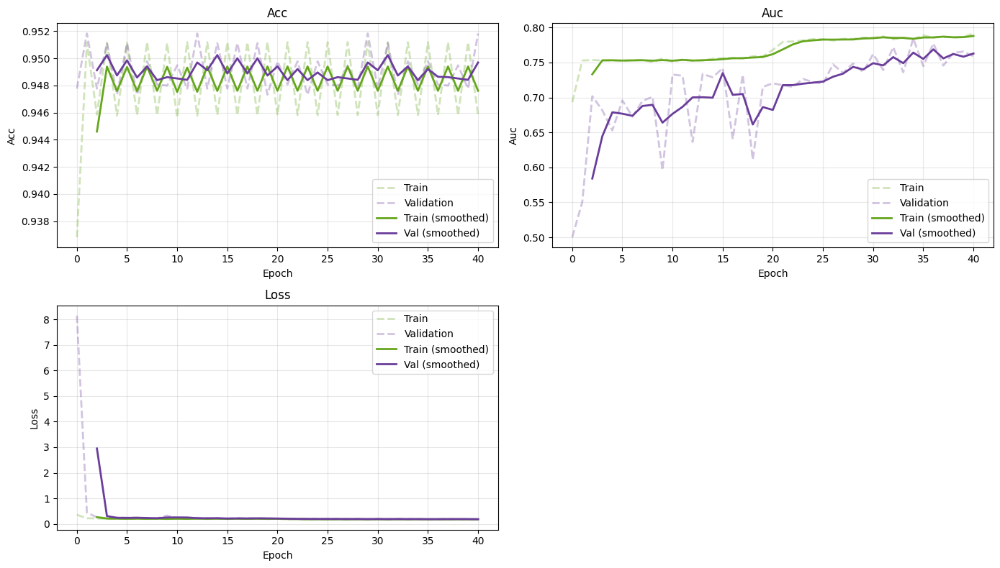

In [ ]:
plot_training_history(CNN_global_64_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_64) / 64))

In [ ]:
evaluation = CNN_global_64.evaluate(test_generator_64, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


Test loss     : 0.1906
Test accuracy : 0.9479
Test AUC      : 0.7522


In [ ]:
y_prob_C_G_64 = CNN_global_64.predict(test_generator_64, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_64[:, i], y_prob_C_G_64[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}


Per-class AUROC
--------------------------------------------------------------------------------
atelectasis         : 0.5036156857669785
cardiomegaly        : 0.6095427560944802
effusion            : 0.551952185050066
infiltration        : 0.509057246973081
mass                : 0.49303228754188244
nodule              : 0.5353447256385999
pneumonia           : 0.5153291253381425
pneumothorax        : 0.49994963485268196
consolidation       : 0.5037908496732026
edema               : 0.500266410912191
emphysema           : 0.4539212784847588
fibrosis            : 0.6003959276018099
pleural_thickening  : 0.43010752688172044
hernia              : 0.3932082216264522


<ipython-input-20-dc71f3da9654>:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap     = cm.get_cmap(base_cmap, n_classes)


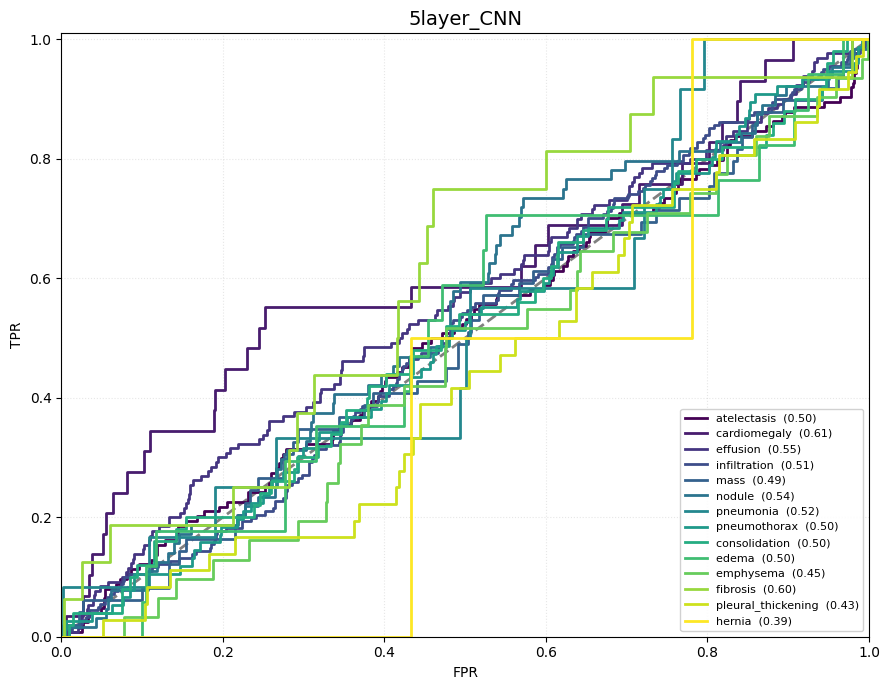

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_64,
    y_probs       = y_prob_C_G_64,
    model_name    = "5layer_CNN")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/CNN_global_64.keras"
history_path = '/content/drive/MyDrive/chestMNIST/CNN_global_64_history.pkl'

CNN_global_64 = keras.models.load_model(model_path)
CNN_global_64_history = pickle.load(open(history_path, 'rb'))


#### 2- Local Branch

##### Bounding Box

In [ ]:
batch_size = 1
train_generator2_64 = data_generator_2(train_images_64, train_labels_64, batch_size=1)
valid_generator2_64 = data_generator_2(val_images_64, val_labels_64, batch_size=1)
test_generator2_64 = data_generator_2(test_images_64, test_labels_64, batch_size=1)

In [ ]:
CNN_global_64.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 64, 64, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 64, 64, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 64, 64, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu (ReLU)                    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 32, 32, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_1 (ReLU)                  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 16, 16, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_2 (ReLU)                  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 8, 8, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_3 (ReLU)                  │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 4, 4, 256)      │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 4, 4, 256)      │         1,02

 Total params: 2,950,444 (11.26 MB)

 Trainable params: 982,990 (3.75 MB)

 Non-trainable params: 1,472 (5.75 KB)

 Optimizer params: 1,965,982 (7.50 MB)

In [ ]:

out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "train_bbox_CNN_64.npz")

num_samples = len(train_images_64)
cropped_images_list, labels_list, bboxes_list = [], [], []

processed = 0

pbar = tqdm(total=num_samples,
            desc='Processing images',
            unit='img',
            leave=False,
            ncols=80,
            mininterval=0.2)


# ── 1.  Loop until we have seen every image exactly once ──────────────────────
while processed < num_samples:
    img, lbl = next(train_generator2_64)
    B = img.shape[0]

    heatmaps = generate_heatmaps_batch(img, CNN_global_64, "re_lu_4", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.7)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox)[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))


    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save everything ───────────────────────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)


print(f"\nDone!  Saved one epoch of masked data to:\n{out_path}")



Processing images:   0%|                              | 0/3923 [00:00<?, ?img/s]


Done!  Saved one epoch of masked data to:
/content/drive/MyDrive/chestMNIST/BBox/train_bbox_CNN_64.npz


In [ ]:
out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "val_bbox_CNN_64.npz")

num_samples = len(val_images_64)
cropped_images_list, labels_list, bboxes_list = [], [], []

processed = 0

pbar = tqdm(total=num_samples,
            desc='Processing images',
            unit='img',
            leave=False,
            ncols=80,
            mininterval=0.2)


# ── 1.  Loop until we have seen every image exactly once ──────────────────────
while processed < num_samples:
    img, lbl = next(valid_generator2_64)
    B = img.shape[0]

    heatmaps = generate_heatmaps_batch(img, CNN_global_64, "re_lu_4", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.7)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox)[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))


    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save everything ───────────────────────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)


print(f"\nDone!  Saved one epoch of masked data to:\n{out_path}")



Processing images:   0%|                               | 0/560 [00:00<?, ?img/s]


Done!  Saved one epoch of masked data to:
/content/drive/MyDrive/chestMNIST/BBox/val_bbox_CNN_64.npz


In [ ]:

out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "test_bbox_CNN_64.npz")

num_samples = len(test_images_64)
cropped_images_list, labels_list, bboxes_list = [], [], []

processed = 0

pbar = tqdm(total=num_samples,
            desc='Processing images',
            unit='img',
            leave=False,
            ncols=80,
            mininterval=0.2)


# ── 1.  Loop until we have seen every image exactly once ──────────────────────
while processed < num_samples:
    img, lbl = next(test_generator2_64)
    B = img.shape[0]

    heatmaps = generate_heatmaps_batch(img, CNN_global_64, "re_lu_4", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.7)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox)[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))


    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save everything ───────────────────────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)


print(f"\nDone!  Saved one epoch of masked data to:\n{out_path}")



Processing images:   0%|                              | 0/1121 [00:00<?, ?img/s]


Done!  Saved one epoch of masked data to:
/content/drive/MyDrive/chestMNIST/BBox/test_bbox_CNN_64.npz


##### Loading BBOX Images

In [ ]:
data_1 = np.load('/content/drive/MyDrive/chestMNIST/BBox/train_bbox_CNN_64.npz')
train_img_bbox_64_cnn = data_1['images']
train_img_bbox_64_cnn = np.squeeze(train_img_bbox_64_cnn)
train_lbl_bbox_64_cnn = data_1['labels']
train_lbl_bbox_64_cnn = np.squeeze(train_lbl_bbox_64_cnn)

In [ ]:
data_2 = np.load('/content/drive/MyDrive/chestMNIST/BBox/val_bbox_CNN_64.npz')
val_img_bbox_64_cnn = data_2['images']
val_img_bbox_64_cnn = np.squeeze(val_img_bbox_64_cnn)
val_lbl_bbox_64_cnn = data_2['labels']
val_lbl_bbox_64_cnn = np.squeeze(val_lbl_bbox_64_cnn)

In [ ]:
data_3 = np.load('/content/drive/MyDrive/chestMNIST/BBox/test_bbox_CNN_64.npz')
test_img_bbox_64_cnn = data_3['images']
test_img_bbox_64_cnn = np.squeeze(test_img_bbox_64_cnn)
test_lbl_bbox_64_cnn = data_3['labels']
test_lbl_bbox_64_cnn = np.squeeze(test_lbl_bbox_64_cnn)

##### Run the model

In [ ]:
SEED = 42

In [ ]:
train_generator_64 = data_generator_1(train_img_bbox_64_cnn, train_lbl_bbox_64_cnn, batch_size=64, augmentation=True, seed=SEED)
valid_generator_64 = data_generator_1(val_img_bbox_64_cnn, val_lbl_bbox_64_cnn, batch_size=64, augmentation=False, seed=SEED)
test_generator_64 = data_generator_1(test_img_bbox_64_cnn, test_lbl_bbox_64_cnn,batch_size=64, augmentation=False, seed=SEED)

In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/CNN_local_64'

CNN_local_64 , CNN_local_64_history = run_experiment(
    loss='binary_crossentropy',
    batch_size=64,
    num_epochs=50,
    model=CNN5layers((64, 64, 1), num_classes=14),
    train_generator=train_generator_64,
    val_generator=valid_generator_64,
    model_base=model_base
)


Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


62/62 ━━━━━━━━━━━━━━━━━━━━ 27s 211ms/step - acc: 0.9037 - auc: 0.6579 - loss: 0.4025 - val_acc: 0.9508 - val_auc: 0.5731 - val_loss: 0.4079 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - acc: 0.9457 - auc: 0.7170 - loss: 0.2260 - val_acc: 0.9508 - val_auc: 0.7107 - val_loss: 0.2274 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - acc: 0.9458 - auc: 0.7184 - loss: 0.2185 - val_acc: 0.9508 - val_auc: 0.6894 - val_loss: 0.2150 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - acc: 0.9459 - auc: 0.7170 - loss: 0.2176 - val_acc: 0.9492 - val_auc: 0.7369 - val_loss: 0.2187 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler setting learning rate to 0.01.
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - acc: 0.9459 

##### Evaluation

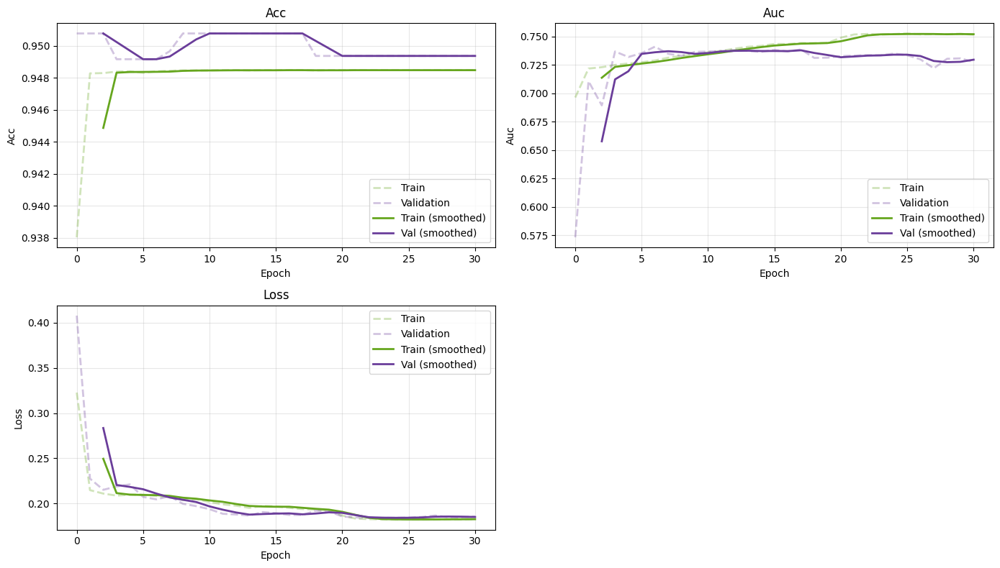

In [ ]:
plot_training_history(CNN_local_64_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_64) / 64))

In [ ]:
evaluation = CNN_local_64.evaluate(test_generator_64, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


Test loss     : 0.1866
Test accuracy : 0.9479
Test AUC      : 0.7361


In [ ]:
y_prob_C_l_64 = CNN_local_64.predict(test_generator_64, steps=steps, verbose=0)

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_64[:, i], y_prob_C_l_64[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}


Per-class AUROC
--------------------------------------------------------------------------------
atelectasis         : 0.5437360468502281
cardiomegaly        : 0.616710875331565
effusion            : 0.4552511061088256
infiltration        : 0.5641442341601034
mass                : 0.46660828510508673
nodule              : 0.4022365775780511
pneumonia           : 0.5267883979561166
pneumothorax        : 0.4410475950642156
consolidation       : 0.5875723622782446
edema               : 0.5786445012787724
emphysema           : 0.518348623853211
fibrosis            : 0.6315328054298643
pleural_thickening  : 0.5239119303635433
hernia              : 0.7931188561215371


<ipython-input-20-dc71f3da9654>:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap     = cm.get_cmap(base_cmap, n_classes)


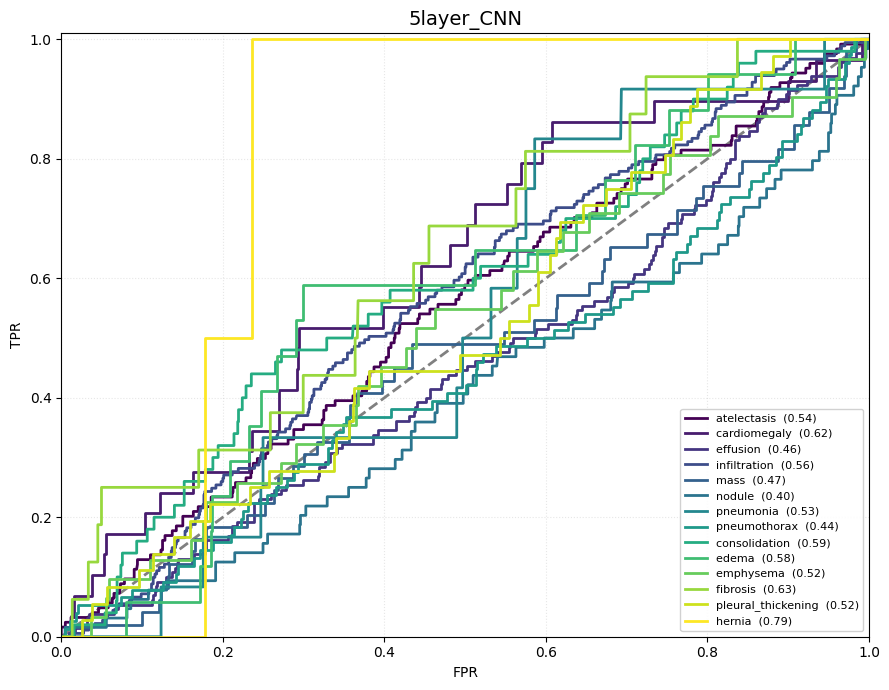

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_64,
    y_probs       = y_prob_C_l_64,
    model_name    = "5layer_CNN")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/CNN_local_64.keras"
history_path = '/content/drive/MyDrive/chestMNIST/CNN_local_64_history.pkl'

CNN_local_64 = keras.models.load_model(model_path)
CNN_local_64_history = pickle.load(open(history_path, 'rb'))


#### 3- Fiusion Branch

In [ ]:
fusion_train_gen = data_generator_3(train_images_64, train_img_bbox_64_cnn, train_labels_64, batch_size=64, datagen=get_datagen(True))

fusion_val_gen   = data_generator_3(val_images_64, val_img_bbox_64_cnn,val_labels_64,batch_size=64,datagen=get_datagen(False))

fusion_test_gen = data_generator_3(test_images_64,test_img_bbox_64_cnn,test_labels_64, batch_size=64, datagen= get_datagen(False))

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/CNN_fusion_64'

CNN_fusion_64, CNN_fusion_64_history = run_experiment(
        loss='binary_crossentropy',
        batch_size=64,
        num_epochs=50,
        model= fusion_model(CNN_global_64, CNN_local_64, num_classes=14, hidden_units=256, dropout_rate=0.3, fine_tune_backbones=False),
        train_generator=fusion_train_gen,
        val_generator  =fusion_val_gen,
        model_base     = model_base)


Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 28s 251ms/step - acc: 0.9102 - auc: 0.6652 - loss: 0.2555 - val_acc: 0.9508 - val_auc: 0.7716 - val_loss: 0.1730 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - acc: 0.9460 - auc: 0.7544 - loss: 0.1889 - val_acc: 0.9508 - val_auc: 0.7755 - val_loss: 0.1729 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - acc: 0.9460 - auc: 0.7610 - loss: 0.1869 - val_acc: 0.9508 - val_auc: 0.7799 - val_loss: 0.1752 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - acc: 0.9459 - auc: 0.7565 - loss: 0.1880 - val_acc: 0.9508 - val_auc: 0.7738 - val_loss: 0.1755 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler setting learning rate 

##### Evaluation

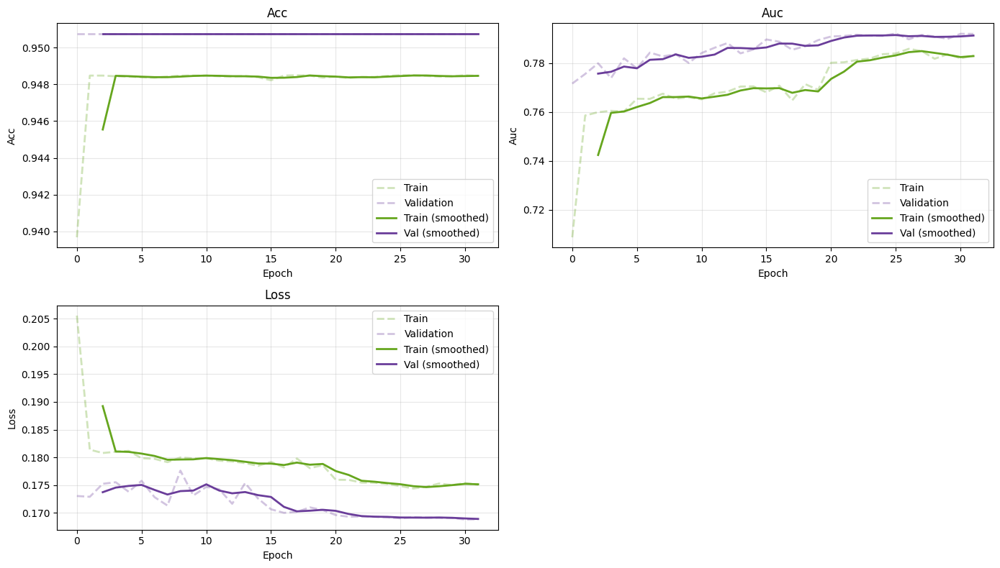

In [ ]:
plot_training_history(CNN_fusion_64_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_64) / 64))

In [ ]:
evaluation = CNN_fusion_64.evaluate(fusion_test_gen, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

Test loss     : 0.1793
Test accuracy : 0.9479
Test AUC      : 0.7708


In [ ]:
y_prob_C_F_64 = CNN_fusion_64.predict(fusion_test_gen, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_64[:, i], y_prob_C_F_64[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}


Per-class AUROC
--------------------------------------------------------------------------------
atelectasis         : 0.6779936583945384
cardiomegaly        : 0.7007704938739422
effusion            : 0.702390747496701
infiltration        : 0.6536558128599976
mass                : 0.4964780688394761
nodule              : 0.5229422894985809
pneumonia           : 0.5924256086564472
pneumothorax        : 0.6651976832032234
consolidation       : 0.7099346405228759
edema               : 0.8290174765558397
emphysema           : 0.6018348623853211
fibrosis            : 0.5715497737556561
pleural_thickening  : 0.5681771633384536
hernia              : 0.5098302055406614


<ipython-input-20-dc71f3da9654>:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap     = cm.get_cmap(base_cmap, n_classes)


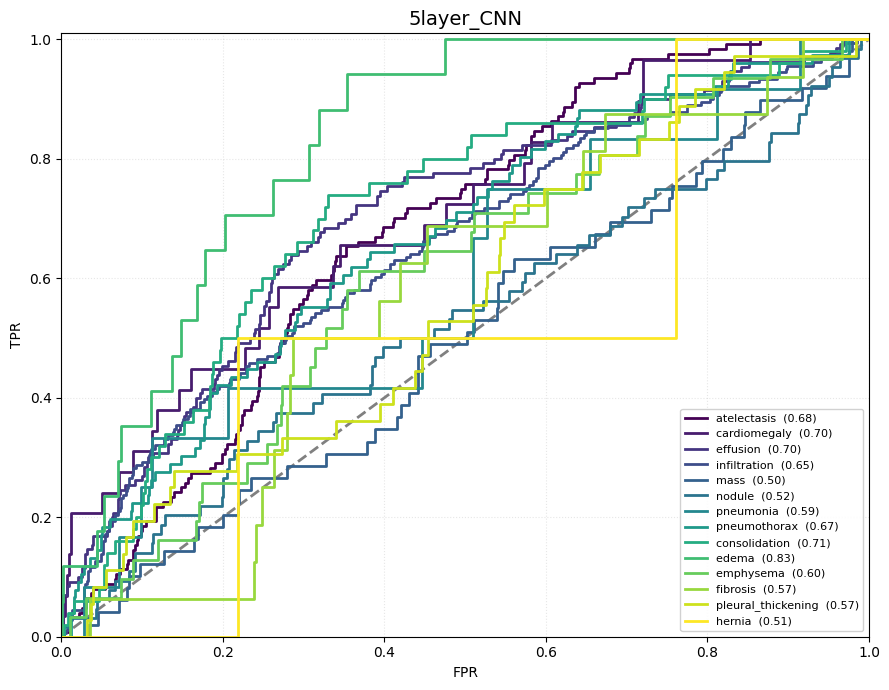

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_64,
    y_probs       = y_prob_C_F_64,
    model_name    = "5layer_CNN")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/CNN_fusion_64.keras"
history_path = '/content/drive/MyDrive/chestMNIST/CNN_fusion_64_history.pkl'

CNN_fusion_64 = keras.models.load_model(model_path)
CNN_fusion_64_history = pickle.load(open(history_path, 'rb'))


<ipython-input-111-002ec1d167bc>:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name, len(model_names))


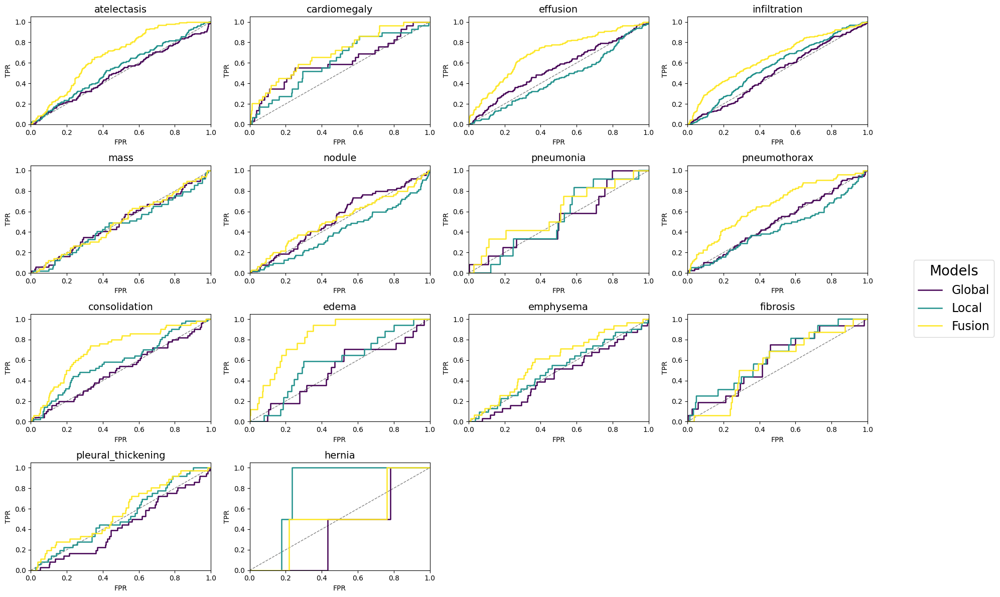

In [ ]:
plot_multimodel_roc(
    y_true           = test_labels_64,
    y_prob_list      = [y_prob_C_G_64, y_prob_C_l_64, y_prob_C_F_64],
    model_names      = ["Global", "Local", "Fusion"],
    class_labels     = CLASS_LABELS,
    n_cols           = 4,
    figsize          = (20, 12),
    cmap_name      = "viridis"
)

###2) ResNet

#### 1- Global Branch

In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/resnet_global_64'

ResNet_global_64 , ResNet_global_64_history = run_experiment(
    loss='binary_crossentropy',
    batch_size=64,
    num_epochs=50,
    model= ResNet(input_shape=(64,64,1), n_classes=14, variant="18"),
    train_generator=train_generator_64,
    val_generator=valid_generator_64,
    model_base=model_base
)


Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


62/62 ━━━━━━━━━━━━━━━━━━━━ 43s 318ms/step - acc: 0.9082 - auc: 0.6460 - loss: 1.2943 - val_acc: 0.8915 - val_auc: 0.4998 - val_loss: 3.3819 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - acc: 0.9448 - auc: 0.7349 - loss: 1.0018 - val_acc: 0.9492 - val_auc: 0.7389 - val_loss: 0.6075 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - acc: 0.9446 - auc: 0.7423 - loss: 0.5663 - val_acc: 0.9497 - val_auc: 0.7484 - val_loss: 0.4028 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - acc: 0.9449 - auc: 0.7448 - loss: 0.3965 - val_acc: 0.8900 - val_auc: 0.5159 - val_loss: 1.8842 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler setting learning rate to 0.01.
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - acc: 0.9453 

##### Evaluation

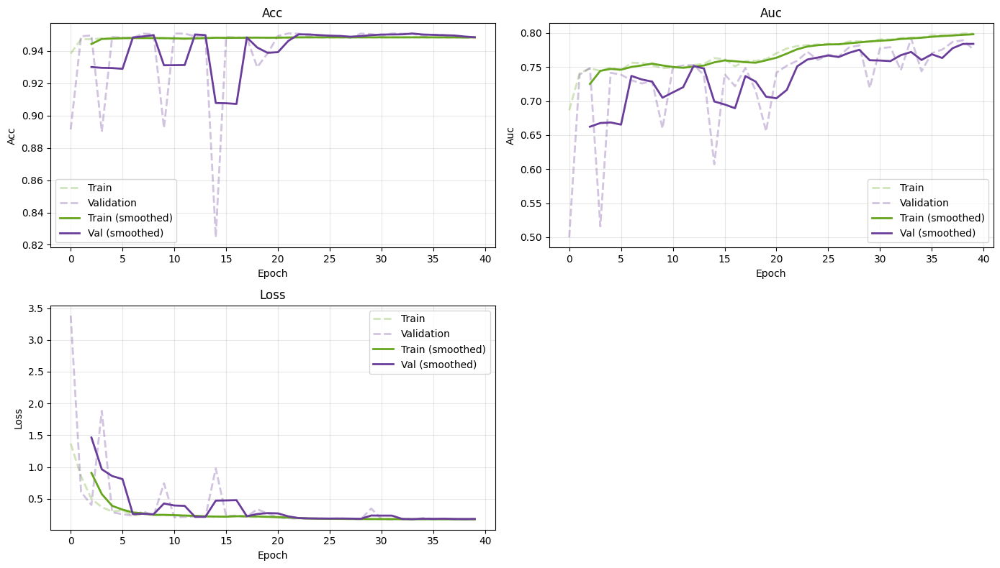

In [ ]:
plot_training_history(ResNet_global_64_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_64) / 64))

In [ ]:
evaluation = ResNet_global_64.evaluate(test_generator_64, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


Test loss     : 0.1833
Test accuracy : 0.9479
Test AUC      : 0.7832


In [ ]:
y_prob_R_G_64 = ResNet_global_64.predict(test_generator_64, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_64[:, i], y_prob_R_G_64[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}


Per-class AUROC
--------------------------------------------------------------------------------
atelectasis         : 0.4910780729284628
cardiomegaly        : 0.47464317291903496
effusion            : 0.5143755336489948
infiltration        : 0.4633948512989303
mass                : 0.435767590618337
nodule              : 0.40709259697256395
pneumonia           : 0.6112864442440636
pneumothorax        : 0.5457945101989423
consolidation       : 0.4937254901960785
edema               : 0.4527387041773231
emphysema           : 0.47221071322876595
fibrosis            : 0.5158371040723981
pleural_thickening  : 0.5469278033794163
hernia              : 0.6818588025022342


<ipython-input-12-635024071>:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap     = cm.get_cmap(base_cmap, n_classes)


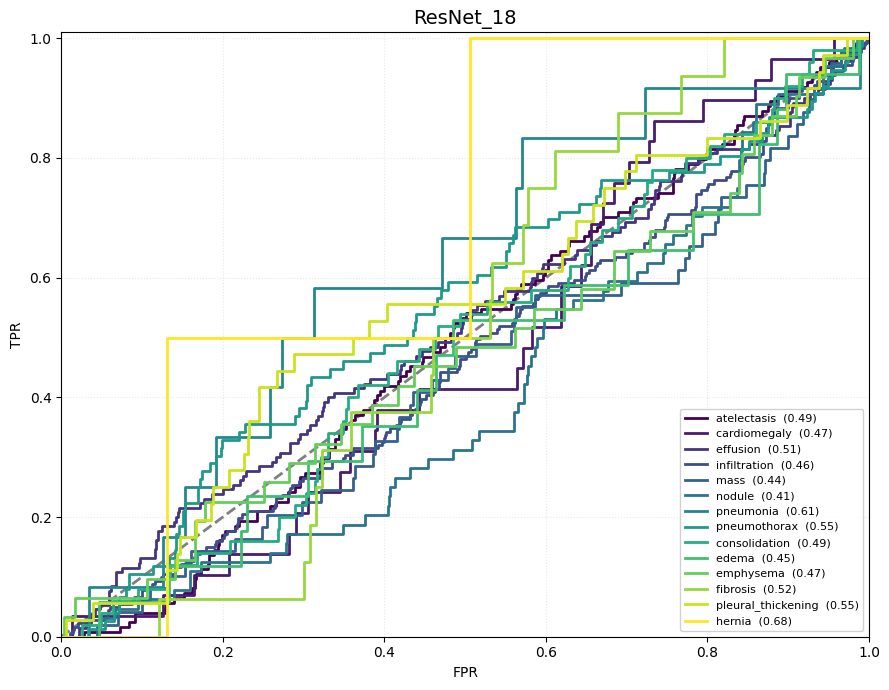

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_64,
    y_probs       = y_prob_R_G_64,
    model_name    = "ResNet_18 Global Branch")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/resnet_global_64.keras"
history_path = '/content/drive/MyDrive/chestMNIST/resnet_global_64_history.pkl'

ResNet_global_64 = keras.models.load_model(model_path)
ResNet_global_64_history = pickle.load(open(history_path, 'rb'))

#### 2- Local Branch

##### Bounding Box

In [ ]:
batch_size = 1
train_generator2_64 = data_generator_2(train_images_64, train_labels_64, batch_size=1)
valid_generator2_64 = data_generator_2(val_images_64, val_labels_64, batch_size=1)
test_generator2_64 = data_generator_2(test_images_64, test_labels_64, batch_size=1)

In [ ]:
 ResNet_global_64.summary()

Model: "ResNet18_64"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 64, 64, 1) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 32, 32,    │      3,136 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 32, 32,    │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 32, 32,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 16, 16,    │          0 │ re_lu[0][0]       │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 8, 8, 64)  │     36,864 │ max_pooling2d[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 8, 8, 64)  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 8, 8, 64)  │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 8, 8, 64)  │     36,864 │ re_lu_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 8, 8, 64)  │      4,096 │ max_pooling2d[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 8, 8, 64)  │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 8, 8, 64)  │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 8, 8, 64)  │          0 │ batch_normalizat… │
│                     │                   │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 8, 8, 64)  │          0 │ add[0][0]         │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 8, 8, 64)  │     36,864 │ re_lu_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 8, 8, 64)  │        256 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_3 (ReLU)      │ (None, 8, 8, 64)  │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 8, 8, 64)  │     36,864 │ re_lu_3[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 8, 8, 64)  │        256 │ conv2d_5[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 33,554,668 (128.00 MB)

 Trainable params: 11,181,646 (42.65 MB)

 Non-trainable params: 9,728 (38.00 KB)

 Optimizer params: 22,363,294 (85.31 MB)

In [ ]:
start_idx   = 1500
total_imgs  = len(train_images_64)
num_samples = total_imgs - start_idx

out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "train_bbox_resnet_64.npz")

cropped_images_list, labels_list, bboxes_list = [], [], []

# ── 0·A.  Fast-forward generator so we start at image 1500 ──────────────────
skipped = 0
while skipped < start_idx:
    batch_imgs, _ = next(train_generator2_64)
    skipped += batch_imgs.shape[0]

# ── 0·B.  Progress bar for the *remaining* images ────────────────────────────
pbar = tqdm(total=num_samples,
            desc=f"Processing images {start_idx}-{total_imgs-1}",
            unit="img",
            leave=False,
            ncols=80,
            mininterval=0.2)

processed = 0

# ── 1.  Main loop (unchanged apart from the loop-guard) ──────────────────────
while processed < num_samples:
    img, lbl = next(train_generator2_64)
    B = img.shape[0]


    heatmaps = generate_heatmaps_batch(img, ResNet_global_64, "re_lu_16", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.7)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox, target_sz=(64,64))[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))

    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save just the processed images ───────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)

print(f"\nDone!  Saved {num_samples} cropped images (indexes {start_idx}-{total_imgs-1}) to:\n{out_path}")


Processing images 1500-3922:   0%|                    | 0/2423 [00:00<?, ?img/s]


Done!  Saved 2423 cropped images (indexes 1500-3922) to:
/content/drive/MyDrive/chestMNIST/BBox/train_bbox_resnet_64.npz


In [ ]:
out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "val_bbox_resnet_64.npz")

num_samples = len(val_images_64)
cropped_images_list, labels_list, bboxes_list = [], [], []

processed = 0

pbar = tqdm(total=num_samples,
            desc='Processing images',
            unit='img',
            leave=False,
            ncols=80,
            mininterval=0.2)


# ── 1.  Loop until we have seen every image exactly once ──────────────────────
while processed < num_samples:
    img, lbl = next(valid_generator2_64)
    B = img.shape[0]

    heatmaps = generate_heatmaps_batch(img, ResNet_global_64, "re_lu_16", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.7)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox, target_sz=(64,64))[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))


    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save everything ───────────────────────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)


print(f"\nDone!  Saved one epoch of masked data to:\n{out_path}")



Processing images:   0%|                               | 0/560 [00:00<?, ?img/s]


Done!  Saved one epoch of masked data to:
/content/drive/MyDrive/chestMNIST/BBox/val_bbox_resnet_64.npz


In [ ]:
out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "test_bbox_resnet_64.npz")

num_samples = len(test_images_64)
cropped_images_list, labels_list, bboxes_list = [], [], []

processed = 0

pbar = tqdm(total=num_samples,
            desc='Processing images',
            unit='img',
            leave=False,
            ncols=80,
            mininterval=0.2)


# ── 1.  Loop until we have seen every image exactly once ──────────────────────
while processed < num_samples:
    img, lbl = next(test_generator2_64)
    B = img.shape[0]
    heatmaps = generate_heatmaps_batch(img, ResNet_global_64, "re_lu_16", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.7)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox, target_sz=(64,64))[..., None]

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))


    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save everything ───────────────────────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)


print(f"\nDone!  Saved one epoch of masked data to:\n{out_path}")



Processing images:   0%|                              | 0/1121 [00:00<?, ?img/s]


Done!  Saved one epoch of masked data to:
/content/drive/MyDrive/chestMNIST/BBox/test_bbox_resnet_64.npz


##### Loading Bbox Images

In [ ]:
data_4 = np.load('/content/drive/MyDrive/chestMNIST/BBox/train_bbox_resnet_64.npz')
train_img_bbox_64_R = data_4['images']
train_img_bbox_64_R = np.squeeze(train_img_bbox_64_R)
train_lbl_bbox_64_R = data_4['labels']
train_lbl_bbox_64_R = np.squeeze(train_lbl_bbox_64_R)

In [ ]:
data_5 = np.load('/content/drive/MyDrive/chestMNIST/BBox/val_bbox_resnet_64.npz')
val_img_bbox_64_R = data_5['images']
val_img_bbox_64_R = np.squeeze(val_img_bbox_64_R)
val_lbl_bbox_64_R = data_5['labels']
val_lbl_bbox_64_R = np.squeeze(val_lbl_bbox_64_R)

In [ ]:
data_6 = np.load('/content/drive/MyDrive/chestMNIST/BBox/test_bbox_resnet_64.npz')
test_img_bbox_64_R = data_6['images']
test_img_bbox_64_R = np.squeeze(test_img_bbox_64_R)
test_lbl_bbox_64_R = data_6['labels']
test_lbl_bbox_64_R = np.squeeze(test_lbl_bbox_64_R)

##### Run the Model

In [ ]:
SEED = 42

In [ ]:
train_generator_64 = data_generator_1(train_img_bbox_64_R, train_lbl_bbox_64_R, batch_size=64, augmentation=True, seed=SEED)
valid_generator_64 = data_generator_1(val_img_bbox_64_R, val_lbl_bbox_64_R, batch_size=64, augmentation=False, seed=SEED)
test_generator_64 = data_generator_1(test_img_bbox_64_R, test_lbl_bbox_64_R,batch_size=64, augmentation=False, seed=SEED)

In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/resnet_local_64'

ResNet_local_64 , ResNet_local_64_history = run_experiment(
    loss='binary_crossentropy',
    batch_size=64,
    num_epochs=50,
    model= ResNet(input_shape=(64,64,1), n_classes=14, variant="18"),
    train_generator=train_generator_64,
    val_generator=valid_generator_64,
    model_base=model_base
)


Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


62/62 ━━━━━━━━━━━━━━━━━━━━ 43s 322ms/step - acc: 0.9129 - auc: 0.6684 - loss: 1.1912 - val_acc: 0.9508 - val_auc: 0.4795 - val_loss: 221.5997 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - acc: 0.9492 - auc: 0.7291 - loss: 1.0226 - val_acc: 0.9508 - val_auc: 0.6406 - val_loss: 4.9361 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - acc: 0.9490 - auc: 0.7263 - loss: 0.6752 - val_acc: 0.9508 - val_auc: 0.7364 - val_loss: 0.5099 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - acc: 0.9452 - auc: 0.7227 - loss: 0.4976 - val_acc: 0.9497 - val_auc: 0.7306 - val_loss: 0.4198 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler setting learning rate to 0.01.
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - acc: 0.947

##### Evaluation

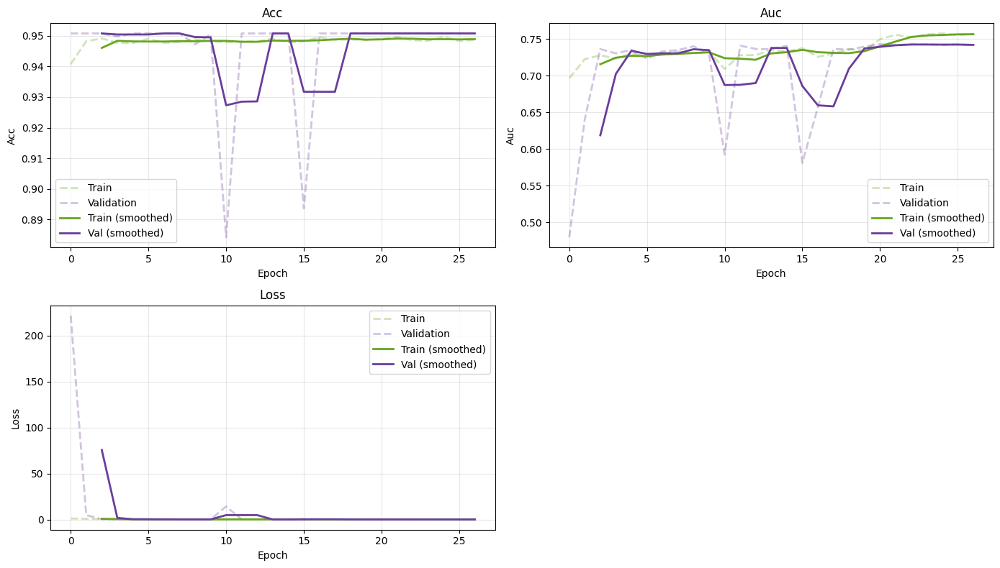

In [ ]:
plot_training_history(ResNet_local_64_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_64) / 64))

In [ ]:
evaluation = ResNet_local_64.evaluate(test_generator_64, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


Test loss     : 0.2092
Test accuracy : 0.9479
Test AUC      : 0.7370


In [ ]:
y_prob_R_l_64 = ResNet_local_64.predict(test_generator_64, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_64[:, i], y_prob_R_l_64[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}


Per-class AUROC
--------------------------------------------------------------------------------
atelectasis         : 0.5362579674507393
cardiomegaly        : 0.4829165087785777
effusion            : 0.45220057440037265
infiltration        : 0.5323086869636771
mass                : 0.4110188851660067
nodule              : 0.49806350520340587
pneumonia           : 0.40321611061015933
pneumothorax        : 0.5055149836313271
consolidation       : 0.5048739495798319
edema               : 0.45521632566069903
emphysema           : 0.4724622669428825
fibrosis            : 0.452856334841629
pleural_thickening  : 0.42228622631848434
hernia              : 0.8020554066130473


<ipython-input-12-635024071>:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap     = cm.get_cmap(base_cmap, n_classes)


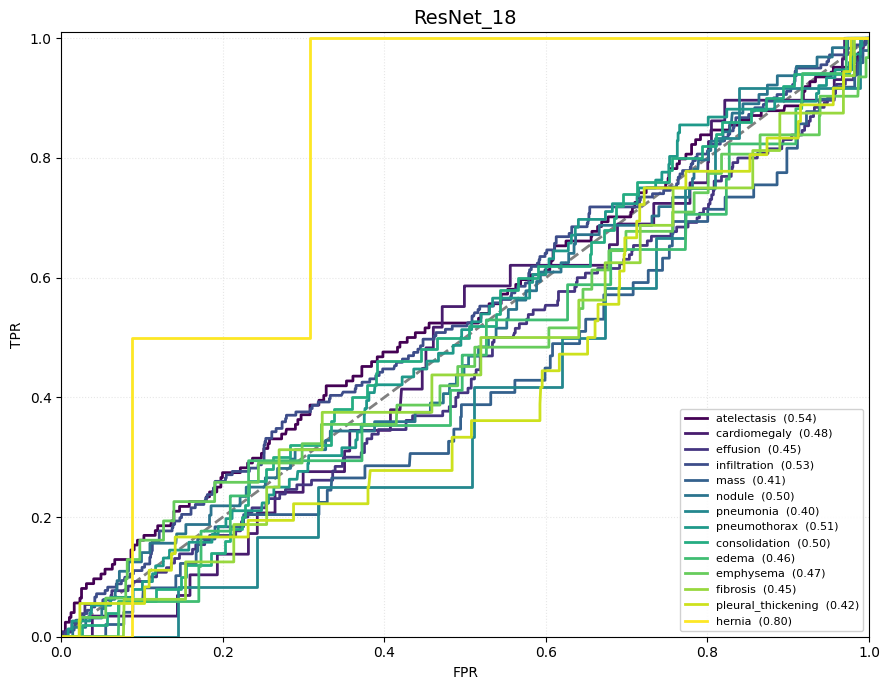

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_64,
    y_probs       = y_prob_R_l_64,
    model_name    = "ResNet_18")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/resnet_local_64.keras"
history_path = '/content/drive/MyDrive/chestMNIST/resnet_local_64_history.pkl'

ResNet_local_64 = keras.models.load_model(model_path)
ResNet_local_64_history = pickle.load(open(history_path, 'rb'))


#### 3- Fusion Branch

In [ ]:
train_images_64 = train_images_64 [1500:]
train_labels_64 = train_labels_64 [1500:]

In [ ]:
fusion_train_gen = data_generator_3(train_images_64, train_img_bbox_64_R, train_labels_64, batch_size=64, datagen=get_datagen(True))

fusion_val_gen   = data_generator_3(val_images_64, val_img_bbox_64_R, val_labels_64, batch_size=64, datagen=get_datagen(False))

fusion_test_gen = data_generator_3(test_images_64, test_img_bbox_64_R, test_labels_64, batch_size=64, datagen= get_datagen(False))

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/resnet_fusion_64'

ResNet_fusion_64, ResNet_fusion_64_history = run_experiment(
        loss='binary_crossentropy',
        batch_size=64,
        num_epochs=50,
        model= fusion_model(ResNet_global_64, ResNet_local_64, num_classes=14, hidden_units=256, dropout_rate=0.3, fine_tune_backbones=False),
        train_generator=fusion_train_gen,
        val_generator  =fusion_val_gen,
        model_base     = model_base)


Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 21s 341ms/step - acc: 0.9047 - auc: 0.6520 - loss: 0.2725 - val_acc: 0.9513 - val_auc: 0.7719 - val_loss: 0.1748 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - acc: 0.9477 - auc: 0.7615 - loss: 0.1825 - val_acc: 0.9492 - val_auc: 0.7936 - val_loss: 0.1716 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - acc: 0.9480 - auc: 0.7707 - loss: 0.1789 - val_acc: 0.9492 - val_auc: 0.7936 - val_loss: 0.1712 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - acc: 0.9479 - auc: 0.7783 - loss: 0.1773 - val_acc: 0.9492 - val_auc: 0.7946 - val_loss: 0.1706 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler setting learning rate 

##### Evaluation

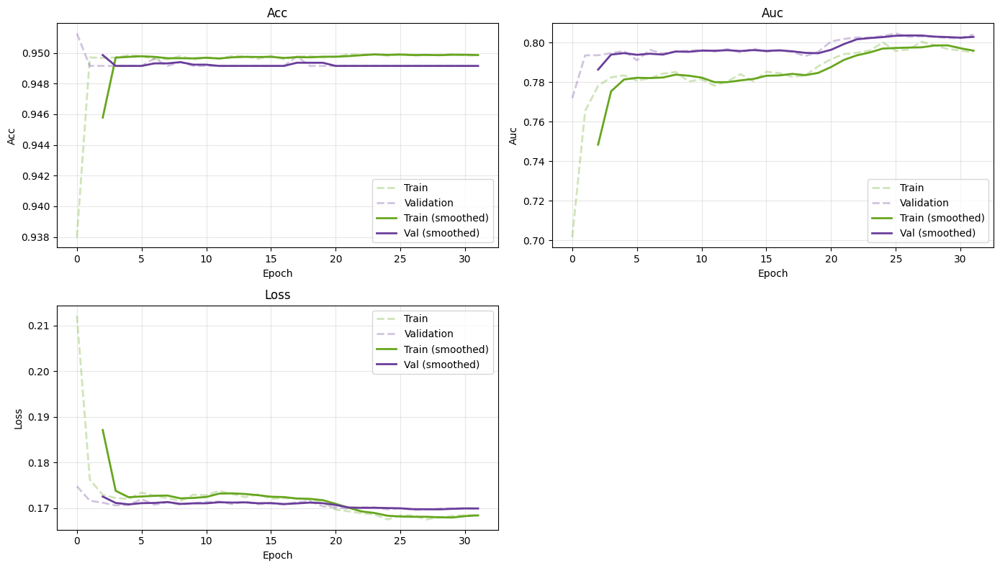

In [ ]:
plot_training_history(ResNet_fusion_64_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_64) / 64))

In [ ]:
evaluation = ResNet_fusion_64.evaluate(fusion_test_gen, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

Test loss     : 0.1781
Test accuracy : 0.9479
Test AUC      : 0.7814


In [ ]:
y_prob_R_F_64 = ResNet_fusion_64.predict(fusion_test_gen, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_64[:, i], y_prob_R_F_64[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}


Per-class AUROC
--------------------------------------------------------------------------------
atelectasis         : 0.7017665900928592
cardiomegaly        : 0.6640773020083365
effusion            : 0.7574012264224173
infiltration        : 0.6315269777830023
mass                : 0.48695933597319524
nodule              : 0.5912665562913908
pneumonia           : 0.6330778479110308
pneumothorax        : 0.6920674892974062
consolidation       : 0.7204668534080299
edema               : 0.8422847399829496
emphysema           : 0.6283219887540693
fibrosis            : 0.6204185520361991
pleural_thickening  : 0.6098822324628776
hernia              : 0.2975871313672922


<ipython-input-12-635024071>:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap     = cm.get_cmap(base_cmap, n_classes)


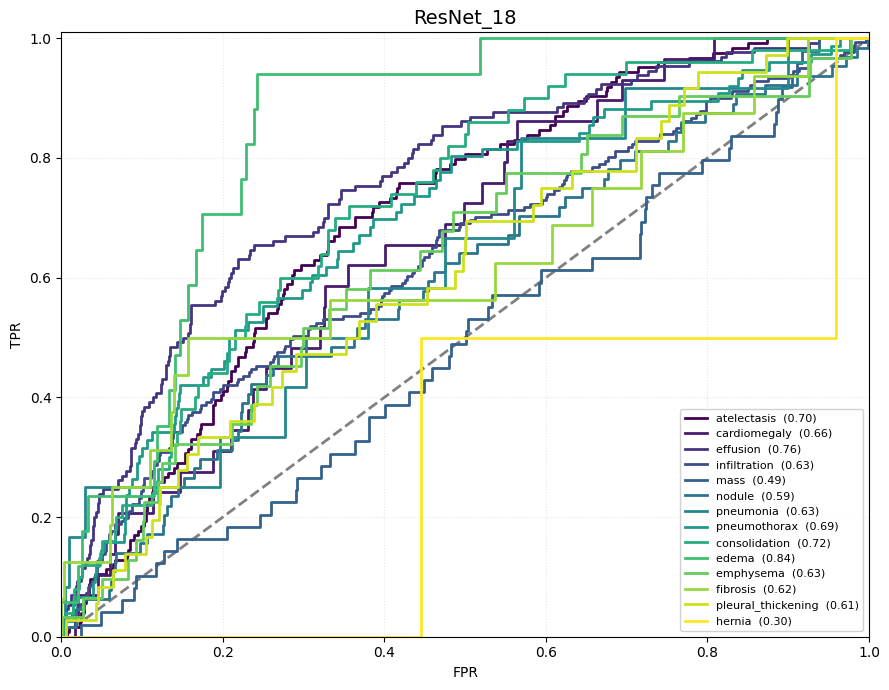

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_64,
    y_probs       = y_prob_R_F_64,
    model_name    = "ResNet_18")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/resnet_fusion_64.keras"
history_path = '/content/drive/MyDrive/chestMNIST/resnet_fusion_64_history.pkl'

ResNet_fusion_64 = keras.models.load_model(model_path)
ResNet_fusion_64_history = pickle.load(open(history_path, 'rb'))

<ipython-input-11-2729042748>:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name, len(model_names))


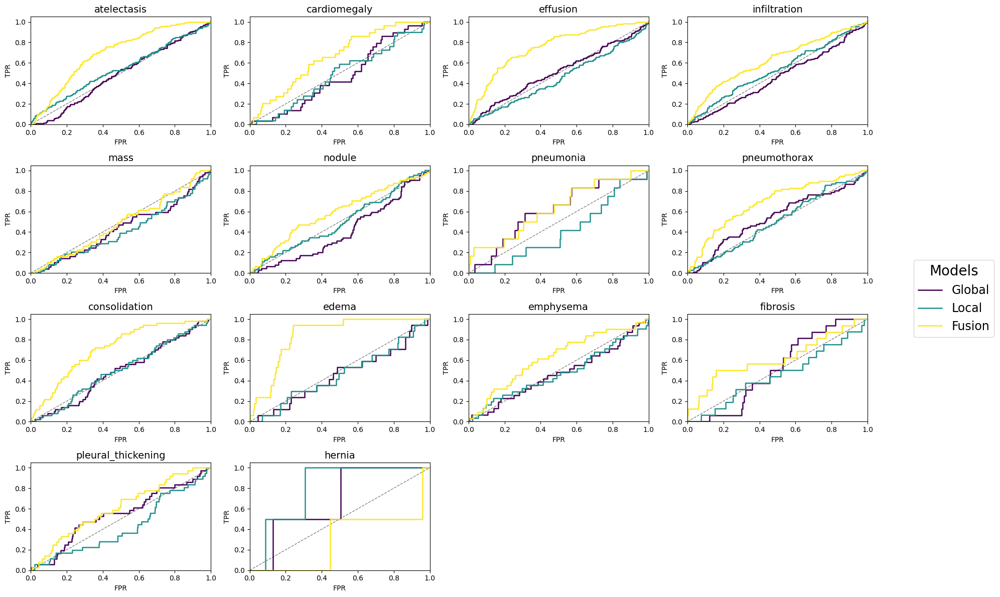

In [ ]:
plot_multimodel_roc(
    y_true           = test_labels_64,
    y_prob_list      = [y_prob_R_G_64, y_prob_R_l_64, y_prob_R_F_64],
    model_names      = ["Global", "Local", "Fusion"],
    class_labels     = CLASS_LABELS,
    n_cols           = 4,
    figsize          = (20, 12),
    cmap_name      = "viridis"
)

### 3) DenseNet_121

#### 1- Global Branch

In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/DenseNet_global_64'

DenseNet_global_64 , DenseNet_global_64_history = run_experiment(
    loss='binary_crossentropy',
    batch_size=64,
    num_epochs=50,
    model= DenseNet121(input_shape=(64, 64, 1), num_classes= 14, growth_rate=32, reduction=0.5),
    train_generator=train_generator_64,
    val_generator=valid_generator_64,
    model_base=model_base
)


Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


62/62 ━━━━━━━━━━━━━━━━━━━━ 209s 1s/step - acc: 0.9125 - auc: 0.6718 - loss: 0.2928 - val_acc: 0.8865 - val_auc: 0.5006 - val_loss: 732359360.0000 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - acc: 0.9447 - auc: 0.7159 - loss: 0.2163 - val_acc: 0.8860 - val_auc: 0.5062 - val_loss: 74.6874 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - acc: 0.9459 - auc: 0.7466 - loss: 0.1988 - val_acc: 0.9432 - val_auc: 0.6837 - val_loss: 0.2619 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 2s 39ms/step - acc: 0.9459 - auc: 0.7563 - loss: 0.1943 - val_acc: 0.9487 - val_auc: 0.6925 - val_loss: 0.1993 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler setting learning rate to 0.01.
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - acc: 

##### Evaluation

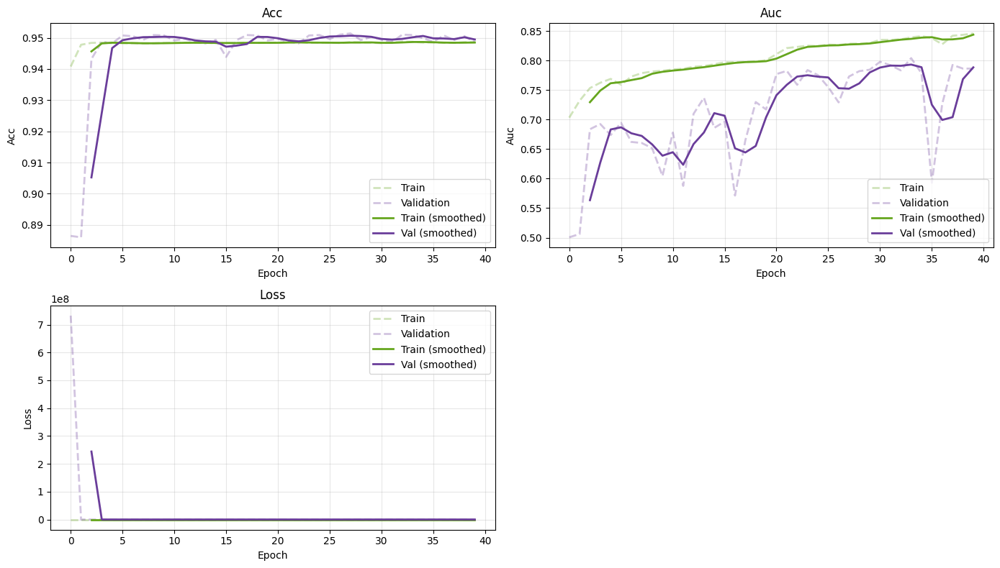

In [ ]:
plot_training_history(DenseNet_global_64_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_64) / 64))

In [ ]:
evaluation = DenseNet_global_64.evaluate(test_generator_64, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


Test loss     : 0.1793
Test accuracy : 0.9476
Test AUC      : 0.7815


In [ ]:
y_prob_D_G_64 = DenseNet_global_64.predict(test_generator_64, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_64[:, i], y_prob_D_G_64[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}


Per-class AUROC
--------------------------------------------------------------------------------
atelectasis         : 0.46822726243245866
cardiomegaly        : 0.5225464190981433
effusion            : 0.5061398742528914
infiltration        : 0.48849770777007173
mass                : 0.4951264087724641
nodule              : 0.5222475165562913
pneumonia           : 0.4670874661857529
pneumothorax        : 0.4928733316544951
consolidation       : 0.5041456582633054
edema               : 0.4382992327365729
emphysema           : 0.5735720627404558
fibrosis            : 0.30542986425339363
pleural_thickening  : 0.5604198668714797
hernia              : 0.4602323503127793


<ipython-input-14-dc71f3da9654>:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap     = cm.get_cmap(base_cmap, n_classes)


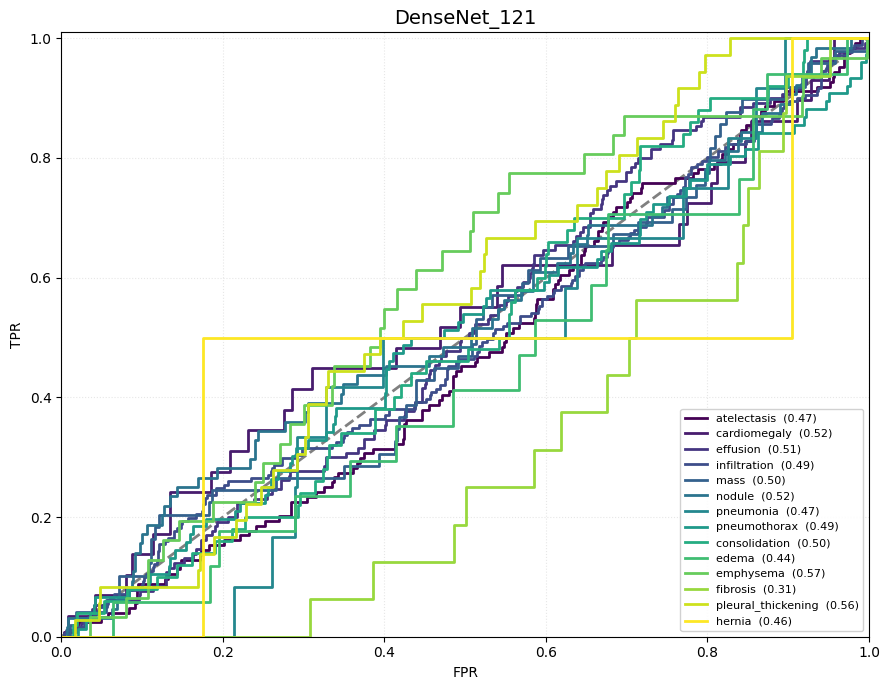

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_64,
    y_probs       = y_prob_D_G_64,
    model_name    = "DenseNet_121")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/DenseNet_global_64.keras"
history_path = '/content/drive/MyDrive/chestMNIST/DenseNet_global_64_history.pkl'

DenseNet_global_64 = keras.models.load_model(model_path)
DenseNet_global_64_history = pickle.load(open(history_path, 'rb'))

#### 2- Local Branch

##### Bounding Box

In [ ]:
batch_size = 1
train_generator2_64 = data_generator_2(train_images_64, train_labels_64, batch_size=1)
valid_generator2_64 = data_generator_2(val_images_64, val_labels_64, batch_size=1)
test_generator2_64 = data_generator_2(test_images_64, test_labels_64, batch_size=1)

In [ ]:
DenseNet_global_64.summary()

Model: "DenseNet121"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)  │ (None, 64, 64, 1) │          0 │ -                 │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 32, 32,    │      3,136 │ input[0][0]       │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 32, 32,    │        256 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_relu (ReLU)    │ (None, 32, 32,    │          0 │ stem_bn[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_pool           │ (None, 16, 16,    │          0 │ stem_relu[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb1_bn1      │ (None, 16, 16,    │        256 │ stem_pool[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb1_relu1    │ (None, 16, 16,    │          0 │ dense1_cb1_bn1[0… │
│ (ReLU)              │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb1_conv1    │ (None, 16, 16,    │      8,192 │ dense1_cb1_relu1… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb1_bn2      │ (None, 16, 16,    │        512 │ dense1_cb1_conv1… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb1_relu2    │ (None, 16, 16,    │          0 │ dense1_cb1_bn2[0… │
│ (ReLU)              │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb1_conv2    │ (None, 16, 16,    │     36,864 │ dense1_cb1_relu2… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_concat1      │ (None, 16, 16,    │          0 │ stem_pool[0][0],  │
│ (Concatenate)       │ 96)               │            │ dense1_cb1_conv2… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb2_bn1      │ (None, 16, 16,    │        384 │ dense1_concat1[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb2_relu1    │ (None, 16, 16,    │          0 │ dense1_cb2_bn1[0… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb2_conv1    │ (None, 16, 16,    │     12,288 │ dense1_cb2_relu1… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb2_bn2      │ (None, 16, 16,    │        512 │ dense1_cb2_conv1… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb2_relu2    │ (None, 16, 16,    │          0 │ dense1_cb2_bn2[0… │
│ (ReLU)              │ 128)              │            │                 

 Total params: 20,969,452 (79.99 MB)

 Trainable params: 6,961,934 (26.56 MB)

 Non-trainable params: 83,648 (326.75 KB)

 Optimizer params: 13,923,870 (53.12 MB)

In [ ]:
start_idx   = 3350
total_imgs  = len(train_images_64)
num_samples = total_imgs - start_idx

out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "train_bbox_DenseNet_64.npz")

cropped_images_list, labels_list, bboxes_list = [], [], []

# ── 0·A.  Fast-forward generator so we start at image 3350 ──────────────────
skipped = 0
while skipped < start_idx:
    batch_imgs, _ = next(train_generator2_64)
    skipped += batch_imgs.shape[0]

# ── 0·B.  Progress bar for the *remaining* images ────────────────────────────
pbar = tqdm(total=num_samples,
            desc=f"Processing images {start_idx}-{total_imgs-1}",
            unit="img",
            leave=False,
            ncols=80,
            mininterval=0.2)

processed = 0

# ── 1.  Main loop (unchanged apart from the loop-guard) ──────────────────────
while processed < num_samples:
    img, lbl = next(train_generator2_64)
    B = img.shape[0]


    heatmaps = generate_heatmaps_batch(img, DenseNet_global_64, "relu_final", "predictions")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.7)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox, target_sz=(64,64))[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))

    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save just the processed images ───────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)

print(f"\nDone!  Saved {num_samples} cropped images (indexes {start_idx}-{total_imgs-1}) to:\n{out_path}")


Processing images 3350-3922:   0%|                     | 0/573 [00:00<?, ?img/s]


Done!  Saved 573 cropped images (indexes 3350-3922) to:
/content/drive/MyDrive/chestMNIST/BBox/train_bbox_DenseNet_64.npz


In [ ]:
start_idx   = 450
total_imgs  = len(val_images_64)
num_samples = total_imgs - start_idx

out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "val_bbox_DenseNet_64.npz")

cropped_images_list, labels_list, bboxes_list = [], [], []

# ── 0·A.  Fast-forward generator so we start at image 450 ──────────────────
skipped = 0
while skipped < start_idx:
    batch_imgs, _ = next(valid_generator2_64)
    skipped += batch_imgs.shape[0]

# ── 0·B.  Progress bar for the *remaining* images ────────────────────────────
pbar = tqdm(total=num_samples,
            desc=f"Processing images {start_idx}-{total_imgs-1}",
            unit="img",
            leave=False,
            ncols=80,
            mininterval=0.2)

processed = 0

# ── 1.  Main loop (unchanged apart from the loop-guard) ──────────────────────
while processed < num_samples:
    img, lbl = next(valid_generator2_64)     # a *batch*
    B = img.shape[0]


    heatmaps = generate_heatmaps_batch(img, DenseNet_global_64, "relu_final", "predictions")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.7)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox, target_sz=(64,64))[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))

    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save just the processed images ───────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)

print(f"\nDone!  Saved {num_samples} cropped images (indexes {start_idx}-{total_imgs-1}) to:\n{out_path}")


Processing images 450-559:   0%|                       | 0/110 [00:00<?, ?img/s]


Done!  Saved 110 cropped images (indexes 450-559) to:
/content/drive/MyDrive/chestMNIST/BBox/val_bbox_DenseNet_64.npz


In [ ]:
start_idx   = 950
total_imgs  = len(test_images_64)
num_samples = total_imgs - start_idx

out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "test_bbox_DenseNet_64.npz")

cropped_images_list, labels_list, bboxes_list = [], [], []

# ── 0·A.  Fast-forward generator so we start at image 950 ──────────────────
skipped = 0
while skipped < start_idx:
    batch_imgs, _ = next(test_generator2_64)
    skipped += batch_imgs.shape[0]

# ── 0·B.  Progress bar for the *remaining* images ────────────────────────────
pbar = tqdm(total=num_samples,
            desc=f"Processing images {start_idx}-{total_imgs-1}",
            unit="img",
            leave=False,
            ncols=80,
            mininterval=0.2)

processed = 0

# ── 1.  Main loop (unchanged apart from the loop-guard) ──────────────────────
while processed < num_samples:
    img, lbl = next(test_generator2_64)
    B = img.shape[0]


    heatmaps = generate_heatmaps_batch(img, DenseNet_global_64, "relu_final", "predictions")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.7)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox, target_sz=(64,64))[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))

    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save just the processed images ───────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)

print(f"\nDone!  Saved {num_samples} cropped images (indexes {start_idx}-{total_imgs-1}) to:\n{out_path}")


Processing images 950-1120:   0%|                      | 0/171 [00:00<?, ?img/s]


Done!  Saved 171 cropped images (indexes 950-1120) to:
/content/drive/MyDrive/chestMNIST/BBox/test_bbox_DenseNet_64.npz


##### Loading Bbox Images

In [ ]:
data_4 = np.load('/content/drive/MyDrive/chestMNIST/BBox/train_bbox_DenseNet_64.npz')
train_img_bbox_64_D = data_4['images']
train_img_bbox_64_D = np.squeeze(train_img_bbox_64_D)
train_lbl_bbox_64_D = data_4['labels']
train_lbl_bbox_64_D = np.squeeze(train_lbl_bbox_64_D)

In [ ]:
data_5 = np.load('/content/drive/MyDrive/chestMNIST/BBox/val_bbox_DenseNet_64.npz')
val_img_bbox_64_D = data_5['images']
val_img_bbox_64_D = np.squeeze(val_img_bbox_64_D)
val_lbl_bbox_64_D = data_5['labels']
val_lbl_bbox_64_D = np.squeeze(val_lbl_bbox_64_D)

In [ ]:
data_6 = np.load('/content/drive/MyDrive/chestMNIST/BBox/test_bbox_DenseNet_64.npz')
test_img_bbox_64_D = data_6['images']
test_img_bbox_64_D = np.squeeze(test_img_bbox_64_D)
test_lbl_bbox_64_D = data_6['labels']
test_lbl_bbox_64_D = np.squeeze(test_lbl_bbox_64_D)

##### Run the Model

In [ ]:
SEED = 42

In [ ]:
train_generator_64 = data_generator_1(train_img_bbox_64_D, train_lbl_bbox_64_D, batch_size=64, augmentation=True, seed=SEED)
valid_generator_64 = data_generator_1(val_img_bbox_64_D, val_lbl_bbox_64_D, batch_size=64, augmentation=False, seed=SEED)
test_generator_64 = data_generator_1(test_img_bbox_64_D, test_lbl_bbox_64_D,batch_size=64, augmentation=False, seed=SEED)

In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/DenseNet_local_64'

DenseNet_local_64 , DenseNet_local_64_history = run_experiment(
    loss='binary_crossentropy',
    batch_size=64,
    num_epochs=50,
    model= DenseNet121(input_shape=(64, 64, 1), num_classes= 14, growth_rate=16, reduction=0.5),
    train_generator=train_generator_64,
    val_generator=valid_generator_64,
    model_base=model_base
)


Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


62/62 ━━━━━━━━━━━━━━━━━━━━ 318s 2s/step - acc: 0.9093 - auc: 0.6817 - loss: 0.2489 - val_acc: 0.9097 - val_auc: 0.5794 - val_loss: 577511.3750 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 22s 356ms/step - acc: 0.9524 - auc: 0.7829 - loss: 0.1718 - val_acc: 0.9464 - val_auc: 0.5539 - val_loss: 135.7302 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - acc: 0.9517 - auc: 0.7971 - loss: 0.1692 - val_acc: 0.9464 - val_auc: 0.5911 - val_loss: 12.9065 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - acc: 0.9518 - auc: 0.8344 - loss: 0.1587 - val_acc: 0.9281 - val_auc: 0.6346 - val_loss: 1.2032 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler setting learning rate to 0.01.
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 76ms/step - acc:

##### Evaluation

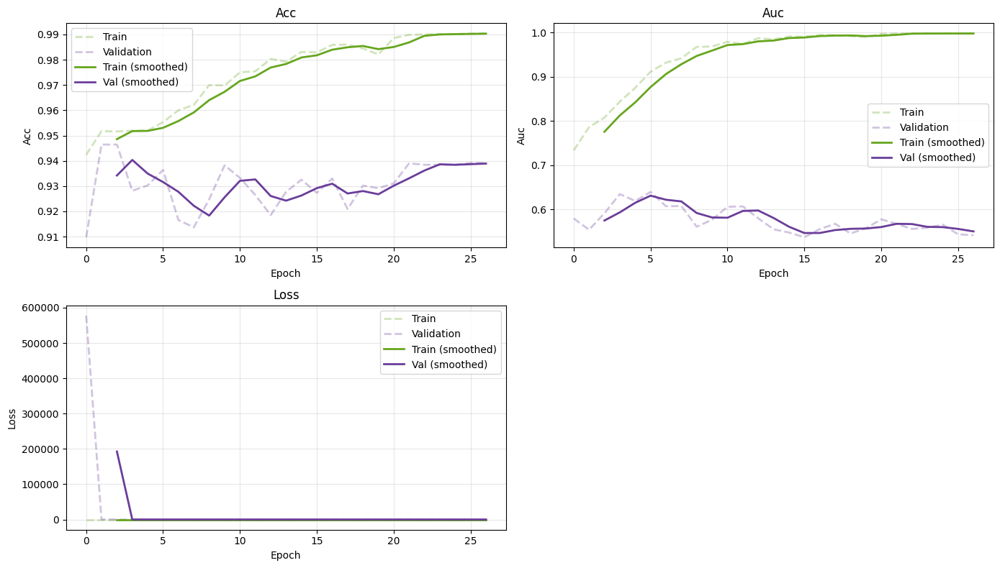

In [ ]:
plot_training_history(DenseNet_local_64_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_64) / 64))

In [ ]:
evaluation = DenseNet_local_64.evaluate(test_generator_64, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


Test loss     : 0.5159
Test accuracy : 0.9319
Test AUC      : 0.5967


In [ ]:
y_prob_D_l_64 = DenseNet_local_64.predict(test_generator_64, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_64[:, i], y_prob_D_l_64[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}


Per-class AUROC
--------------------------------------------------------------------------------
atelectasis         : 0.5916730328495035
cardiomegaly        : 0.5058823529411764
effusion            : 0.5570079883805374
infiltration        : 0.5105990783410139
mass                : 0.40243902439024387
nodule              : 0.5720858895705522
pneumonia           : 0.16568047337278102
pneumothorax        : 0.40847127555988316
consolidation       : 0.429192546583851
edema               : 0.6329365079365079
emphysema           : 0.39759036144578314
fibrosis            : 0.9097633136094674
pleural_thickening  : 0.6267676767676768
hernia              : undef


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_ranking.py:379: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


<ipython-input-18-635024071>:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap     = cm.get_cmap(base_cmap, n_classes)
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_ranking.py:1188: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


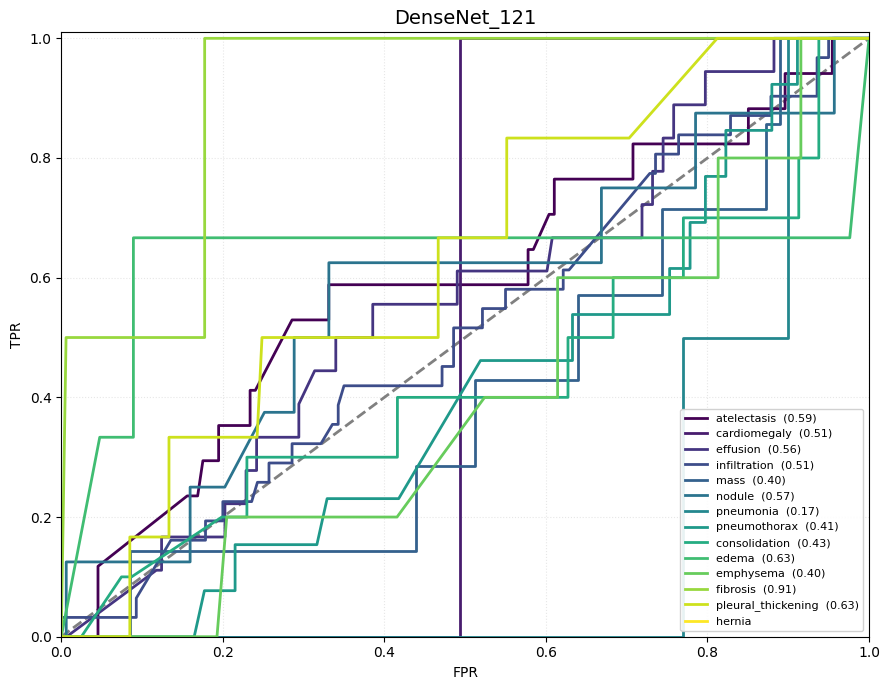

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_64,
    y_probs       = y_prob_D_l_64,
    model_name    = "DenseNet_121")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/DenseNet_local_64.keras"
history_path = '/content/drive/MyDrive/chestMNIST/DenseNet_local_64_history.pkl'

DenseNet_local_64 = keras.models.load_model(model_path)
DenseNet_local_64_history = pickle.load(open(history_path, 'rb'))

#### 3- Fusion Branch

In [ ]:
train_images_64 = train_images_64[3350:]
train_labels_64 = train_labels_64[3350:]
val_images_64 = val_images_64[450:]
val_labels_64 = val_labels_64 [450:]
test_images_64 = test_images_64[950:]
test_labels_64 = test_labels_64[950:]

In [ ]:
fusion_train_gen = data_generator_3(train_images_64, train_img_bbox_64_D, train_labels_64, batch_size=64, datagen=get_datagen(True))
fusion_val_gen   = data_generator_3(val_images_64, val_img_bbox_64_D, val_labels_64, batch_size=64, datagen=get_datagen(False))
fusion_test_gen = data_generator_3(test_images_64,test_img_bbox_64_D, test_labels_64, batch_size=64, datagen= get_datagen(False))

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/DenseNet_fusion_64'

DenseNet_fusion_64 , DenseNet_fusion_64_history = run_experiment(
        loss='binary_crossentropy',
        batch_size=64,
        num_epochs=50,
        model= fusion_model(DenseNet_global_64, DenseNet_local_64, num_classes=14, hidden_units=256, dropout_rate=0.3, fine_tune_backbones=False),
        train_generator=fusion_train_gen,
        val_generator  =fusion_val_gen,
        model_base     = model_base)


Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 130s 8s/step - acc: 0.8491 - auc: 0.6416 - loss: 0.4138 - val_acc: 0.9513 - val_auc: 0.5946 - val_loss: 0.2661 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - acc: 0.9470 - auc: 0.7463 - loss: 0.2201 - val_acc: 0.9526 - val_auc: 0.6108 - val_loss: 0.3185 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 135ms/step - acc: 0.9487 - auc: 0.8036 - loss: 0.2209 - val_acc: 0.9513 - val_auc: 0.6728 - val_loss: 0.2840 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 143ms/step - acc: 0.9496 - auc: 0.8558 - loss: 0.2108 - val_acc: 0.9487 - val_auc: 0.6897 - val_loss: 0.2660 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler setting learning rate to 0.01.

##### Evaluation

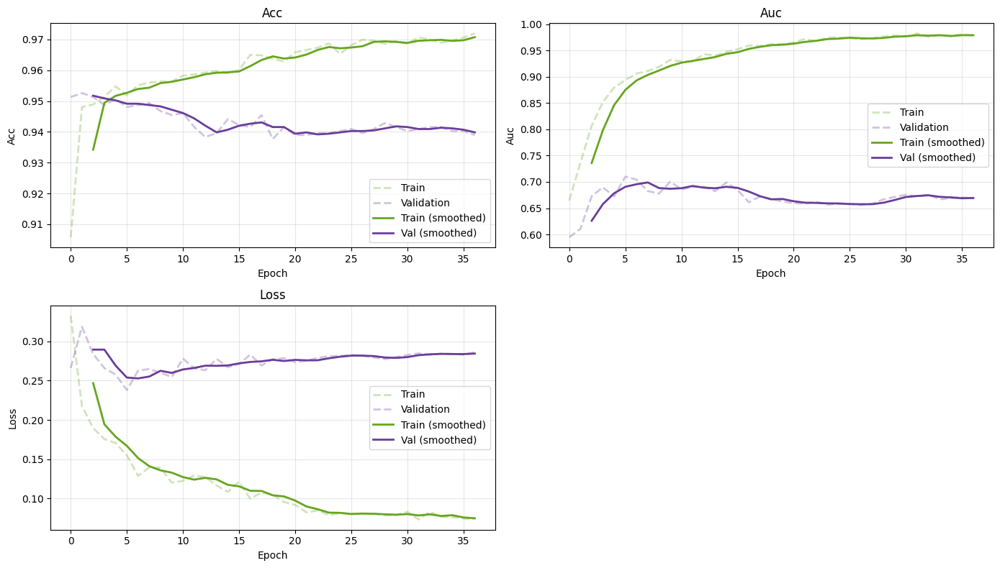

In [ ]:
plot_training_history(DenseNet_fusion_64_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_64) / 64))

In [ ]:
evaluation = DenseNet_fusion_64.evaluate(fusion_test_gen, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

Test loss     : 0.3473
Test accuracy : 0.9424
Test AUC      : 0.6549


In [ ]:
y_prob_D_F_64 = DenseNet_fusion_64.predict(fusion_test_gen, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_64[:, i], y_prob_D_F_64[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}


Per-class AUROC
--------------------------------------------------------------------------------
atelectasis         : 0.44041252864782277
cardiomegaly        : 0.5470588235294118
effusion            : 0.5798838053740014
infiltration        : 0.4421658986175115
mass                : 0.6228222996515679
nodule              : 0.5613496932515338
pneumonia           : 0.4260355029585799
pneumothorax        : 0.5569620253164558
consolidation       : 0.6006211180124224
edema               : 0.501984126984127
emphysema           : 0.627710843373494
fibrosis            : 0.050295857988165715
pleural_thickening  : 0.40404040404040403
hernia              : undef


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_ranking.py:379: UndefinedMetricWarning: Only one class is present in y_true. ROC AUC score is not defined in that case.
  warnings.warn(


In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_64,
    y_probs       = y_prob_D_F_64,
    model_name    = "DenseNet_121")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/densenet_fusion_64.keras"
history_path = '/content/drive/MyDrive/chestMNIST/densenet_fusion_64_history.pkl'

DenseNet_fusion_64 = keras.models.load_model(model_path)
DenseNet_fusion_64_history = pickle.load(open(history_path, 'rb'))

In [ ]:
plot_multimodel_roc(
    y_true           = test_labels_64,
    y_prob_list      = [y_prob_D_G_64, y_prob_D_l_64, y_prob_D_F_64],
    model_names      = ["Global", "Local", "Fusion"],
    class_labels     = CLASS_LABELS,
    n_cols           = 4,
    figsize          = (20, 12),
    cmap_name      = "viridis"
)

##ChestMnist_128

In [ ]:
SEED = 42

In [ ]:
train_img_128, train_lbl_128, val_img_128, val_lbl_128, test_img_128, test_lbl_128 = load_dataset(128)

In [ ]:
train_images_128, train_labels_128 = subsample(train_img_128, train_lbl_128, seed=SEED)
val_images_128, val_labels_128   = subsample(val_img_128, val_lbl_128, seed=SEED)
test_images_128, test_labels_128  = subsample(test_img_128, test_lbl_128, seed=SEED)

In [ ]:
train_generator_128 = data_generator_1(train_images_128, train_labels_128, batch_size=64, augmentation=True, seed=SEED)
valid_generator_128 = data_generator_1(val_images_128, val_labels_128, batch_size=64, augmentation=False, seed=SEED)
test_generator_128 = data_generator_1(test_images_128, test_labels_128,batch_size=64, augmentation=False, seed=SEED)

### 1) 5layer_CNN

#### 1- Global Branch

In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/CNN_global_128'

CNN_global_128 , CNN_global_128_history = run_experiment(
    loss='binary_crossentropy',
    batch_size=128,
    num_epochs=50,
    model=CNN5layers((128, 128, 1), num_classes=14),
    train_generator=train_generator_128,
    val_generator=valid_generator_128,
    model_base=model_base
)

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(



Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step - acc: 0.8818 - auc: 0.6318 - loss: 0.4080 - val_acc: 0.9478 - val_auc: 0.5000 - val_loss: 5.1638 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 12s 400ms/step - acc: 0.9517 - auc: 0.7430 - loss: 0.2059 - val_acc: 0.9518 - val_auc: 0.7300 - val_loss: 0.2046 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - acc: 0.9444 - auc: 0.7463 - loss: 0.2063 - val_acc: 0.9478 - val_auc: 0.7628 - val_loss: 0.2229 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - acc: 0.9516 - auc: 0.7350 - loss: 0.1891 - val_acc: 0.9511 - val_auc: 0.7121 - val_loss: 0.2354 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler setting learning rat

##### Evaluation

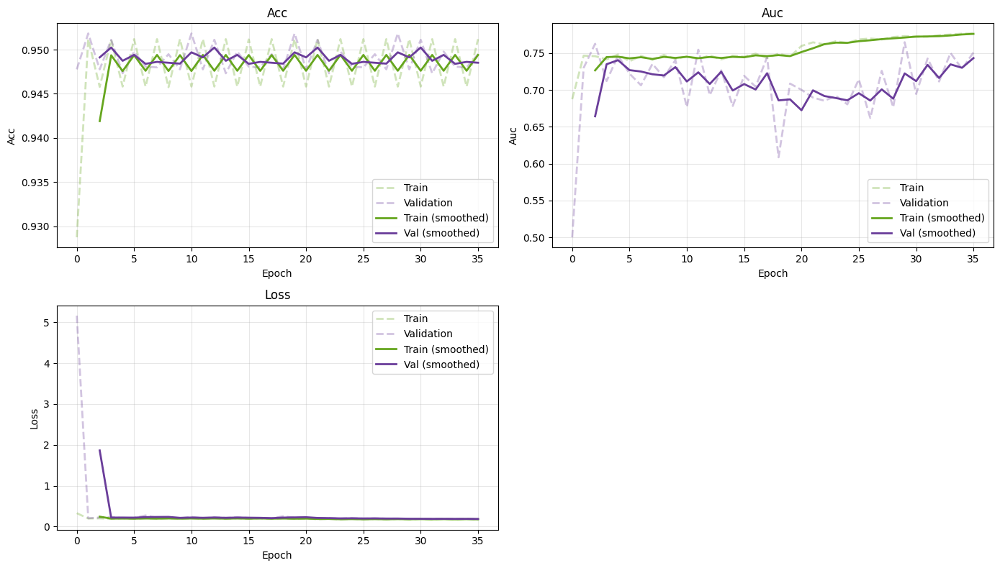

In [ ]:
plot_training_history(CNN_global_128_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_128) / 64))

In [ ]:
evaluation = CNN_global_128.evaluate(test_generator_128, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


Test loss     : 0.1907
Test accuracy : 0.9479
Test AUC      : 0.7445


In [ ]:
y_prob_C_G_128 = CNN_global_128.predict(test_generator_128, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_128[:, i], y_prob_C_G_128[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}


Per-class AUROC
--------------------------------------------------------------------------------
atelectasis         : 0.48747856472643736
cardiomegaly        : 0.45970695970695974
effusion            : 0.5227353877202514
infiltration        : 0.47172328670506647
mass                : 0.45983094730429475
nodule              : 0.5113972327341532
pneumonia           : 0.5492185151788398
pneumothorax        : 0.48807605137245025
consolidation       : 0.4452287581699347
edema               : 0.5138533674339301
emphysema           : 0.4631991713524711
fibrosis            : 0.4475678733031675
pleural_thickening  : 0.5363031233998976
hernia              : 0.3297587131367292


<ipython-input-17-dc71f3da9654>:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap     = cm.get_cmap(base_cmap, n_classes)


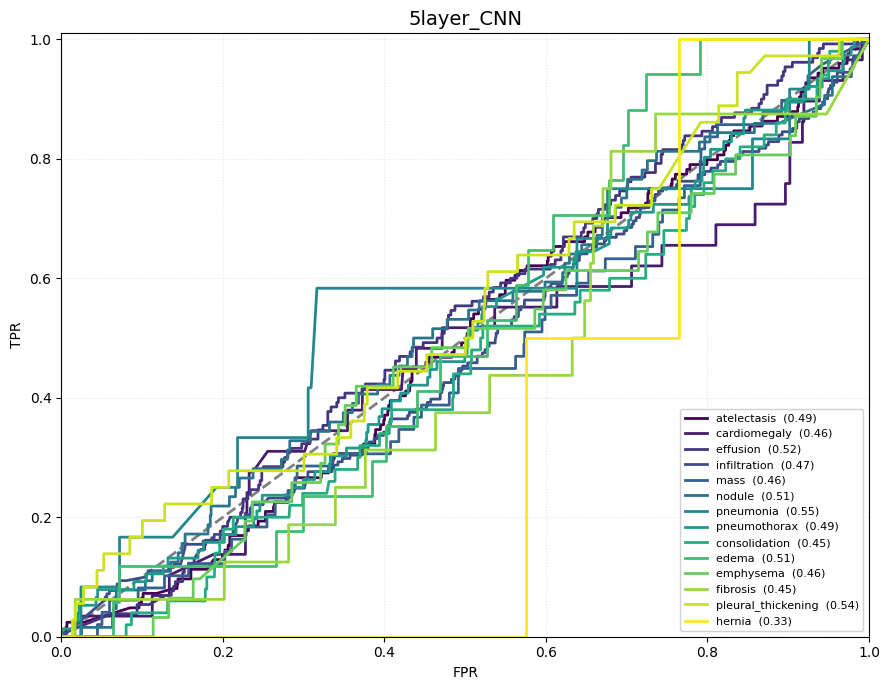

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_128,
    y_probs       = y_prob_C_G_128,
    model_name    = "5layer_CNN")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/CNN_global_128.keras"
history_path = '/content/drive/MyDrive/chestMNIST/CNN_global_128_history.pkl'

CNN_global_128 = keras.models.load_model(model_path)
CNN_global_128_history = pickle.load(open(history_path, 'rb'))


#### 2- Local Branch

##### Boundin Box

In [ ]:
batch_size = 1
train_generator2_128 = data_generator_2(train_images_128, train_labels_128, batch_size=1)
valid_generator2_128 = data_generator_2(val_images_128, val_labels_128, batch_size=1)
test_generator2_128 = data_generator_2(test_images_128, test_labels_128, batch_size=1)

In [ ]:
CNN_global_128.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 128, 128, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu (ReLU)                    │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_1 (ReLU)                  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_2 (ReLU)                  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_3 (ReLU)                  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 8, 8, 256)      │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 8, 8, 256)      │         1,02

 Total params: 2,950,444 (11.26 MB)

 Trainable params: 982,990 (3.75 MB)

 Non-trainable params: 1,472 (5.75 KB)

 Optimizer params: 1,965,982 (7.50 MB)

In [ ]:
out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "train_bbox_CNN_128.npz")

num_samples = len(train_images_128)
cropped_images_list, labels_list, bboxes_list = [], [], []

processed = 0
pbar = tqdm(total=num_samples,
            desc='Processing images',
            unit='img',
            leave=False,
            ncols=80,
            mininterval=0.2)

# ── 1.  Loop until we have seen every image exactly once ──────────────────────
while processed < num_samples:
    img, lbl = next(train_generator2_128)
    B = img.shape[0]

    heatmaps = generate_heatmaps_batch(img, CNN_global_128, "re_lu_4", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.7)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox, target_sz=(128, 128))[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))


    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save everything ───────────────────────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)


print(f"\nDone!  Saved one epoch of masked data to:\n{out_path}")



Processing images:   0%|                              | 0/3923 [00:00<?, ?img/s]


Done!  Saved one epoch of masked data to:
/content/drive/MyDrive/chestMNIST/BBox/train_bbox_CNN_128.npz


In [ ]:
out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "val_bbox_CNN_128.npz")

num_samples = len(val_images_128)
cropped_images_list, labels_list, bboxes_list = [], [], []

processed = 0
pbar = tqdm(total=num_samples,
            desc='Processing images',
            unit='img',
            leave=False,
            ncols=80,
            mininterval=0.2)


# ── 1.  Loop until we have seen every image exactly once ──────────────────────
while processed < num_samples:
    img, lbl = next(valid_generator2_128)
    B = img.shape[0]

    heatmaps = generate_heatmaps_batch(img, CNN_global_128, "re_lu_4", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.7)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox, target_sz=(128, 128))[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))


    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save everything ───────────────────────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)


print(f"\nDone!  Saved one epoch of masked data to:\n{out_path}")



Processing images:   0%|                               | 0/560 [00:00<?, ?img/s]


Done!  Saved one epoch of masked data to:
/content/drive/MyDrive/chestMNIST/BBox/val_bbox_CNN_128.npz


In [ ]:
out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "test_bbox_CNN_128.npz")

num_samples = len(test_images_128)
cropped_images_list, labels_list, bboxes_list = [], [], []

processed = 0

pbar = tqdm(total=num_samples,
            desc='Processing images',
            unit='img',
            leave=False,
            ncols=80,
            mininterval=0.2)


# ── 1.  Loop until we have seen every image exactly once ──────────────────────
while processed < num_samples:
    img, lbl = next(test_generator2_128)
    B = img.shape[0]

    heatmaps = generate_heatmaps_batch(img, CNN_global_128, "re_lu_4", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.7)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox, target_sz=(128, 128))[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))


    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save everything ───────────────────────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)


print(f"\nDone!  Saved one epoch of masked data to:\n{out_path}")



Processing images:   0%|                              | 0/1121 [00:00<?, ?img/s]


Done!  Saved one epoch of masked data to:
/content/drive/MyDrive/chestMNIST/BBox/test_bbox_CNN_128.npz


##### Loding BBOX Images

In [ ]:
data_1 = np.load('/content/drive/MyDrive/chestMNIST/BBox/train_bbox_CNN_128.npz')
train_img_bbox_128_cnn = data_1['images']
train_img_bbox_128_cnn = np.squeeze(train_img_bbox_128_cnn)
train_lbl_bbox_128_cnn = data_1['labels']
train_lbl_bbox_128_cnn = np.squeeze(train_lbl_bbox_128_cnn)

In [ ]:
data_2 = np.load('/content/drive/MyDrive/chestMNIST/BBox/val_bbox_CNN_128.npz')
val_img_bbox_128_cnn = data_2['images']
val_img_bbox_128_cnn = np.squeeze(val_img_bbox_128_cnn)
val_lbl_bbox_128_cnn = data_2['labels']
val_lbl_bbox_128_cnn = np.squeeze(val_lbl_bbox_128_cnn)

In [ ]:
data_3 = np.load('/content/drive/MyDrive/chestMNIST/BBox/test_bbox_CNN_128.npz')
test_img_bbox_128_cnn = data_3['images']
test_img_bbox_128_cnn = np.squeeze(test_img_bbox_128_cnn)
test_lbl_bbox_128_cnn = data_3['labels']
test_lbl_bbox_128_cnn = np.squeeze(test_lbl_bbox_128_cnn)

In [ ]:
test_img_bbox_128_cnn.shape

(1121, 128, 128)

##### Run the Model

In [ ]:
SEED = 42

In [ ]:
train_generator_128 = data_generator_1(train_img_bbox_128_cnn, train_lbl_bbox_128_cnn, batch_size=64, augmentation=True, seed=SEED)
valid_generator_128 = data_generator_1(val_img_bbox_128_cnn, val_lbl_bbox_128_cnn, batch_size=64, augmentation=False, seed=SEED)
test_generator_128 = data_generator_1(test_img_bbox_128_cnn, test_lbl_bbox_128_cnn,batch_size=64, augmentation=False, seed=SEED)

In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/CNN_local_128'

CNN_local_128 , CNN_local_128_history = run_experiment(
    loss='binary_crossentropy',
    batch_size=64,
    num_epochs=50,
    model=CNN5layers((128, 128, 1), num_classes=14),
    train_generator=train_generator_128,
    val_generator=valid_generator_128,
    model_base=model_base
)

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(



Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 46s 396ms/step - acc: 0.8962 - auc: 0.6313 - loss: 0.3920 - val_acc: 0.9508 - val_auc: 0.6449 - val_loss: 0.2420 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - acc: 0.9457 - auc: 0.7163 - loss: 0.2282 - val_acc: 0.9492 - val_auc: 0.7378 - val_loss: 0.2085 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 104ms/step - acc: 0.9456 - auc: 0.7166 - loss: 0.2238 - val_acc: 0.9492 - val_auc: 0.7272 - val_loss: 0.2220 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 8s 127ms/step - acc: 0.9455 - auc: 0.7186 - loss: 0.2256 - val_acc: 0.9492 - val_auc: 0.7318 - val_loss: 0.2194 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler setting learning ra

##### Evaluation

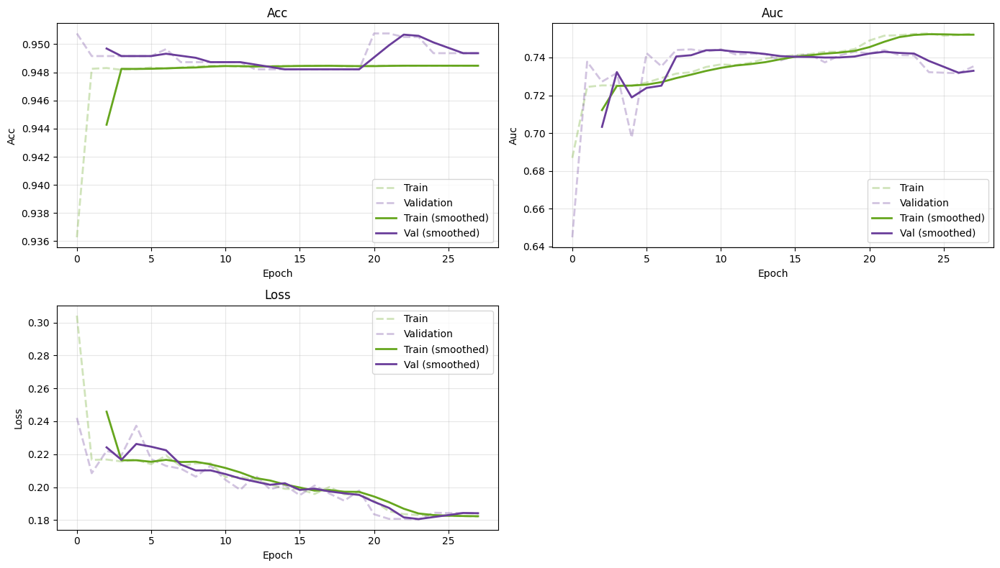

In [ ]:
plot_training_history(CNN_local_128_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_128) / 64))

In [ ]:
evaluation = CNN_local_128.evaluate(test_generator_128, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


Test loss     : 0.1885
Test accuracy : 0.9479
Test AUC      : 0.7369


In [ ]:
y_prob_C_l_128 = CNN_local_128.predict(test_generator_128, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_128[:, i], y_prob_C_l_128[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}


Per-class AUROC
--------------------------------------------------------------------------------
atelectasis         : 0.5281449186268483
cardiomegaly        : 0.4964633068081344
effusion            : 0.5197974074361562
infiltration        : 0.5006288938521218
mass                : 0.5066821504721292
nodule              : 0.4794598509933775
pneumonia           : 0.37717914036669664
pneumothorax        : 0.5144925711407706
consolidation       : 0.5284220354808591
edema               : 0.48087169650468886
emphysema           : 0.5288250961823026
fibrosis            : 0.43885746606334847
pleural_thickening  : 0.4784818228366615
hernia              : 0.7768096514745308


<ipython-input-17-dc71f3da9654>:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap     = cm.get_cmap(base_cmap, n_classes)


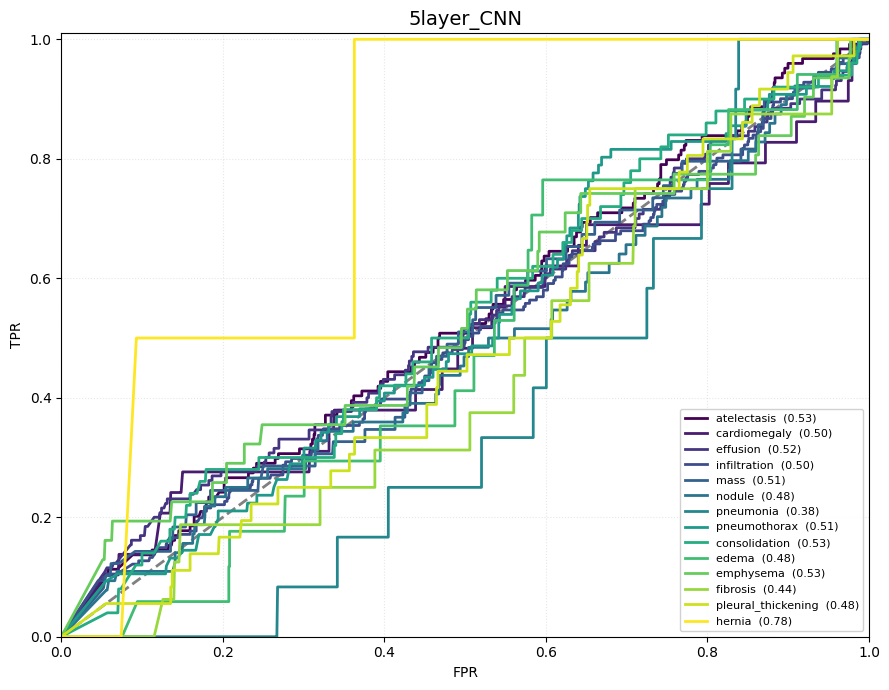

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_128,
    y_probs       = y_prob_C_l_128,
    model_name    = "5layer_CNN")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/CNN_local_128.keras"
history_path = '/content/drive/MyDrive/chestMNIST/CNN_local_128_history.pkl'

CNN_local_128 = keras.models.load_model(model_path)
CNN_local_128_history = pickle.load(open(history_path, 'rb'))

#### 3- Fiusion Branch

In [ ]:
fusion_train_gen = data_generator_3(train_images_128, train_img_bbox_128_cnn, train_labels_128, batch_size=64, datagen=get_datagen(True))

fusion_val_gen = data_generator_3(val_images_128, val_img_bbox_128_cnn, val_labels_128, batch_size=64, datagen=get_datagen(False))

fusion_test_gen = data_generator_3(test_images_128, test_img_bbox_128_cnn, test_labels_128, batch_size=64, datagen= get_datagen(False))

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/CNN_fusion_128'

CNN_fusion_128, CNN_fusion_128_history = run_experiment(
        loss='binary_crossentropy',
        batch_size=64,
        num_epochs=50,
        model= fusion_model(CNN_global_128, CNN_local_128, num_classes=14, hidden_units=256, dropout_rate=0.3, fine_tune_backbones=False),
        train_generator=fusion_train_gen,
        val_generator  =fusion_val_gen,
        model_base     = model_base)


Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 55s 730ms/step - acc: 0.9141 - auc: 0.6606 - loss: 0.2563 - val_acc: 0.9508 - val_auc: 0.7563 - val_loss: 0.1761 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 38s 621ms/step - acc: 0.9459 - auc: 0.7413 - loss: 0.1912 - val_acc: 0.9508 - val_auc: 0.7575 - val_loss: 0.1765 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 12s 191ms/step - acc: 0.9460 - auc: 0.7449 - loss: 0.1903 - val_acc: 0.9492 - val_auc: 0.7602 - val_loss: 0.1806 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 20s 335ms/step - acc: 0.9460 - auc: 0.7437 - loss: 0.1906 - val_acc: 0.9497 - val_auc: 0.7617 - val_loss: 0.1799 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler setting learning

##### Evaluation

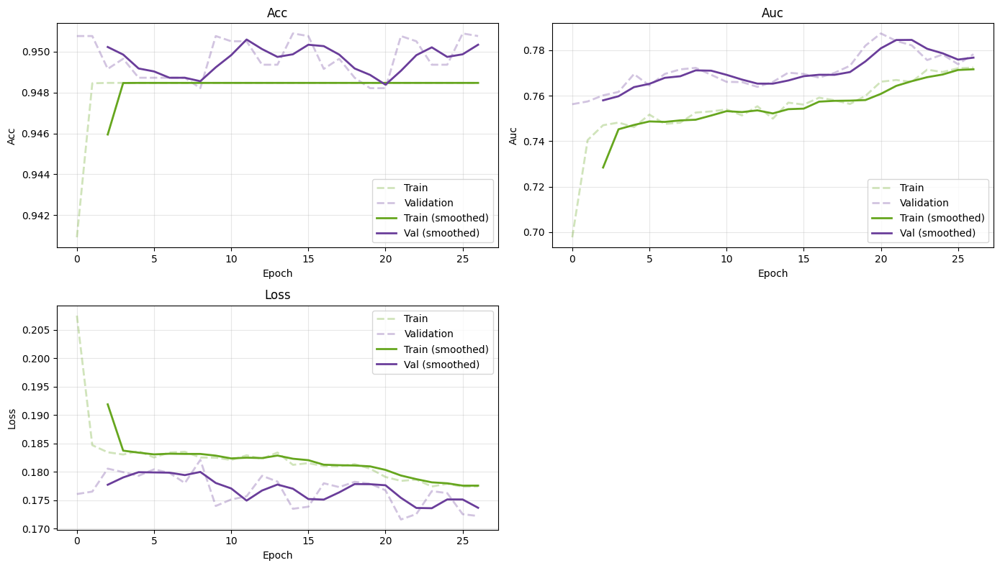

In [ ]:
plot_training_history(CNN_fusion_128_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_128) / 64))

In [ ]:
evaluation = CNN_fusion_128.evaluate(fusion_test_gen, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

Test loss     : 0.1823
Test accuracy : 0.9479
Test AUC      : 0.7607


In [ ]:
y_prob_C_F_128 = CNN_fusion_128.predict(fusion_test_gen, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_128[:, i], y_prob_C_F_128[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}


Per-class AUROC
--------------------------------------------------------------------------------
atelectasis         : 0.6778561490924387
cardiomegaly        : 0.6415308829101931
effusion            : 0.627920515407902
infiltration        : 0.6058187375102857
mass                : 0.502474870545233
nodule              : 0.5331273651844844
pneumonia           : 0.6576495341148182
pneumothorax        : 0.6364895492319315
consolidation       : 0.6758730158730158
edema               : 0.766037936913896
emphysema           : 0.53924237940219
fibrosis            : 0.4548642533936651
pleural_thickening  : 0.512647209421403
hernia              : 0.42761394101876676


<ipython-input-17-dc71f3da9654>:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap     = cm.get_cmap(base_cmap, n_classes)


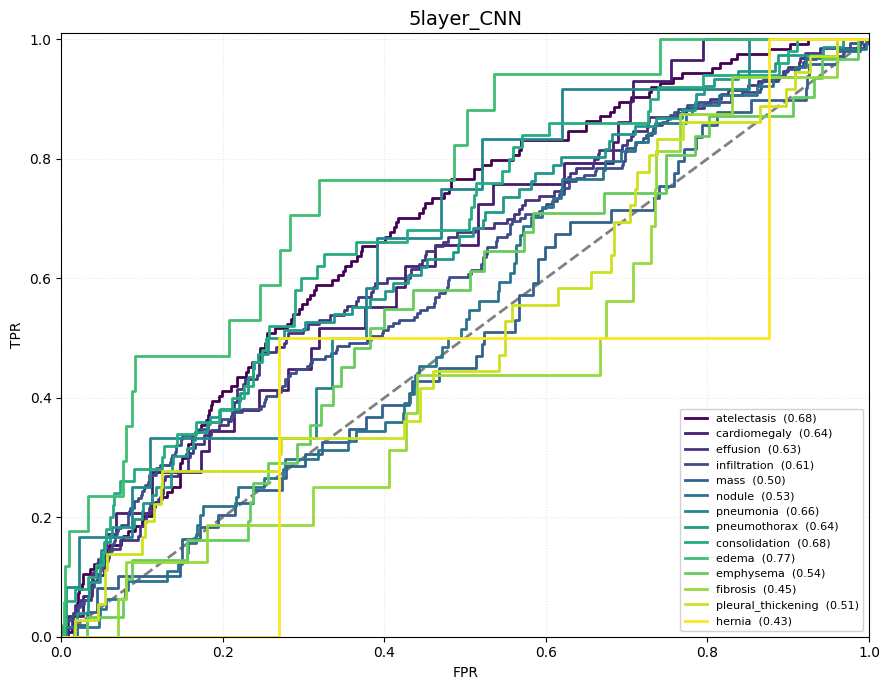

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_128,
    y_probs       = y_prob_C_F_128,
    model_name    = "5layer_CNN")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/CNN_fusion_128.keras"
history_path = '/content/drive/MyDrive/chestMNIST/CNN_fusion_128_history.pkl'

CNN_fusion_128 = keras.models.load_model(model_path)
CNN_fusion_128_history = pickle.load(open(history_path, 'rb'))


<ipython-input-18-002ec1d167bc>:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name, len(model_names))


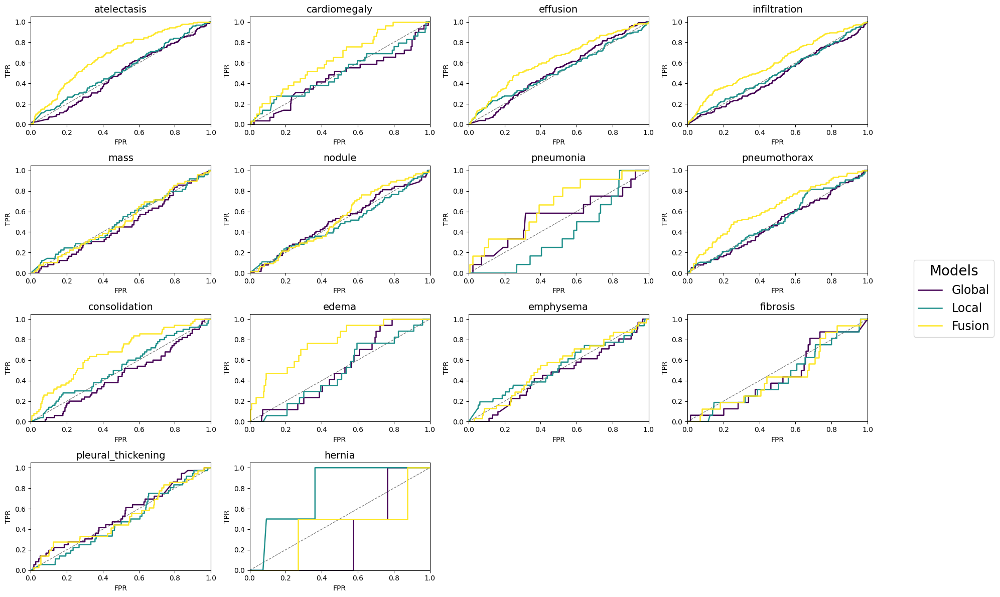

In [ ]:
plot_multimodel_roc(
    y_true           = test_labels_128,
    y_prob_list      = [y_prob_C_G_128, y_prob_C_l_128, y_prob_C_F_128],
    model_names      = ["Global", "Local", "Fusion"],
    class_labels     = CLASS_LABELS,
    n_cols           = 4,
    figsize          = (20, 12),
    cmap_name      = "viridis"
)

### 2) ResNet

#### 1- Global Model

In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/resnet_global_128'

ResNet_global_128 , ResNet_global_128_history = run_experiment(
    loss='binary_crossentropy',
    batch_size=64,
    num_epochs=50,
    model= ResNet(input_shape=(128,128,1), n_classes=14, variant="18"),
    train_generator=train_generator_128,
    val_generator=valid_generator_128,
    model_base=model_base
)


Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


62/62 ━━━━━━━━━━━━━━━━━━━━ 50s 376ms/step - acc: 0.9133 - auc: 0.6753 - loss: 1.6190 - val_acc: 0.8867 - val_auc: 0.5019 - val_loss: 372.1459 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step - acc: 0.9447 - auc: 0.7287 - loss: 0.5377 - val_acc: 0.9492 - val_auc: 0.6850 - val_loss: 0.3575 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 10s 167ms/step - acc: 0.9454 - auc: 0.7340 - loss: 0.3014 - val_acc: 0.9497 - val_auc: 0.7415 - val_loss: 0.2555 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step - acc: 0.9451 - auc: 0.7367 - loss: 0.2707 - val_acc: 0.9487 - val_auc: 0.7438 - val_loss: 0.2438 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler setting learning rate to 0.01.
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 7s 115ms/step - acc: 0

##### Evaluation

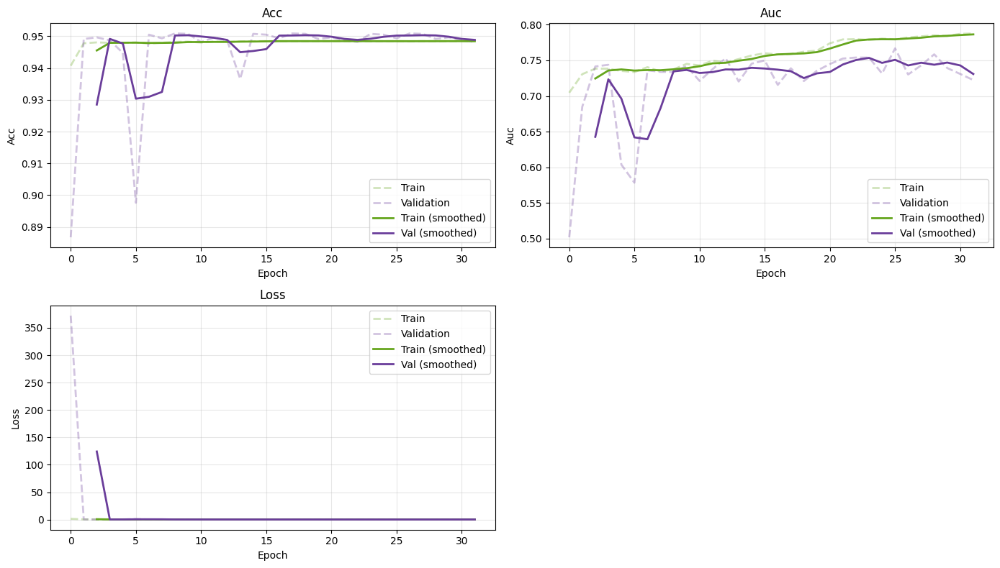

In [ ]:
plot_training_history(ResNet_global_128_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_128) / 64))

In [ ]:
evaluation = ResNet_global_128.evaluate(test_generator_128, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


Test loss     : 0.1859
Test accuracy : 0.9479
Test AUC      : 0.7604


In [ ]:
y_prob_R_G_128 = ResNet_global_128.predict(test_generator_128, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_128[:, i], y_prob_R_G_128[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}


Per-class AUROC
--------------------------------------------------------------------------------
atelectasis         : 0.43148801242436985
cardiomegaly        : 0.4876057850195781
effusion            : 0.5125514243576808
infiltration        : 0.5492653109204184
mass                : 0.4986864148644532
nodule              : 0.5174654091769159
pneumonia           : 0.3881875563570784
pneumothorax        : 0.530156131956686
consolidation       : 0.49211951447245567
edema               : 0.4841751918158567
emphysema           : 0.48878366380585964
fibrosis            : 0.43778280542986425
pleural_thickening  : 0.5098822324628777
hernia              : 0.4419124218051832


<ipython-input-16-dc71f3da9654>:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap     = cm.get_cmap(base_cmap, n_classes)


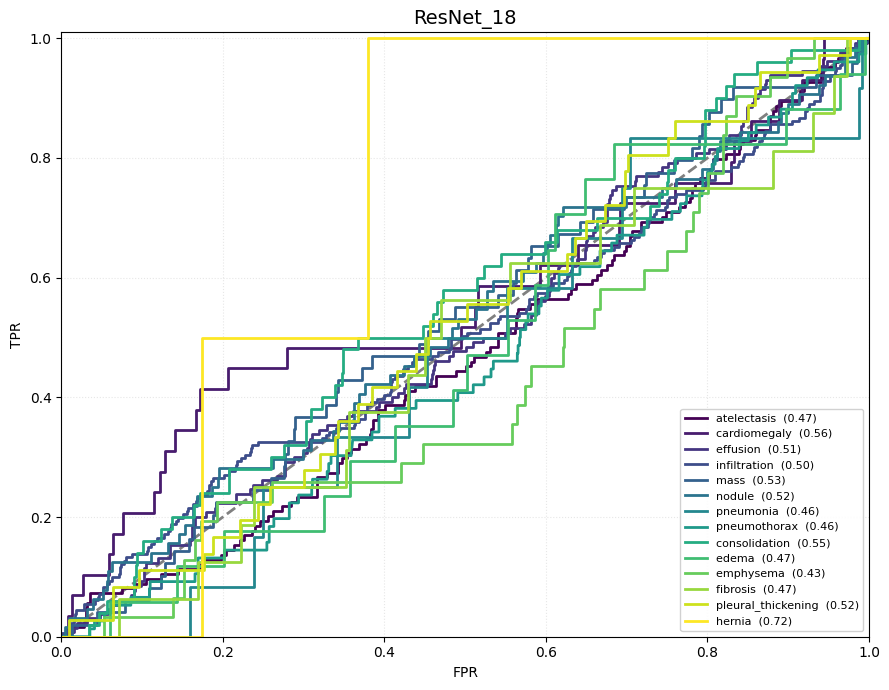

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_128,
    y_probs       = y_prob_R_G_128,
    model_name    = "ResNet_18")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/resnet_global_128.keras"
history_path = '/content/drive/MyDrive/chestMNIST/resnet_global_128_history.pkl'

ResNet_global_128 = keras.models.load_model(model_path)
ResNet_global_128_history = pickle.load(open(history_path, 'rb'))

In [ ]:
ResNet_global_128.summary()

Model: "ResNet18_128"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 64, 64,    │      3,136 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 64, 64,    │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 64, 64,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 32, 32,    │          0 │ re_lu[0][0]       │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 16, 16,    │     36,864 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 16, 16,    │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 16, 16,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 16, 16,    │     36,864 │ re_lu_1[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 16, 16,    │      4,096 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 16, 16,    │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 16, 16,    │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 16, 16,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 16, 16,    │          0 │ add[0][0]         │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 16, 16,    │     36,864 │ re_lu_2[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 16, 16,    │        256 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_3 (ReLU)      │ (None, 16, 16,    │          0 │ batch_normalizat

 Total params: 33,554,668 (128.00 MB)

 Trainable params: 11,181,646 (42.65 MB)

 Non-trainable params: 9,728 (38.00 KB)

 Optimizer params: 22,363,294 (85.31 MB)

#### 2- Local Branch

##### Bounding Box

In [ ]:
batch_size = 1
train_generator2_128 = data_generator_2(train_images_128, train_labels_128, batch_size=1)
valid_generator2_128 = data_generator_2(val_images_128, val_labels_128, batch_size=1)
test_generator2_128 = data_generator_2(test_images_128, test_labels_128, batch_size=1)

In [ ]:
start_idx   = 1500
total_imgs  = len(train_images_128)
num_samples = total_imgs - start_idx

out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "train_bbox_resnet_128.npz")

cropped_images_list, labels_list, bboxes_list = [], [], []

# ── 0·A.  Fast-forward generator so we start at image 1500 ──────────────────
skipped = 0
while skipped < start_idx:
    batch_imgs, _ = next(train_generator2_128)
    skipped += batch_imgs.shape[0]

# ── 0·B.  Progress bar for the *remaining* images ────────────────────────────
pbar = tqdm(total=num_samples,
            desc=f"Processing images {start_idx}-{total_imgs-1}",
            unit="img",
            leave=False,
            ncols=80,
            mininterval=0.2)

processed = 0

# ── 1.  Main loop (unchanged apart from the loop-guard) ──────────────────────
while processed < num_samples:
    img, lbl = next(train_generator2_128)
    B = img.shape[0]

    # … your heat-map → mask → bbox → crop logic stays exactly as before …
    heatmaps = generate_heatmaps_batch(img, ResNet_global_128, "re_lu_16", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.7)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox, target_sz=(128,128))[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))

    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save just the processed images ───────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)

print(f"\nDone!  Saved {num_samples} cropped images (indexes {start_idx}-{total_imgs-1}) to:\n{out_path}")


Processing images 1500-3922:   0%|                    | 0/2423 [00:00<?, ?img/s]


Done!  Saved 2423 cropped images (indexes 1500-3922) to:
/content/drive/MyDrive/chestMNIST/BBox/train_bbox_resnet_128.npz


In [ ]:
out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "val_bbox_resnet_128.npz")

num_samples = len(val_images_128)
cropped_images_list, labels_list, bboxes_list = [], [], []

processed = 0

pbar = tqdm(total=num_samples,
            desc='Processing images',
            unit='img',
            leave=False,
            ncols=80,
            mininterval=0.2)


# ── 1.  Loop until we have seen every image exactly once ──────────────────────
while processed < num_samples:
    img, lbl = next(valid_generator2_128)
    B = img.shape[0]

    heatmaps = generate_heatmaps_batch(img, ResNet_global_128, "re_lu_16", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.7)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox, target_sz=(128, 128))[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))


    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save everything ───────────────────────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)


print(f"\nDone!  Saved one epoch of masked data to:\n{out_path}")



Processing images:   0%|                               | 0/560 [00:00<?, ?img/s]


Done!  Saved one epoch of masked data to:
/content/drive/MyDrive/chestMNIST/BBox/val_bbox_resnet_128.npz


In [ ]:
out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "test_bbox_resnet_128.npz")

num_samples = len(test_images_128)
cropped_images_list, labels_list, bboxes_list = [], [], []

processed = 0

pbar = tqdm(total=num_samples,
            desc='Processing images',
            unit='img',
            leave=False,
            ncols=80,
            mininterval=0.2)


# ── 1.  Loop until we have seen every image exactly once ──────────────────────
while processed < num_samples:
    img, lbl = next(test_generator2_128)
    B = img.shape[0]

    heatmaps = generate_heatmaps_batch(img, ResNet_global_128, "re_lu_16", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.7)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox, target_sz=(128, 128))[..., None]  # back to (H,W,1)
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))


    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save everything ───────────────────────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)


print(f"\nDone!  Saved one epoch of masked data to:\n{out_path}")

Processing images:   0%|                              | 0/1121 [00:00<?, ?img/s]


Done!  Saved one epoch of masked data to:
/content/drive/MyDrive/chestMNIST/BBox/test_bbox_resnet_128.npz


##### Loading Bbox Images

In [ ]:
data_4 = np.load('/content/drive/MyDrive/chestMNIST/BBox/train_bbox_resnet_128.npz')
train_img_bbox_128_R = data_4['images']
train_img_bbox_128_R = np.squeeze(train_img_bbox_128_R)
train_lbl_bbox_128_R = data_4['labels']
train_lbl_bbox_128_R = np.squeeze(train_lbl_bbox_128_R)

In [ ]:
data_5 = np.load('/content/drive/MyDrive/chestMNIST/BBox/val_bbox_resnet_128.npz')
val_img_bbox_128_R = data_5['images']
val_img_bbox_128_R = np.squeeze(val_img_bbox_128_R)
val_lbl_bbox_128_R = data_5['labels']
val_lbl_bbox_128_R = np.squeeze(val_lbl_bbox_128_R)

In [ ]:
data_6 = np.load('/content/drive/MyDrive/chestMNIST/BBox/test_bbox_resnet_128.npz')
test_img_bbox_128_R = data_6['images']
test_img_bbox_128_R = np.squeeze(test_img_bbox_128_R)
test_lbl_bbox_128_R = data_6['labels']
test_lbl_bbox_128_R = np.squeeze(test_lbl_bbox_128_R)

##### Run the Model

In [ ]:
SEED = 42

In [ ]:
train_generator_128 = data_generator_1(train_img_bbox_128_R, train_lbl_bbox_128_R, batch_size=64, augmentation=True, seed=SEED)
valid_generator_128 = data_generator_1(val_img_bbox_128_R, val_lbl_bbox_128_R, batch_size=64, augmentation=False, seed=SEED)
test_generator_128 = data_generator_1(test_img_bbox_128_R, test_lbl_bbox_128_R,batch_size=64, augmentation=False, seed=SEED)

In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/resnet_local_128'

ResNet_local_128 , ResNet_local_128_history = run_experiment(
    loss='binary_crossentropy',
    batch_size=64,
    num_epochs=50,
    model= ResNet(input_shape=(128,128,1), n_classes=14, variant="18"),
    train_generator=train_generator_128,
    val_generator=valid_generator_128,
    model_base=model_base
)

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(



Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 48s 393ms/step - acc: 0.9131 - auc: 0.6488 - loss: 1.7118 - val_acc: 0.9077 - val_auc: 0.6004 - val_loss: 40.2455 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - acc: 0.9487 - auc: 0.7192 - loss: 0.6963 - val_acc: 0.9508 - val_auc: 0.7025 - val_loss: 0.4156 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - acc: 0.9493 - auc: 0.7205 - loss: 0.3543 - val_acc: 0.9508 - val_auc: 0.7261 - val_loss: 0.3173 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - acc: 0.9489 - auc: 0.7204 - loss: 0.3105 - val_acc: 0.9508 - val_auc: 0.4959 - val_loss: 1.9515 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler setting learning rate

##### Evaluation

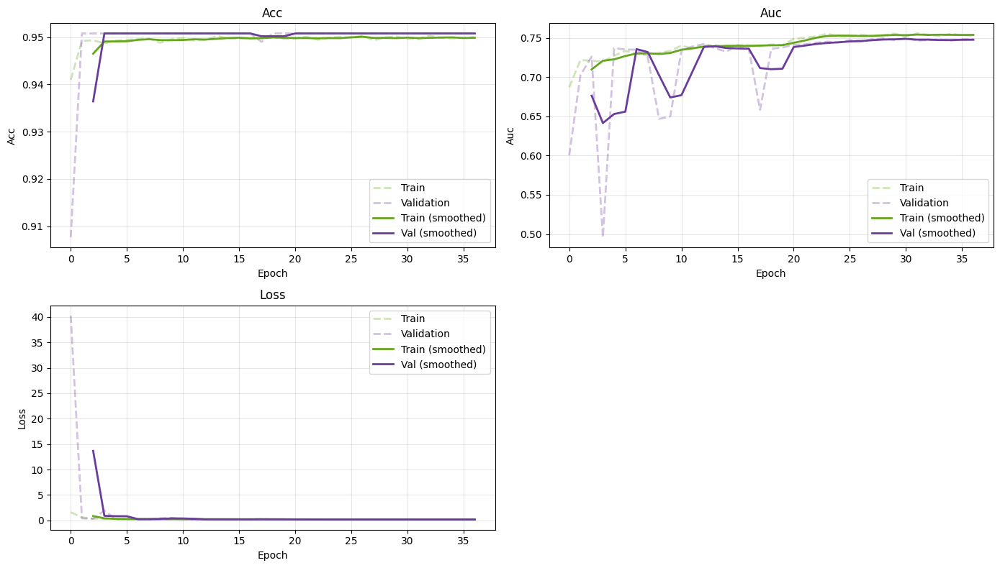

In [ ]:
plot_training_history(ResNet_local_128_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_128) / 64))

In [ ]:
evaluation = ResNet_local_128.evaluate(test_generator_128, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


Test loss     : 0.1868
Test accuracy : 0.9479
Test AUC      : 0.7395


In [ ]:
y_prob_R_l_128 = ResNet_local_128.predict(test_generator_128, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_128[:, i], y_prob_R_l_128[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}


Per-class AUROC
--------------------------------------------------------------------------------
atelectasis         : 0.5136862199501732
cardiomegaly        : 0.5023525325249463
effusion            : 0.4479119770239851
infiltration        : 0.5406136123192664
mass                : 0.4981628845568078
nodule              : 0.495779623935667
pneumonia           : 0.43041779380823564
pneumothorax        : 0.4777511961722488
consolidation       : 0.4420261437908497
edema               : 0.590419863597613
emphysema           : 0.5156703166617342
fibrosis            : 0.5888574660633484
pleural_thickening  : 0.5495391705069124
hernia              : 0.4622430741733691


<ipython-input-19-dc71f3da9654>:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap     = cm.get_cmap(base_cmap, n_classes)


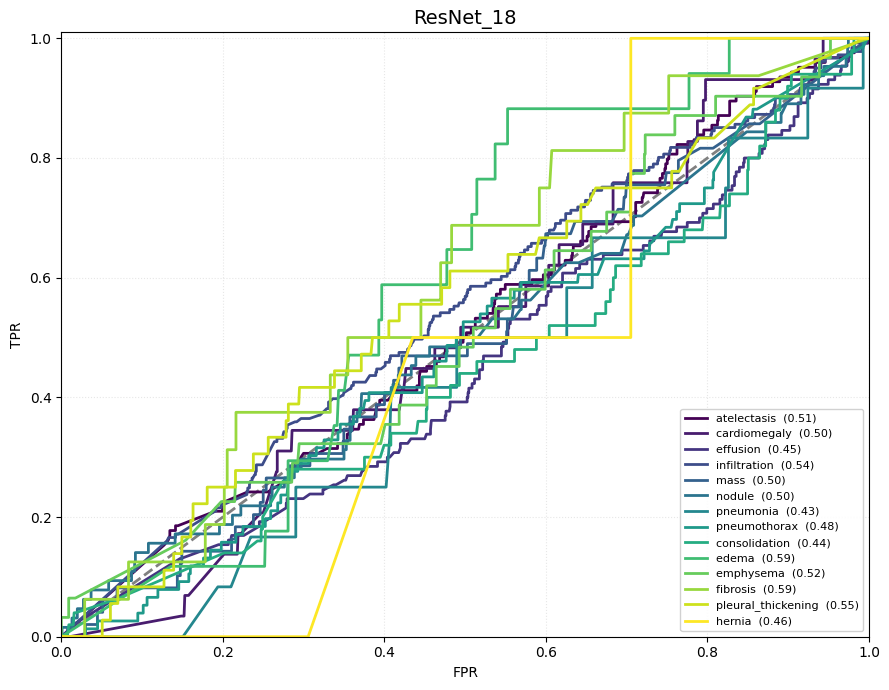

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_128,
    y_probs       = y_prob_R_l_128,
    model_name    = "ResNet_18")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/resnet_local_128.keras"
history_path = '/content/drive/MyDrive/chestMNIST/resnet_local_128_history.pkl'

CNN_local_128 = keras.models.load_model(model_path)
CNN_local_128_history = pickle.load(open(history_path, 'rb'))


#### 3- Fusion Branch

In [ ]:
train_images_128 = train_images_128[1500:]
train_labels_128 = train_labels_128 [1500:]

In [ ]:
fusion_train_gen = data_generator_3(train_images_128, train_img_bbox_128_R, train_labels_128, batch_size=64, datagen=get_datagen(True))

fusion_val_gen   = data_generator_3(val_images_128, val_img_bbox_128_R, val_labels_128, batch_size=64, datagen=get_datagen(False))

fusion_test_gen = data_generator_3(test_images_128, test_img_bbox_128_R, test_labels_128, batch_size=64, datagen= get_datagen(False))

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/resnet_fusion_128'

ResNet_fusion_128, ResNet_fusion_128_history = run_experiment(
        loss='binary_crossentropy',
        batch_size=64,
        num_epochs=50,
        model= fusion_model(ResNet_global_128, ResNet_local_128, num_classes=14, hidden_units=256, dropout_rate=0.3, fine_tune_backbones=False),
        train_generator=fusion_train_gen,
        val_generator  =fusion_val_gen,
        model_base     = model_base)


Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 28s 327ms/step - acc: 0.9098 - auc: 0.6761 - loss: 0.2579 - val_acc: 0.9508 - val_auc: 0.7741 - val_loss: 0.1721 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - acc: 0.9492 - auc: 0.7609 - loss: 0.1784 - val_acc: 0.9508 - val_auc: 0.7739 - val_loss: 0.1746 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 10s 167ms/step - acc: 0.9499 - auc: 0.7583 - loss: 0.1769 - val_acc: 0.9508 - val_auc: 0.7747 - val_loss: 0.1730 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - acc: 0.9493 - auc: 0.7585 - loss: 0.1790 - val_acc: 0.9508 - val_auc: 0.7776 - val_loss: 0.1728 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler setting learning

##### Evaluation

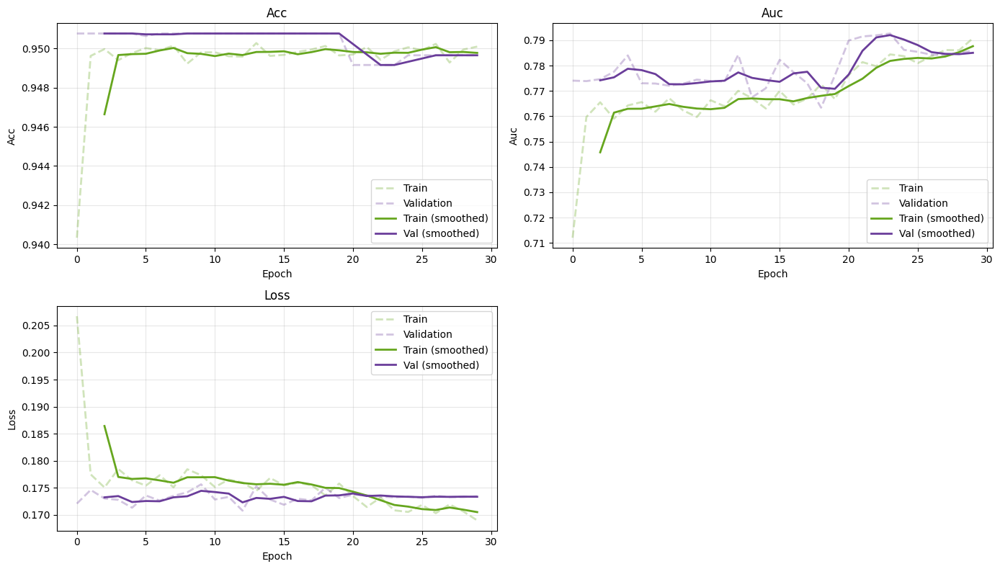

In [ ]:
plot_training_history(ResNet_fusion_128_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_128) / 64))

In [ ]:
evaluation = ResNet_fusion_128.evaluate(fusion_test_gen, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

Test loss     : 0.1803
Test accuracy : 0.9479
Test AUC      : 0.7671


In [ ]:
y_prob_R_F_128 = ResNet_fusion_128.predict(fusion_test_gen, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_128[:, i], y_prob_R_F_128[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}


Per-class AUROC
--------------------------------------------------------------------------------
atelectasis         : 0.4405636263629598
cardiomegaly        : 0.6614879373500063
effusion            : 0.5126290460296514
infiltration        : 0.5420829904784296
mass                : 0.5561034115138592
nodule              : 0.5544288079470199
pneumonia           : 0.408551247370003
pneumothorax        : 0.49887937547217326
consolidation       : 0.5067226890756302
edema               : 0.5486466325660699
emphysema           : 0.4664989641905889
fibrosis            : 0.6369909502262443
pleural_thickening  : 0.49144905273937534
hernia              : 0.6076854334226989


<ipython-input-19-dc71f3da9654>:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap     = cm.get_cmap(base_cmap, n_classes)


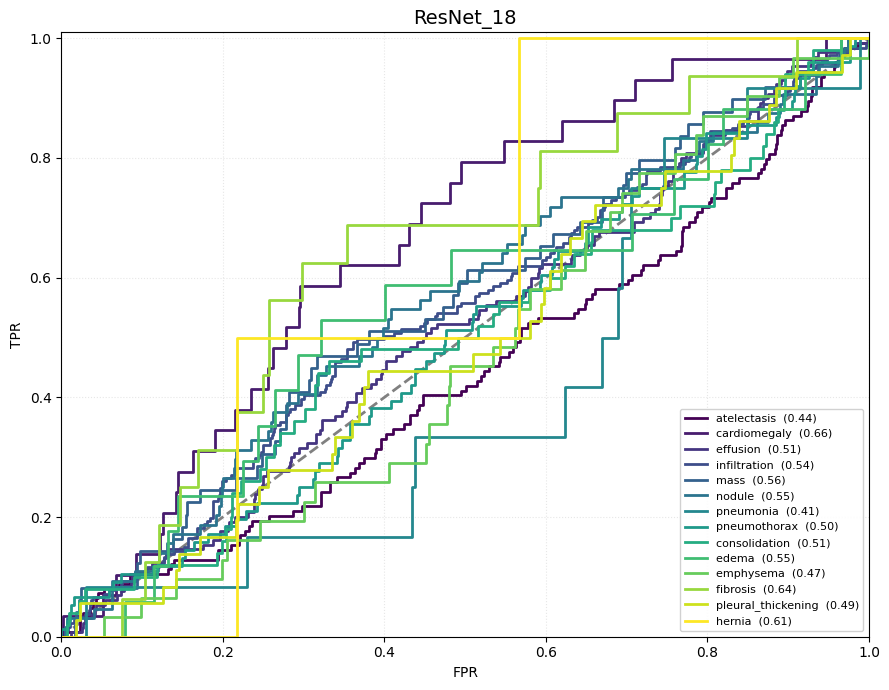

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_128,
    y_probs       = y_prob_R_F_128,
    model_name    = "ResNet_18")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/resnet_fusion_128.keras"
history_path = '/content/drive/MyDrive/chestMNIST/resnet_fusion_128_history.pkl'

ResNet_fusion_128 = keras.models.load_model(model_path)
ResNet_fusion_128_history = pickle.load(open(history_path, 'rb'))

<ipython-input-18-002ec1d167bc>:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name, len(model_names))


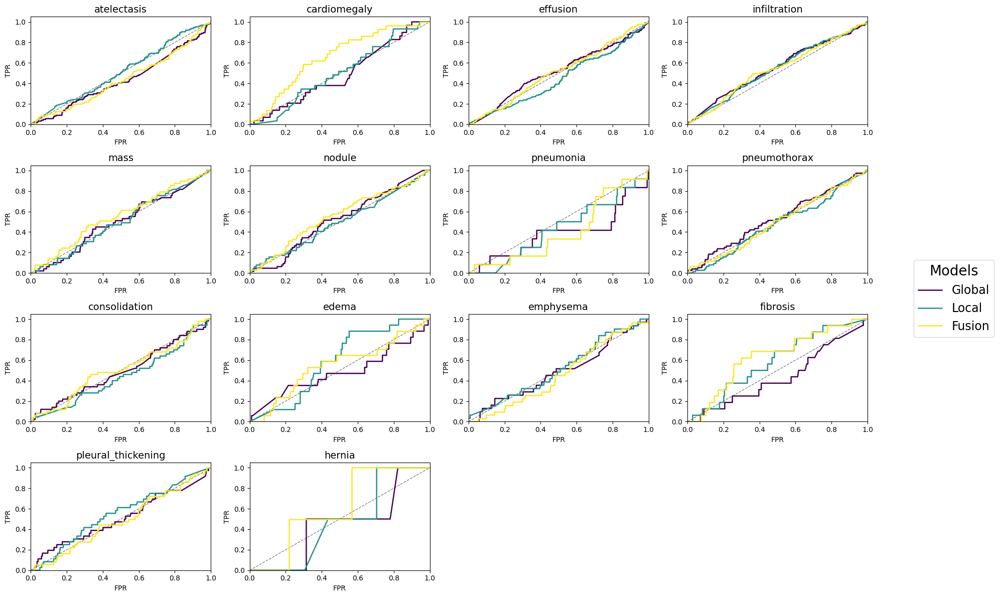

In [ ]:
plot_multimodel_roc(
    y_true           = test_labels_128,
    y_prob_list      = [y_prob_R_G_128, y_prob_R_l_128, y_prob_R_F_128],
    model_names      = ["Global", "Local", "Fusion"],
    class_labels     = CLASS_LABELS,
    n_cols           = 4,
    figsize          = (20, 12),
    cmap_name      = "viridis"
)

### 3) DenseNet_121

#### 1- Global Branch

In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/DenseNet_global_128'

DenseNet_global_128 , DenseNet_global_128_history = run_experiment(
    loss='binary_crossentropy',
    batch_size=64,
    num_epochs=50,
    model= DenseNet121(input_shape=(128, 128, 1), num_classes= 14, growth_rate=32, reduction=0.5),
    train_generator=train_generator_128,
    val_generator=valid_generator_128,
    model_base=model_base
)


Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


62/62 ━━━━━━━━━━━━━━━━━━━━ 239s 2s/step - acc: 0.9128 - auc: 0.6761 - loss: 0.2779 - val_acc: 0.8245 - val_auc: 0.5134 - val_loss: 44865638400.0000 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - acc: 0.9459 - auc: 0.7361 - loss: 0.2033 - val_acc: 0.9492 - val_auc: 0.5000 - val_loss: 4930349.5000 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 94ms/step - acc: 0.9459 - auc: 0.7492 - loss: 0.1960 - val_acc: 0.8852 - val_auc: 0.4925 - val_loss: 3075.6882 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - acc: 0.9459 - auc: 0.7562 - loss: 0.1913 - val_acc: 0.9487 - val_auc: 0.5111 - val_loss: 602.1512 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler setting learning rate to 0.01.
Epoch 5/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/

##### Evaluation

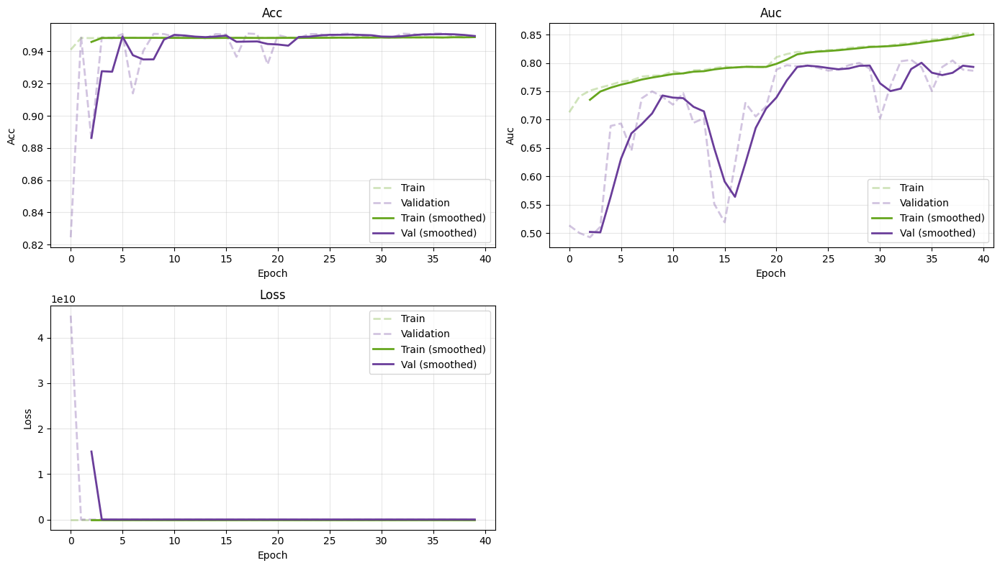

In [ ]:
plot_training_history(DenseNet_global_128_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_128) / 64))

In [ ]:
evaluation = DenseNet_global_128.evaluate(test_generator_128, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


Test loss     : 0.1821
Test accuracy : 0.9479
Test AUC      : 0.7777


In [ ]:
y_prob_D_G_128 = DenseNet_global_128.predict(test_generator_128, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_128[:, i], y_prob_D_G_128[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}


Per-class AUROC
--------------------------------------------------------------------------------
atelectasis         : 0.46800886530559416
cardiomegaly        : 0.5131047113805733
effusion            : 0.5101296281921913
infiltration        : 0.4844069589749618
mass                : 0.476850441669205
nodule              : 0.47467774361400195
pneumonia           : 0.4570934776074542
pneumothorax        : 0.4974187861999496
consolidation       : 0.49583566760037345
edema               : 0.46371483375959077
emphysema           : 0.4434152116010654
fibrosis            : 0.4463235294117647
pleural_thickening  : 0.5215821812596007
hernia              : 0.2975871313672922


<ipython-input-14-dc71f3da9654>:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap     = cm.get_cmap(base_cmap, n_classes)


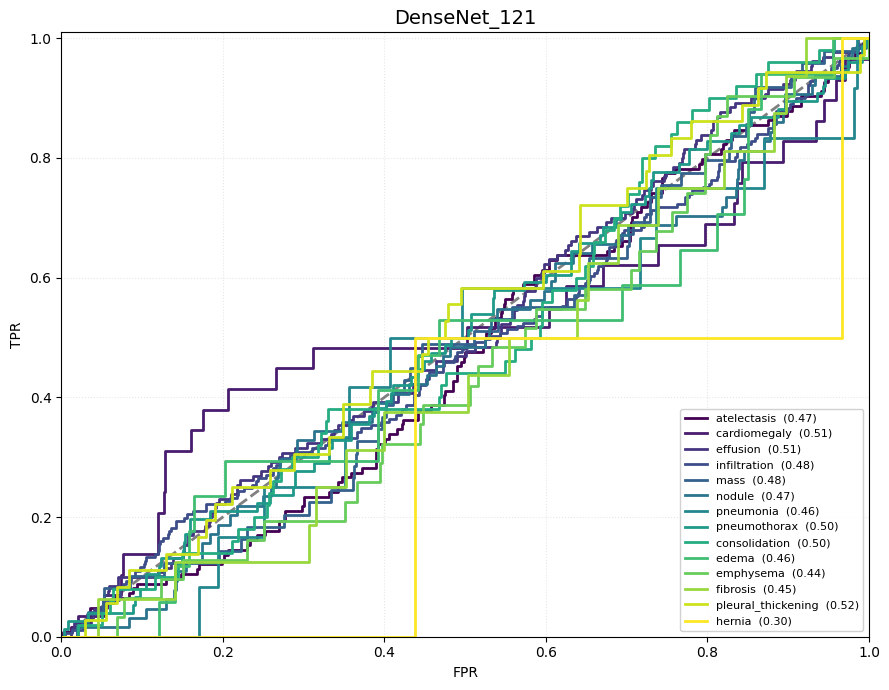

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_128,
    y_probs       = y_prob_D_G_128,
    model_name    = "DenseNet_121")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/DenseNet_global_128.keras"
history_path = '/content/drive/MyDrive/chestMNIST/DenseNet_global_128_history.pkl'

DenseNet_global_128 = keras.models.load_model(model_path)
DenseNet_global_128_history = pickle.load(open(history_path, 'rb'))

In [ ]:
DenseNet_global_128.summary()

Model: "DenseNet121"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)  │ (None, 128, 128,  │          0 │ -                 │
│                     │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 64, 64,    │      3,136 │ input[0][0]       │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 64, 64,    │        256 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_relu (ReLU)    │ (None, 64, 64,    │          0 │ stem_bn[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_pool           │ (None, 32, 32,    │          0 │ stem_relu[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb1_bn1      │ (None, 32, 32,    │        256 │ stem_pool[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb1_relu1    │ (None, 32, 32,    │          0 │ dense1_cb1_bn1[0… │
│ (ReLU)              │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb1_conv1    │ (None, 32, 32,    │      8,192 │ dense1_cb1_relu1… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb1_bn2      │ (None, 32, 32,    │        512 │ dense1_cb1_conv1… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb1_relu2    │ (None, 32, 32,    │          0 │ dense1_cb1_bn2[0… │
│ (ReLU)              │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb1_conv2    │ (None, 32, 32,    │     36,864 │ dense1_cb1_relu2… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_concat1      │ (None, 32, 32,    │          0 │ stem_pool[0][0],  │
│ (Concatenate)       │ 96)               │            │ dense1_cb1_conv2… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb2_bn1      │ (None, 32, 32,    │        384 │ dense1_concat1[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb2_relu1    │ (None, 32, 32,    │          0 │ dense1_cb2_bn1[0… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb2_conv1    │ (None, 32, 32,    │     12,288 │ dense1_cb2_relu1… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb2_bn2      │ (None, 32, 32,    │        512 │ dense1_cb2_conv1… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb2_relu2    │ (None, 32, 32,    │          0 │ dense1_cb2_bn2[0

 Total params: 20,969,452 (79.99 MB)

 Trainable params: 6,961,934 (26.56 MB)

 Non-trainable params: 83,648 (326.75 KB)

 Optimizer params: 13,923,870 (53.12 MB)

#### 2- Local Branch

##### Bounding Box

In [ ]:
batch_size = 1
train_generator2_128 = data_generator_2(train_images_128, train_labels_128, batch_size=1)
valid_generator2_128 = data_generator_2(val_images_128, val_labels_128, batch_size=1)
test_generator2_128 = data_generator_2(test_images_128, test_labels_128, batch_size=1)

In [ ]:
out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "train_bbox_densenet_128.npz")

num_samples = len(train_images_128)
cropped_images_list, labels_list, bboxes_list = [], [], []

processed = 0

pbar = tqdm(total=num_samples,
            desc='Processing images',
            unit='img',
            leave=False,
            ncols=80,
            mininterval=0.2)


# ── 1.  Loop until we have seen every image exactly once ──────────────────────
while processed < num_samples:
    img, lbl = next(train_generator2_128)
    B = img.shape[0]

    heatmaps = generate_heatmaps_batch(img, DenseNet_global_128, "conv2d_4", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.5)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox)[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))


    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save everything ───────────────────────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)


print(f"\nDone!  Saved one epoch of masked data to:\n{out_path}")



In [ ]:
out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "val_bbox_densenet_128.npz")

num_samples = len(val_images_128)
cropped_images_list, labels_list, bboxes_list = [], [], []

processed = 0

pbar = tqdm(total=num_samples,
            desc='Processing images',
            unit='img',
            leave=False,
            ncols=80,
            mininterval=0.2)


# ── 1.  Loop until we have seen every image exactly once ──────────────────────
while processed < num_samples:
    img, lbl = next(valid_generator2_128)
    B = img.shape[0]

    heatmaps = generate_heatmaps_batch(img, DenseNet_global_128, "conv2d_4", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.5)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox)[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))


    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save everything ───────────────────────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)


print(f"\nDone!  Saved one epoch of masked data to:\n{out_path}")



In [ ]:
out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "test_bbox_densenet_128.npz")

num_samples = len(test_images_128)
cropped_images_list, labels_list, bboxes_list = [], [], []

processed = 0

pbar = tqdm(total=num_samples,
            desc='Processing images',
            unit='img',
            leave=False,
            ncols=80,
            mininterval=0.2)


# ── 1.  Loop until we have seen every image exactly once ──────────────────────
while processed < num_samples:
    img, lbl = next(test_generator2_128)
    B = img.shape[0]

    heatmaps = generate_heatmaps_batch(img, DenseNet_global_128, "conv2d_4", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.5)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox)[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))


    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save everything ───────────────────────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)


print(f"\nDone!  Saved one epoch of masked data to:\n{out_path}")



##### Loading Bbox Images

In [ ]:
data_4 = np.load('/content/drive/MyDrive/chestMNIST/BBox/train_bbox_densenet_128.npz')
train_img_bbox_128_D = data_4['images']
train_img_bbox_128_D = np.squeeze(train_img_bbox_128_D)
train_lbl_bbox_128_D = data_4['labels']
train_lbl_bbox_128_D = np.squeeze(train_lbl_bbox_128_D)

In [ ]:
data_5 = np.load('/content/drive/MyDrive/chestMNIST/BBox/val_bbox_densenet_128.npz')
val_img_bbox_128_D = data_5['images']
val_img_bbox_128_D = np.squeeze(val_img_bbox_128_D)
val_lbl_bbox_128_D = data_5['labels']
val_lbl_bbox_128_D = np.squeeze(val_lbl_bbox_128_D)

In [ ]:
data_6 = np.load('/content/drive/MyDrive/chestMNIST/BBox/test_bbox_densenet_128.npz')
test_img_bbox_128_D = data_6['images']
test_img_bbox_128_D = np.squeeze(test_img_bbox_128_D)
test_lbl_bbox_128_D = data_6['labels']
test_lbl_bbox_128_D = np.squeeze(test_lbl_bbox_128_D)

##### Run the Model

In [ ]:
SEED = 42

In [ ]:
train_generator_128 = data_generator_1(train_img_bbox_128_D, train_lbl_bbox_128_D, batch_size=64, augmentation=True, seed=SEED)
valid_generator_128 = data_generator_1(val_img_bbox_128_D, val_lbl_bbox_128_D, batch_size=64, augmentation=False, seed=SEED)
test_generator_128 = data_generator_1(test_img_bbox_128_D, test_lbl_bbox_128_D,batch_size=64, augmentation=False, seed=SEED)

In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/densenet_local_128'

DenseNet_local_128 , DenseNet_local_128_history = run_experiment(
    loss='binary_crossentropy',
    batch_size=64,
    num_epochs=50,
    model= DenseNet121(input_shape=(128, 128, 1), num_classes= 14, growth_rate=16, reduction=0.5),
    train_generator=train_generator_128,
    val_generator=valid_generator_128,
    model_base=model_base
)

##### Evaluation

In [ ]:
plot_training_history(DenseNet_local_128_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_128) / 64))

In [ ]:
evaluation = ResNet_local_128.evaluate(test_generator_128, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

In [ ]:
y_prob_D_l_128 = DenseNet_local_128_history.predict(test_generator_128, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_128[:, i], y_prob_D_l_128[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_128,
    y_probs       = y_prob_D_l_128,
    model_name    = "ResNet_18")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/densenet_local_128.keras"
history_path = '/content/drive/MyDrive/chestMNIST/densenet_local_128_history.pkl'

DenseNet_local_128 = keras.models.load_model(model_path)
DenseNet_local_128_history = pickle.load(open(history_path, 'rb'))

#### 3- Fusion Branch

In [ ]:
fusion_train_gen = data_generator_3(train_images_128, train_img_bbox_128_D, train_labels_128, batch_size=64, datagen=get_datagen(True))
fusion_val_gen   = data_generator_3(val_images_128, val_img_bbox_128_D, val_labels_128, batch_size=64, datagen=get_datagen(False))
fusion_test_gen = data_generator_3(test_images_128,test_img_bbox_128_D, test_labels_128, batch_size=64, datagen= get_datagen(False))

In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/densenet_fusion_128'

DenseNet_fusion_128 , DenseNet_fusion_128_history = run_experiment(
        loss='binary_crossentropy',
        batch_size=64,
        num_epochs=50,
        model= fusion_model(DenseNet_global_128, DenseNet_local_128, num_classes=14, hidden_units=256, dropout_rate=0.3, fine_tune_backbones=False),
        train_generator=fusion_train_gen,
        val_generator  =fusion_val_gen,
        model_base     = model_base)

##### Evaluation

In [ ]:
plot_training_history(DenseNet_fusion_128_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_128) / 64))

In [ ]:
evaluation = ResNet_local_128.evaluate(test_generator_128, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

In [ ]:
y_prob_D_F_128 = DenseNet_fusion_128.predict(fusion_test_gen, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_128[:, i], y_prob_D_F_128[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_128,
    y_probs       = y_prob_D_F_128,
    model_name    = "ResNet_18")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/densenet_fusion_128.keras"
history_path = '/content/drive/MyDrive/chestMNIST/densenet_fusion_128_history.pkl'

DenseNet_fusion_128 = keras.models.load_model(model_path)
DenseNet_fusion_128_history = pickle.load(open(history_path, 'rb'))

In [ ]:
plot_multimodel_roc(
    y_true           = test_labels_128,
    y_prob_list      = [y_prob_D_G_128, y_prob_D_l_128, y_prob_D_F_128],
    model_names      = ["Global", "Local", "Fusion"],
    class_labels     = CLASS_LABELS,
    n_cols           = 4,
    figsize          = (20, 12),
    cmap_name      = "viridis"
)

##ChestMnist_224

In [ ]:
SEED = 42

In [ ]:
train_images_224, train_labels_224, val_images_224, val_labels_224, test_images_224, test_labels_224 = load_dataset(224)

In [ ]:
train_images_224, train_labels_224 = subsample(train_images_224, train_labels_224, seed=SEED)
val_images_224, val_labels_224   = subsample(val_images_224, val_labels_224, seed=SEED)
test_images_224, test_labels_224  = subsample(test_images_224, test_labels_224, seed=SEED)

In [ ]:
train_generator_224 = data_generator_1(train_images_224, train_labels_224, batch_size=64, augmentation=True, seed=SEED)
valid_generator_224 = data_generator_1(val_images_224, val_labels_224, batch_size=64, augmentation=False, seed=SEED)
test_generator_224 = data_generator_1(test_images_224, test_labels_224,batch_size=64, augmentation=False, seed=SEED)

### 1) 5layer_CNN

#### 1- Global Branch

In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/CNN_global_224'

CNN_global_224 , CNN_global_224_history = run_experiment(
    loss='binary_crossentropy',
    batch_size=128,
    num_epochs=50,
    model=CNN5layers((224, 224, 1), num_classes=14),
    train_generator=train_generator_224,
    val_generator=valid_generator_224,
    model_base=model_base
)

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(



Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 25s 253ms/step - acc: 0.8977 - auc: 0.6339 - loss: 0.3809 - val_acc: 0.8839 - val_auc: 0.5006 - val_loss: 10.3344 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 17s 572ms/step - acc: 0.9517 - auc: 0.7369 - loss: 0.2076 - val_acc: 0.9518 - val_auc: 0.6383 - val_loss: 0.2936 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 6s 184ms/step - acc: 0.9444 - auc: 0.7456 - loss: 0.2096 - val_acc: 0.9478 - val_auc: 0.6857 - val_loss: 0.2214 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 6s 199ms/step - acc: 0.9517 - auc: 0.7367 - loss: 0.1866 - val_acc: 0.9511 - val_auc: 0.7033 - val_loss: 0.2124 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler setting learning 

##### Evaluation

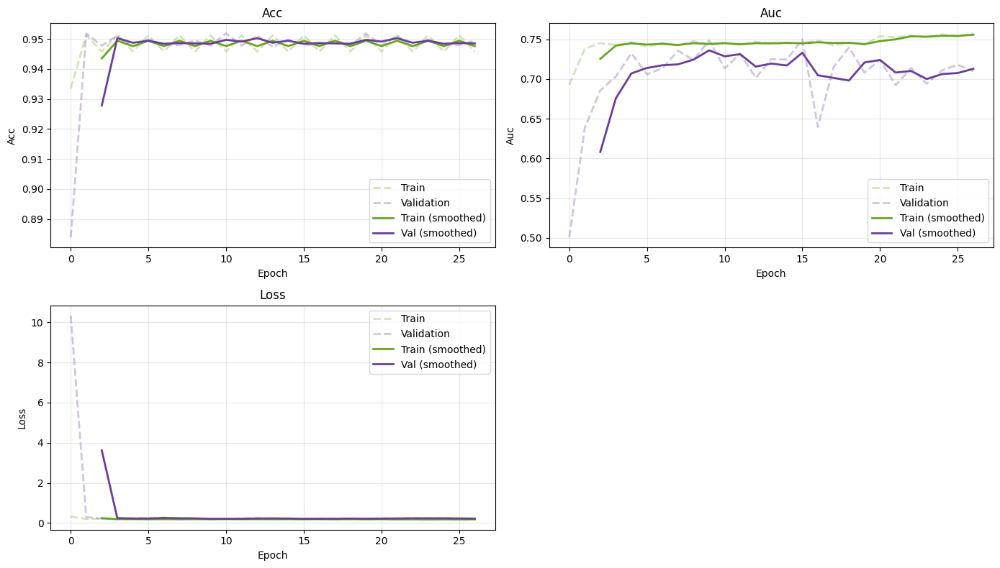

In [ ]:
plot_training_history(CNN_global_224_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_224) / 64))

In [ ]:
evaluation = CNN_global_224.evaluate(test_generator_224, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


Test loss     : 0.2359
Test accuracy : 0.9479
Test AUC      : 0.7056


In [ ]:
y_prob_C_G_224 = CNN_global_224.predict(test_generator_224, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_224[:, i], y_prob_C_G_224[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}


Per-class AUROC
--------------------------------------------------------------------------------
atelectasis         : 0.4624033390494063
cardiomegaly        : 0.4339238347859038
effusion            : 0.48000465730031816
infiltration        : 0.5146937815916305
mass                : 0.44662846481876334
nodule              : 0.514131977294229
pneumonia           : 0.5323865344153892
pneumothorax        : 0.4459770838579703
consolidation       : 0.5822689075630252
edema               : 0.4733589087809037
emphysema           : 0.41053566143829534
fibrosis            : 0.4546945701357466
pleural_thickening  : 0.5409626216077829
hernia              : 0.306970509383378


<ipython-input-17-dc71f3da9654>:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap     = cm.get_cmap(base_cmap, n_classes)


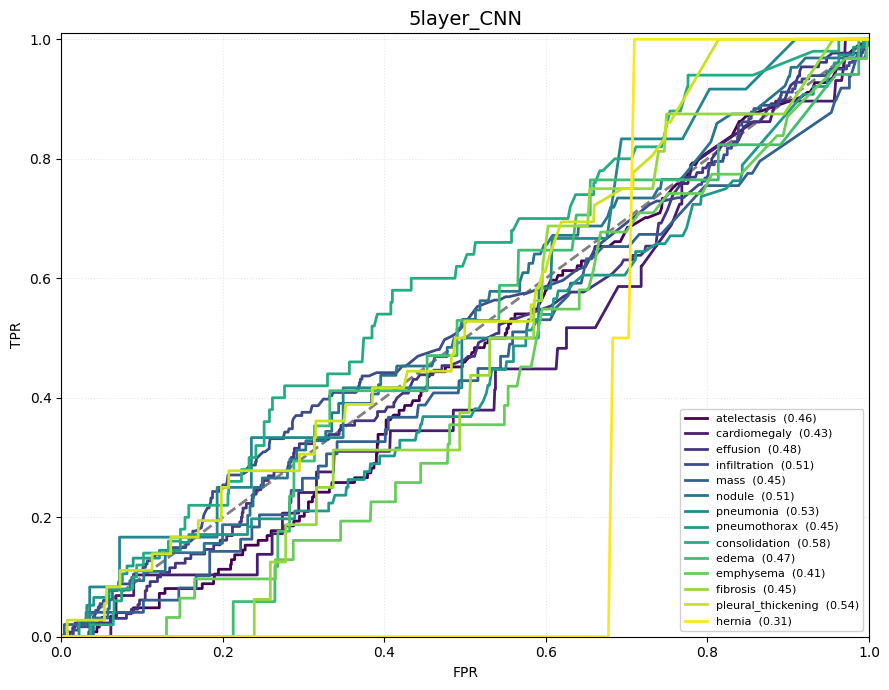

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_224,
    y_probs       = y_prob_C_G_224,
    model_name    = "5layer_CNN")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/CNN_global_224.keras"
history_path = '/content/drive/MyDrive/chestMNIST/CNN_global_224_history.pkl'

CNN_global_224 = keras.models.load_model(model_path)
CNN_global_224_history = pickle.load(open(history_path, 'rb'))


#### 2- Local Branch

##### Bounding Box

In [ ]:
CNN_global_224.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu (ReLU)                    │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_1 (ReLU)                  │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_2 (ReLU)                  │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_3 (ReLU)                  │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 14, 14, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 14, 14, 256)    │         1,02

 Total params: 2,950,444 (11.26 MB)

 Trainable params: 982,990 (3.75 MB)

 Non-trainable params: 1,472 (5.75 KB)

 Optimizer params: 1,965,982 (7.50 MB)

In [ ]:
batch_size = 1
train_generator2_224 = data_generator_2(train_images_224, train_labels_224, batch_size=1)
valid_generator2_224 = data_generator_2(val_images_224, val_labels_224, batch_size=1)
test_generator2_224 = data_generator_2(test_images_224, test_labels_224, batch_size=1)

In [ ]:
import scipy.ndimage as ndi

In [ ]:
out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "train_bbox_CNN_224.npz")

num_samples = len(train_images_224)
cropped_images_list, labels_list, bboxes_list = [], [], []

processed = 0

pbar = tqdm(total=num_samples,
            desc='Processing images',
            unit='img',
            leave=False,
            ncols=80,
            mininterval=0.2)


# ── 1.  Loop until we have seen every image exactly once ──────────────────────
while processed < num_samples:
    img, lbl = next(train_generator2_224)
    B = img.shape[0]

    heatmaps = generate_heatmaps_batch(img, CNN_global_224, "re_lu_4", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.7)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox,target_sz=(224,224))[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))


    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save everything ───────────────────────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)


print(f"\nDone!  Saved one epoch of masked data to:\n{out_path}")



Processing images:   0%|                              | 0/3923 [00:00<?, ?img/s]


Done!  Saved one epoch of masked data to:
/content/drive/MyDrive/chestMNIST/BBox/train_bbox_CNN_224.npz


In [ ]:
out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "val_bbox_CNN_224.npz")

num_samples = len(val_images_224)
cropped_images_list, labels_list, bboxes_list = [], [], []

processed = 0
pbar = tqdm(total=num_samples,
            desc='Processing images',
            unit='img',
            leave=False,
            ncols=80,
            mininterval=0.2)


# ── 1.  Loop until we have seen every image exactly once ──────────────────────
while processed < num_samples:
    img, lbl = next(valid_generator2_224)
    B = img.shape[0]

    heatmaps = generate_heatmaps_batch(img, CNN_global_224, "re_lu_4", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.7)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox, target_sz=(224,224))[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))


    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save everything ───────────────────────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)


print(f"\nDone!  Saved one epoch of masked data to:\n{out_path}")



Processing images:   0%|                               | 0/560 [00:00<?, ?img/s]


Done!  Saved one epoch of masked data to:
/content/drive/MyDrive/chestMNIST/BBox/val_bbox_CNN_224.npz


In [ ]:
out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "test_bbox_CNN_224.npz")

num_samples = len(test_images_224)
cropped_images_list, labels_list, bboxes_list = [], [], []

processed = 0

pbar = tqdm(total=num_samples,
            desc='Processing images',
            unit='img',
            leave=False,
            ncols=80,
            mininterval=0.2)


# ── 1.  Loop until we have seen every image exactly once ──────────────────────
while processed < num_samples:
    img, lbl = next(test_generator2_224)
    B = img.shape[0]

    heatmaps = generate_heatmaps_batch(img, CNN_global_224,"re_lu_4", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.7)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox, target_sz=(224,224))[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))


    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save everything ───────────────────────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)


print(f"\nDone!  Saved one epoch of masked data to:\n{out_path}")



Processing images:   0%|                              | 0/1121 [00:00<?, ?img/s]


Done!  Saved one epoch of masked data to:
/content/drive/MyDrive/chestMNIST/BBox/test_bbox_CNN_224.npz


##### Loading BBOX Images

In [ ]:
train_bbox_CNN_224_threshhold5.npz

In [ ]:
data_15 = np.load('/content/drive/MyDrive/chestMNIST/BBox/train_bbox_CNN_224_threshhold5.npz')
train_img_bbox_224_5_cnn = data_15['images']
train_img_bbox_224_5_cnn = np.squeeze(train_img_bbox_224_5_cnn)
train_lbl_bbox_224_5_cnn = data_15['labels']
train_lbl_bbox_224_5_cnn = np.squeeze(train_lbl_bbox_224_5_cnn)

In [ ]:
data_7 = np.load('/content/drive/MyDrive/chestMNIST/BBox/train_bbox_CNN_224.npz')
train_img_bbox_224_cnn = data_7['images']
train_img_bbox_224_cnn = np.squeeze(train_img_bbox_224_cnn)
train_lbl_bbox_224_cnn = data_7['labels']
train_lbl_bbox_224_cnn = np.squeeze(train_lbl_bbox_224_cnn)

In [ ]:
data_8 = np.load('/content/drive/MyDrive/chestMNIST/BBox/val_bbox_CNN_224.npz')
val_img_bbox_224_cnn = data_8['images']
val_img_bbox_224_cnn = np.squeeze(val_img_bbox_224_cnn)
val_lbl_bbox_224_cnn = data_8['labels']
val_lbl_bbox_224_cnn = np.squeeze(val_lbl_bbox_224_cnn)

In [ ]:
data_9 = np.load('/content/drive/MyDrive/chestMNIST/BBox/test_bbox_CNN_224.npz')
test_img_bbox_224_cnn = data_9['images']
test_img_bbox_224_cnn = np.squeeze(test_img_bbox_224_cnn)
test_lbl_bbox_224_cnn = data_9['labels']
test_lbl_bbox_224_cnn = np.squeeze(test_lbl_bbox_224_cnn)

##### Run the model

In [ ]:
SEED = 42

In [ ]:
train_generator_224 = data_generator_1(train_img_bbox_224_cnn, train_lbl_bbox_224_cnn, batch_size=64, augmentation=True, seed=SEED)
valid_generator_224 = data_generator_1(val_img_bbox_224_cnn, val_lbl_bbox_224_cnn, batch_size=64, augmentation=False, seed=SEED)
test_generator_224 = data_generator_1(test_img_bbox_224_cnn, test_lbl_bbox_224_cnn,batch_size=64, augmentation=False, seed=SEED)

In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/CNN_local_224'

CNN_local_224 , CNN_local_224_history = run_experiment(
    loss='binary_crossentropy',
    batch_size=64,
    num_epochs=50,
    model=CNN5layers((224, 224, 1), num_classes=14),
    train_generator=train_generator_224,
    val_generator=valid_generator_224,
    model_base=model_base
)

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(



Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 34s 374ms/step - acc: 0.8941 - auc: 0.6405 - loss: 0.4021 - val_acc: 0.9508 - val_auc: 0.5987 - val_loss: 0.2931 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 14s 227ms/step - acc: 0.9457 - auc: 0.7179 - loss: 0.2252 - val_acc: 0.9508 - val_auc: 0.7016 - val_loss: 0.2109 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 14s 231ms/step - acc: 0.9459 - auc: 0.7206 - loss: 0.2168 - val_acc: 0.9508 - val_auc: 0.6863 - val_loss: 0.2234 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 14s 227ms/step - acc: 0.9460 - auc: 0.7194 - loss: 0.2181 - val_acc: 0.9508 - val_auc: 0.7252 - val_loss: 0.2051 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler setting learning

##### Evaluation

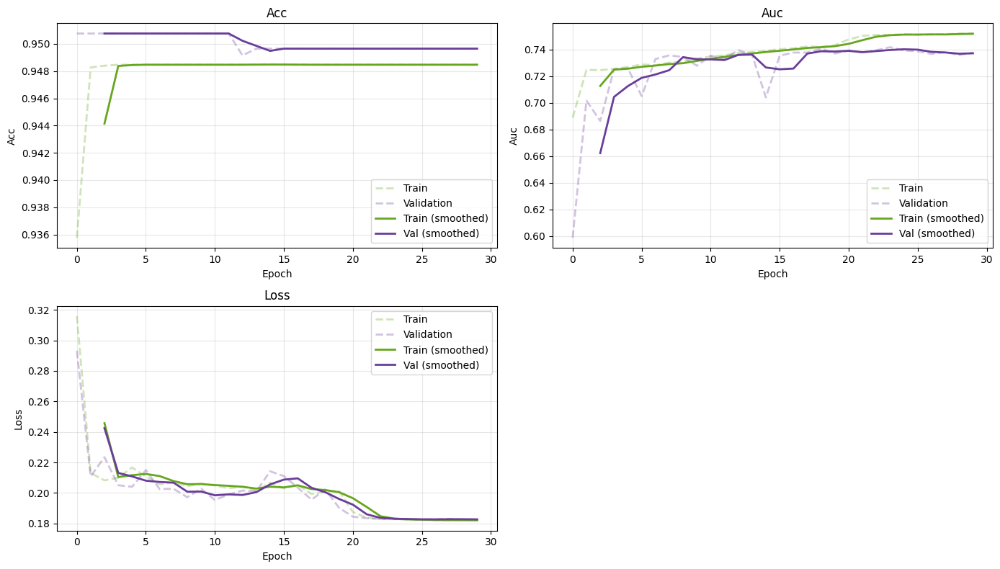

In [ ]:
plot_training_history(CNN_local_224_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_224) / 64))

In [ ]:
evaluation = CNN_local_224.evaluate(test_generator_224, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


Test loss     : 0.1868
Test accuracy : 0.9479
Test AUC      : 0.7392


In [ ]:
y_prob_C_l_224 = CNN_local_224.predict(test_generator_224, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_224[:, i], y_prob_C_l_224[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}


Per-class AUROC
--------------------------------------------------------------------------------
atelectasis         : 0.5132453813052059
cardiomegaly        : 0.46783819628647216
effusion            : 0.5302414033998293
infiltration        : 0.5049841307158811
mass                : 0.49398416082851043
nodule              : 0.5285300378429517
pneumonia           : 0.5720994890291553
pneumothorax        : 0.4913560815915387
consolidation       : 0.5150233426704015
edema               : 0.4370737425404944
emphysema           : 0.49400710269310444
fibrosis            : 0.5499717194570136
pleural_thickening  : 0.5024065540194573
hernia              : 0.7596067917783735


<ipython-input-17-dc71f3da9654>:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap     = cm.get_cmap(base_cmap, n_classes)


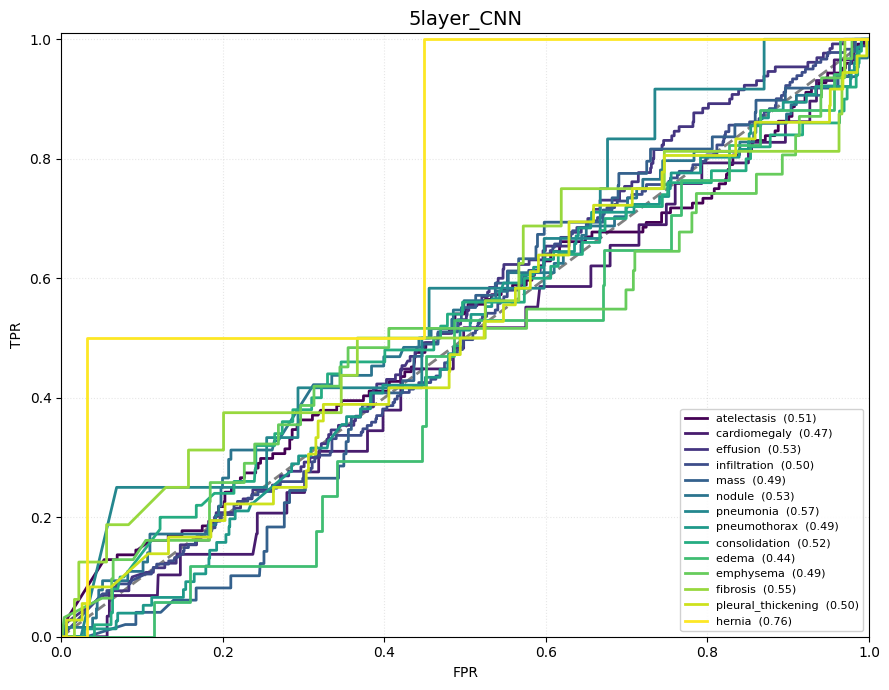

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_224,
    y_probs       = y_prob_C_l_224,
    model_name    = "5layer_CNN")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/CNN_local_224.keras"
history_path = '/content/drive/MyDrive/chestMNIST/CNN_local_224_history.pkl'

CNN_local_224 = keras.models.load_model(model_path)
CNN_local_224_history = pickle.load(open(history_path, 'rb'))

#### 3- Fusion Branch

In [ ]:
fusion_train_gen = data_generator_3(train_images_224, train_img_bbox_224_cnn, train_labels_224, batch_size=64, datagen=get_datagen(True))

fusion_val_gen   = data_generator_3(val_images_224, val_img_bbox_224_cnn,val_labels_224,batch_size=64,datagen=get_datagen(False))

fusion_test_gen = data_generator_3(test_images_224,test_img_bbox_224_cnn,test_labels_224, batch_size=64, datagen= get_datagen(False))

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/CNN_fusion_224'

CNN_fusion_224, CNN_fusion_224_history = run_experiment(
        loss='binary_crossentropy',
        batch_size=64,
        num_epochs=50,
        model= fusion_model(CNN_global_224, CNN_local_224, num_classes=14, hidden_units=256, dropout_rate=0.3, fine_tune_backbones=False),
        train_generator=fusion_train_gen,
        val_generator  =fusion_val_gen,
        model_base     = model_base)


Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 46s 598ms/step - acc: 0.9043 - auc: 0.6559 - loss: 0.2608 - val_acc: 0.9508 - val_auc: 0.7403 - val_loss: 0.1789 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 26s 426ms/step - acc: 0.9460 - auc: 0.7252 - loss: 0.1940 - val_acc: 0.9508 - val_auc: 0.7413 - val_loss: 0.1787 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 26s 430ms/step - acc: 0.9460 - auc: 0.7282 - loss: 0.1934 - val_acc: 0.9492 - val_auc: 0.7447 - val_loss: 0.1827 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 26s 426ms/step - acc: 0.9460 - auc: 0.7321 - loss: 0.1924 - val_acc: 0.9497 - val_auc: 0.7438 - val_loss: 0.1832 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler setting learning

##### Evaluation

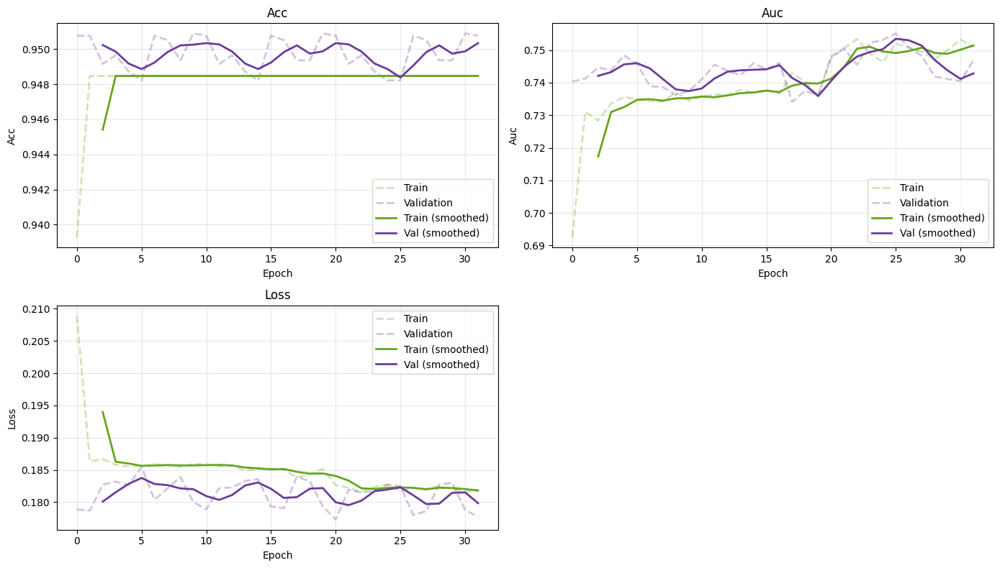

In [ ]:
plot_training_history(CNN_fusion_224_history, smoothing_window= 3, show_raw=True)

In [ ]:
evaluation = CNN_fusion_224.evaluate(fusion_test_gen, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

Test loss     : 0.1858
Test accuracy : 0.9479
Test AUC      : 0.7422


In [ ]:
y_prob_C_F_224 = CNN_fusion_224.predict(fusion_test_gen, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_224[:, i], y_prob_C_F_224[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}


Per-class AUROC
--------------------------------------------------------------------------------
atelectasis         : 0.5393033940531271
cardiomegaly        : 0.5191991916129848
effusion            : 0.5178219358844989
infiltration        : 0.5928705771717409
mass                : 0.5421489491318916
nodule              : 0.45012417218543044
pneumonia           : 0.48549744514577703
pneumothorax        : 0.5572148073533114
consolidation       : 0.6080112044817927
edema               : 0.6407182438192669
emphysema           : 0.5017756732761172
fibrosis            : 0.5238122171945702
pleural_thickening  : 0.504531490015361
hernia              : 0.8145665773011618


<ipython-input-17-dc71f3da9654>:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap     = cm.get_cmap(base_cmap, n_classes)


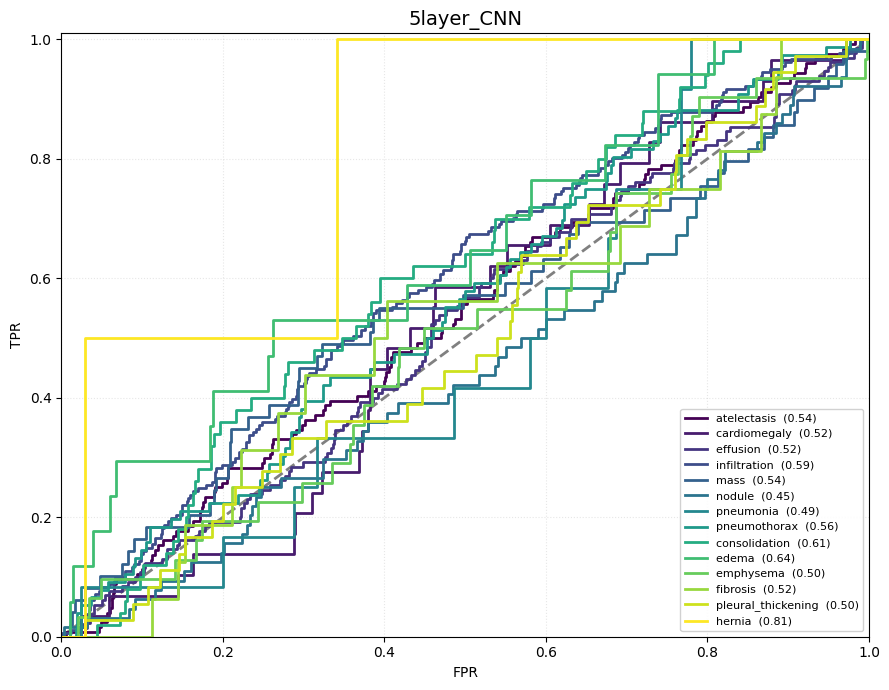

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_224,
    y_probs       = y_prob_C_F_224,
    model_name    = "5layer_CNN")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/CNN_fusion_224.keras"
history_path = '/content/drive/MyDrive/chestMNIST/CNN_fusion_224_history.pkl'

CNN_fusion_224 = keras.models.load_model(model_path)
CNN_fusion_224_history = pickle.load(open(history_path, 'rb'))


<ipython-input-18-002ec1d167bc>:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name, len(model_names))


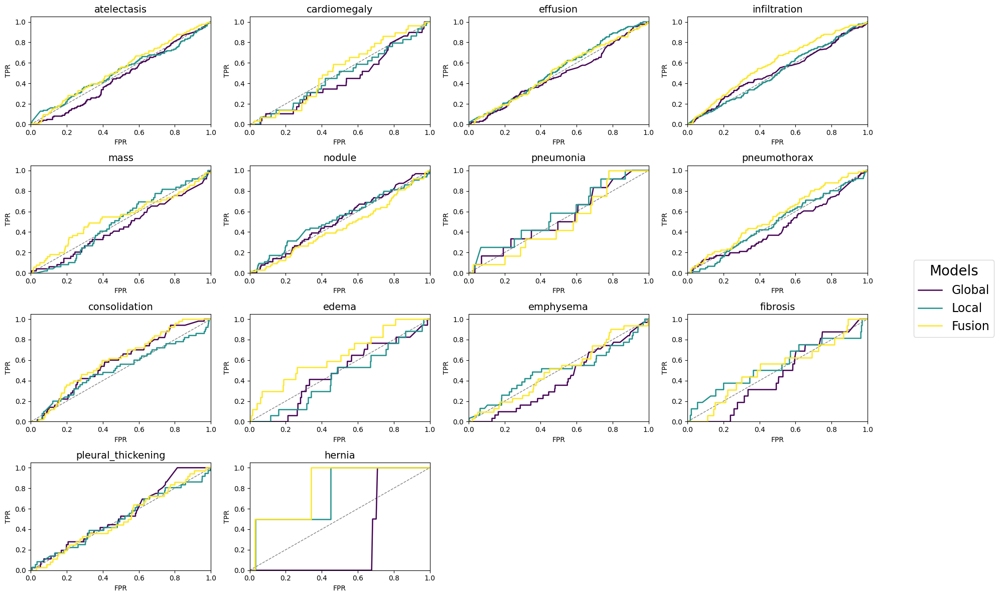

In [ ]:
plot_multimodel_roc(
    y_true           = test_labels_224,
    y_prob_list      = [y_prob_C_G_224, y_prob_C_l_224, y_prob_C_F_224],
    model_names      = ["Global", "Local", "Fusion"],
    class_labels     = CLASS_LABELS,
    n_cols           = 4,
    figsize          = (20, 12),
    cmap_name      = "viridis"
)

### 2) Resnet_50

#### 1- Global Branch

In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/resnet_global_224'

ResNet_global_224 , ResNet_global_224_history = run_experiment(
    loss='binary_crossentropy',
    batch_size=64,
    num_epochs=50,
    model= ResNet(input_shape=(224,224,1), n_classes=14, variant="50"),
    train_generator=train_generator_224,
    val_generator=valid_generator_224,
    model_base=model_base
)

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(



Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 91s 679ms/step - acc: 0.9164 - auc: 0.6639 - loss: 0.8578 - val_acc: 0.8929 - val_auc: 0.6815 - val_loss: 0.6432 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 12s 198ms/step - acc: 0.9458 - auc: 0.7258 - loss: 0.4555 - val_acc: 0.9492 - val_auc: 0.5316 - val_loss: 1.2009 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 12s 200ms/step - acc: 0.9458 - auc: 0.7419 - loss: 0.3499 - val_acc: 0.9492 - val_auc: 0.7336 - val_loss: 0.3029 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 12s 203ms/step - acc: 0.9457 - auc: 0.7409 - loss: 0.3010 - val_acc: 0.9497 - val_auc: 0.6741 - val_loss: 0.4051 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler setting learning

##### Evaluation

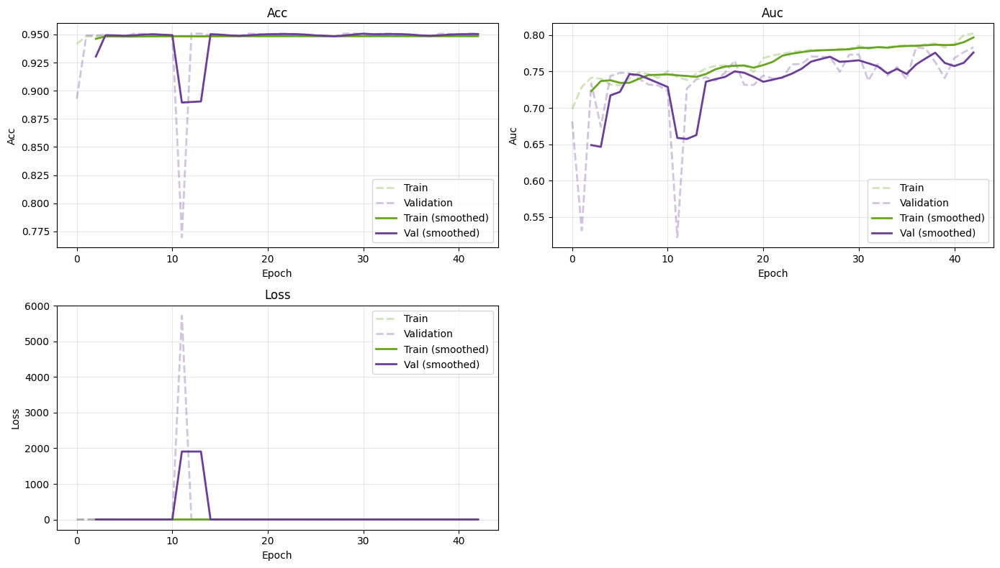

In [ ]:
plot_training_history(ResNet_global_224_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_224) / 64))

In [ ]:
evaluation = ResNet_global_224.evaluate(test_generator_224, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


Test loss     : 0.1868
Test accuracy : 0.9479
Test AUC      : 0.7665


In [ ]:
y_prob_R_G_224 = ResNet_global_224.predict(test_generator_224, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_224[:, i], y_prob_R_G_224[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}


Per-class AUROC
--------------------------------------------------------------------------------
atelectasis         : 0.4293040411557253
cardiomegaly        : 0.6644246558039661
effusion            : 0.514965458355973
infiltration        : 0.5532855295638885
mass                : 0.43017057569296374
nodule              : 0.5085737937559129
pneumonia           : 0.2830628193567779
pneumothorax        : 0.482850667338202
consolidation       : 0.472623716153128
edema               : 0.48151108269394716
emphysema           : 0.4572358686001775
fibrosis            : 0.5964366515837105
pleural_thickening  : 0.422452636968766
hernia              : 0.42180518319928506


<ipython-input-45-dc71f3da9654>:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap     = cm.get_cmap(base_cmap, n_classes)


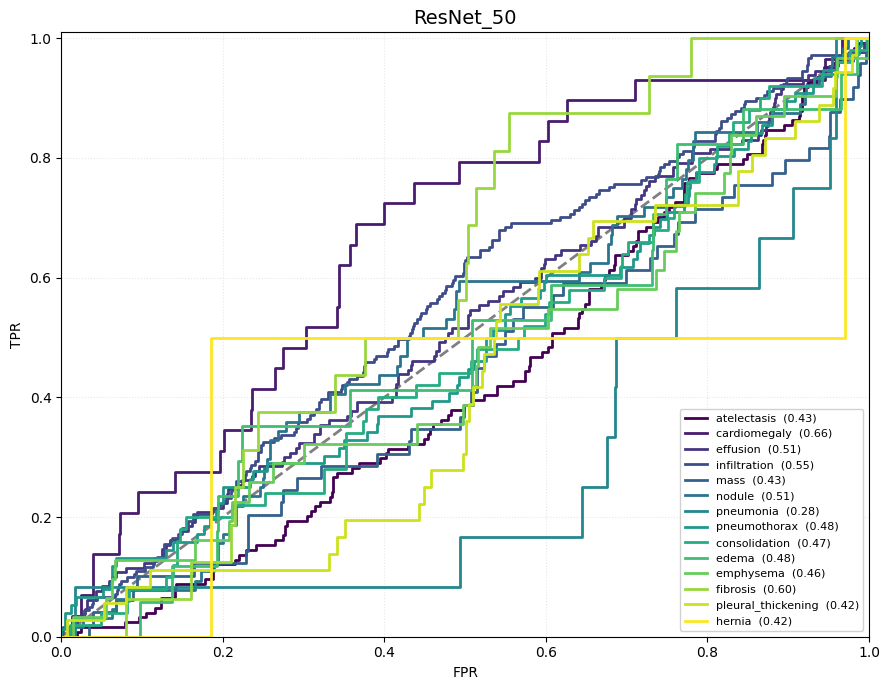

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_224,
    y_probs       = y_prob_R_G_224,
    model_name    = "ResNet_50")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/resnet_global_224.keras"
history_path = '/content/drive/MyDrive/chestMNIST/resnet_global_224_history.pkl'

ResNet_global_224 = keras.models.load_model(model_path)
ResNet_global_224_history = pickle.load(open(history_path, 'rb'))

In [ ]:
ResNet_global_224.summary()

Model: "ResNet50_224"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 112, 112,  │      3,136 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 112, 112,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 112, 112,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 56, 56,    │          0 │ re_lu[0][0]       │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 28, 28,    │      1,024 │ max_pooling2d[0]… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 28, 28,    │         64 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 28, 28,    │          0 │ batch_normalizat… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 28, 28,    │      2,304 │ re_lu_1[0][0]     │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 28, 28,    │         64 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 28, 28,    │          0 │ batch_normalizat… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 28, 28,    │      1,024 │ re_lu_2[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 28, 28,    │      4,096 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 28, 28,    │        256 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 28, 28,    │        256 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 28, 28,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_3 (ReLU)      │ (None, 28, 28,    │          0 │ add[0][0]       

 Total params: 4,492,012 (17.14 MB)

 Trainable params: 1,492,878 (5.69 MB)

 Non-trainable params: 13,376 (52.25 KB)

 Optimizer params: 2,985,758 (11.39 MB)

#### 2- Local Branch

##### Bounding Box

In [ ]:
batch_size = 1
train_generator2_224 = data_generator_2(train_images_224, train_labels_224, batch_size=1)
valid_generator2_224 = data_generator_2(val_images_224, val_labels_224, batch_size=1)
test_generator2_224 = data_generator_2(test_images_224, test_labels_224, batch_size=1)

In [ ]:
start_idx   = 2500
total_imgs  = len(train_images_224)
num_samples = total_imgs - start_idx

out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "train_bbox_resnet_224.npz")

cropped_images_list, labels_list, bboxes_list = [], [], []

# ── 0·A.  Fast-forward generator so we start at image 2 500 ──────────────────
skipped = 0
while skipped < start_idx:
    batch_imgs, _ = next(train_generator2_224)
    skipped += batch_imgs.shape[0]

# ── 0·B.  Progress bar for the *remaining* images ────────────────────────────
pbar = tqdm(total=num_samples,
            desc=f"Processing images {start_idx}-{total_imgs-1}",
            unit="img",
            leave=False,
            ncols=80,
            mininterval=0.2)

processed = 0

# ── 1.  Main loop (unchanged apart from the loop-guard) ──────────────────────
while processed < num_samples:
    img, lbl = next(train_generator2_224)
    B = img.shape[0]


    heatmaps = generate_heatmaps_batch(img, ResNet_global_224, "re_lu_48", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.7)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox, target_sz=(224,224))[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))

    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save just the processed images ───────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)

print(f"\nDone!  Saved {num_samples} cropped images (indexes {start_idx}-{total_imgs-1}) to:\n{out_path}")


Processing images 2500-3922:   0%|                    | 0/1423 [00:00<?, ?img/s]


Done!  Saved 1423 cropped images (indexes 2500-3922) to:
/content/drive/MyDrive/chestMNIST/BBox/train_bbox_resnet_224.npz


In [ ]:
out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "val_bbox_resnet_224.npz")

num_samples = len(val_images_224)
cropped_images_list, labels_list, bboxes_list = [], [], []

processed = 0

pbar = tqdm(total=num_samples,
            desc='Processing images',
            unit='img',
            leave=False,
            ncols=80,
            mininterval=0.2)


# ── 1.  Loop until we have seen every image exactly once ──────────────────────
while processed < num_samples:
    img, lbl = next(valid_generator2_224)
    B = img.shape[0]

    heatmaps = generate_heatmaps_batch(img, ResNet_global_224, "re_lu_48", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.7)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox, target_sz=(224,224))[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))


    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save everything ───────────────────────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)


print(f"\nDone!  Saved one epoch of masked data to:\n{out_path}")



Processing images:   0%|                               | 0/560 [00:00<?, ?img/s]


Done!  Saved one epoch of masked data to:
/content/drive/MyDrive/chestMNIST/BBox/val_bbox_resnet_224.npz


In [ ]:
out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "test_bbox_resnet_224.npz")

num_samples = len(test_images_224)
cropped_images_list, labels_list, bboxes_list = [], [], []

processed = 0

pbar = tqdm(total=num_samples,
            desc='Processing images',
            unit='img',
            leave=False,
            ncols=80,
            mininterval=0.2)


# ── 1.  Loop until we have seen every image exactly once ──────────────────────
while processed < num_samples:
    img, lbl = next(test_generator2_224)
    B = img.shape[0]

    heatmaps = generate_heatmaps_batch(img, ResNet_global_224, "re_lu_48", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.7)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox, target_sz=(224,224))[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))


    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save everything ───────────────────────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)


print(f"\nDone!  Saved one epoch of masked data to:\n{out_path}")

Processing images:   0%|                              | 0/1121 [00:00<?, ?img/s]


Done!  Saved one epoch of masked data to:
/content/drive/MyDrive/chestMNIST/BBox/test_bbox_resnet_224.npz


##### Loading Bbox Images

In [ ]:
data_4 = np.load('/content/drive/MyDrive/chestMNIST/BBox/train_bbox_resnet_224.npz')
train_img_bbox_224_R = data_4['images']
train_img_bbox_224_R = np.squeeze(train_img_bbox_224_R)
train_lbl_bbox_224_R = data_4['labels']
train_lbl_bbox_224_R = np.squeeze(train_lbl_bbox_224_R)

In [ ]:
data_5 = np.load('/content/drive/MyDrive/chestMNIST/BBox/val_bbox_resnet_224.npz')
val_img_bbox_224_R = data_5['images']
val_img_bbox_224_R = np.squeeze(val_img_bbox_224_R)
val_lbl_bbox_224_R = data_5['labels']
val_lbl_bbox_224_R = np.squeeze(val_lbl_bbox_224_R)

In [ ]:
data_6 = np.load('/content/drive/MyDrive/chestMNIST/BBox/test_bbox_resnet_224.npz')
test_img_bbox_224_R = data_6['images']
test_img_bbox_224_R = np.squeeze(test_img_bbox_224_R)
test_lbl_bbox_224_R = data_6['labels']
test_lbl_bbox_224_R = np.squeeze(test_lbl_bbox_224_R)

##### Run the Model

In [ ]:
SEED = 42

In [ ]:
train_generator_224 = data_generator_1(train_img_bbox_224_R, train_lbl_bbox_224_R, batch_size=64, augmentation=True, seed=SEED)
valid_generator_224 = data_generator_1(val_img_bbox_224_R, val_lbl_bbox_224_R, batch_size=64, augmentation=False, seed=SEED)
test_generator_224 = data_generator_1(test_img_bbox_224_R, test_lbl_bbox_224_R,batch_size=64, augmentation=False, seed=SEED)

In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/resnet_local_224'

ResNet_local_224 , ResNet_local_224_history = run_experiment(
    loss='binary_crossentropy',
    batch_size=64,
    num_epochs=50,
    model= ResNet(input_shape=(224,224,1), n_classes=14, variant="50"),
    train_generator=train_generator_224,
    val_generator=valid_generator_224,
    model_base=model_base
)

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(



Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 92s 707ms/step - acc: 0.9047 - auc: 0.6527 - loss: 0.9064 - val_acc: 0.9508 - val_auc: 0.5711 - val_loss: 13.8092 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 13s 213ms/step - acc: 0.9506 - auc: 0.7279 - loss: 0.5355 - val_acc: 0.9508 - val_auc: 0.6571 - val_loss: 0.4827 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 14s 226ms/step - acc: 0.9491 - auc: 0.7240 - loss: 0.4111 - val_acc: 0.9508 - val_auc: 0.7262 - val_loss: 0.3580 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 14s 229ms/step - acc: 0.9494 - auc: 0.7094 - loss: 0.3882 - val_acc: 0.9508 - val_auc: 0.7213 - val_loss: 0.3470 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler setting learnin

##### Evaluation

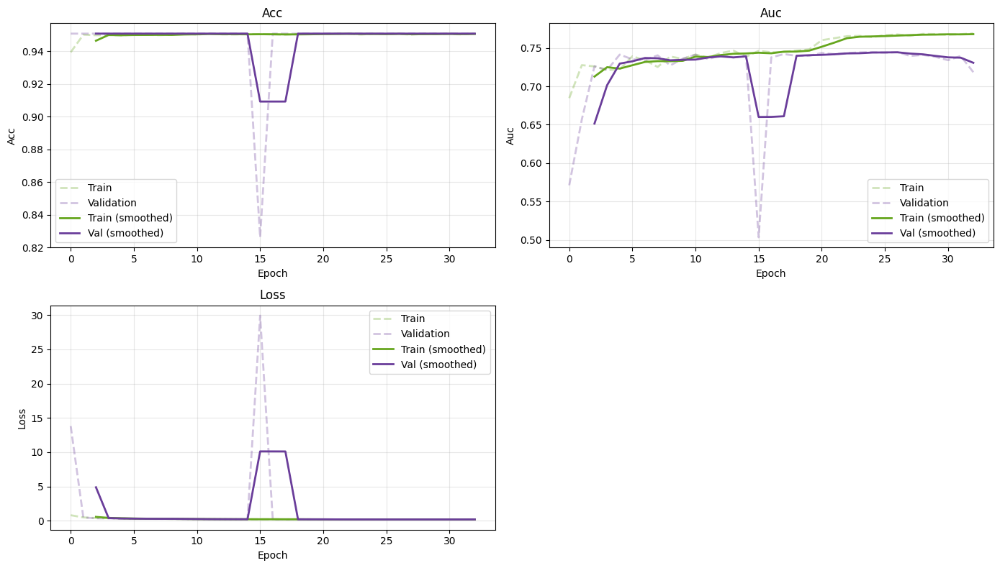

In [ ]:
plot_training_history(ResNet_local_224_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_224) / 64))

In [ ]:
evaluation = ResNet_local_224.evaluate(test_generator_224, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


Test loss     : 0.1991
Test accuracy : 0.9479
Test AUC      : 0.7348


In [ ]:
y_prob_R_l_224 = ResNet_local_224.predict(test_generator_224, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_224[:, i], y_prob_R_l_224[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}


Per-class AUROC
--------------------------------------------------------------------------------
atelectasis         : 0.5032800012942051
cardiomegaly        : 0.45962801566249845
effusion            : 0.47178840332220756
infiltration        : 0.467691313036323
mass                : 0.5465466037161133
nodule              : 0.5040282048249763
pneumonia           : 0.3421250375713857
pneumothorax        : 0.5658902039788467
consolidation       : 0.47697478991596637
edema               : 0.5282395566922422
emphysema           : 0.5079757324652264
fibrosis            : 0.46060520361990953
pleural_thickening  : 0.5398361495135688
hernia              : 0.3123324396782842


<ipython-input-17-dc71f3da9654>:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap     = cm.get_cmap(base_cmap, n_classes)


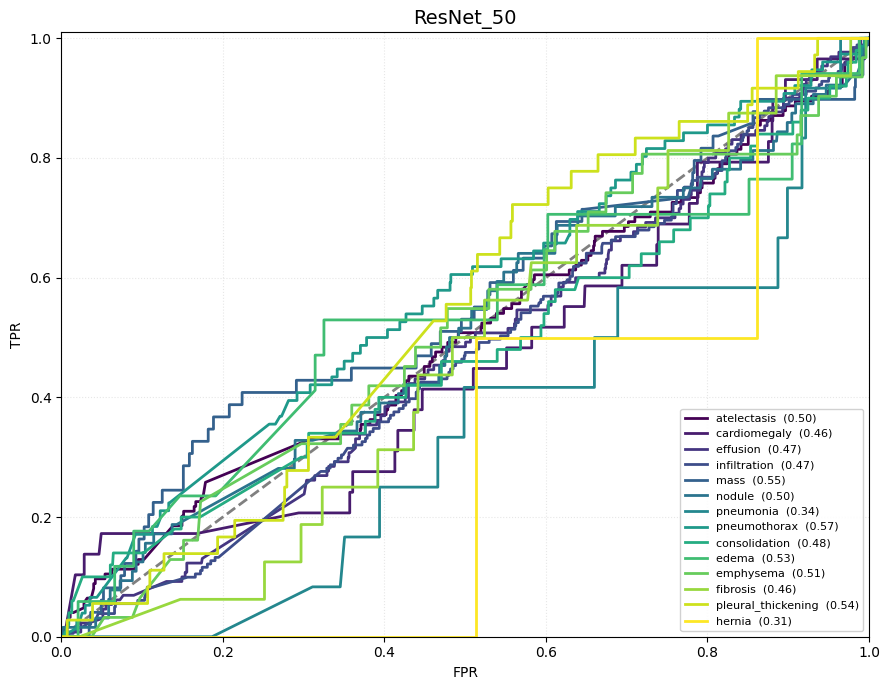

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_224,
    y_probs       = y_prob_R_l_224,
    model_name    = "ResNet_50")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/resnet_local_224.keras"
history_path = '/content/drive/MyDrive/chestMNIST/resnet_local_224_history.pkl'

ResNet_local_224 = keras.models.load_model(model_path)
ResNet_local_224_history = pickle.load(open(history_path, 'rb'))


#### 3- Fusion Branch

In [ ]:
train_images_224 = train_images_224[2500:]
train_labels_224 = train_labels_224[2500:]

In [ ]:
fusion_train_gen = data_generator_3(train_images_224, train_img_bbox_224_R, train_labels_224, batch_size=64, datagen=get_datagen(True))

fusion_val_gen   = data_generator_3(val_images_224, val_img_bbox_224_R, val_labels_224, batch_size=64, datagen=get_datagen(False))

fusion_test_gen = data_generator_3(test_images_224, test_img_bbox_224_R, test_labels_224, batch_size=64, datagen= get_datagen(False))

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/resnet_fusion_224'

ResNet_fusion_224, ResNet_fusion_224_history = run_experiment(
        loss='binary_crossentropy',
        batch_size=64,
        num_epochs=50,
        model= fusion_model(ResNet_global_224, ResNet_local_224, num_classes=14, hidden_units=256, dropout_rate=0.3, fine_tune_backbones=False),
        train_generator=fusion_train_gen,
        val_generator  =fusion_val_gen,
        model_base     = model_base)


Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 59s 680ms/step - acc: 0.9082 - auc: 0.6785 - loss: 0.2483 - val_acc: 0.9508 - val_auc: 0.7656 - val_loss: 0.1745 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 24s 391ms/step - acc: 0.9509 - auc: 0.7644 - loss: 0.1732 - val_acc: 0.9508 - val_auc: 0.7780 - val_loss: 0.1719 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 25s 412ms/step - acc: 0.9498 - auc: 0.7715 - loss: 0.1755 - val_acc: 0.9508 - val_auc: 0.7672 - val_loss: 0.1736 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 26s 417ms/step - acc: 0.9500 - auc: 0.7781 - loss: 0.1728 - val_acc: 0.9508 - val_auc: 0.7609 - val_loss: 0.1790 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler setting learning

##### Evaluation

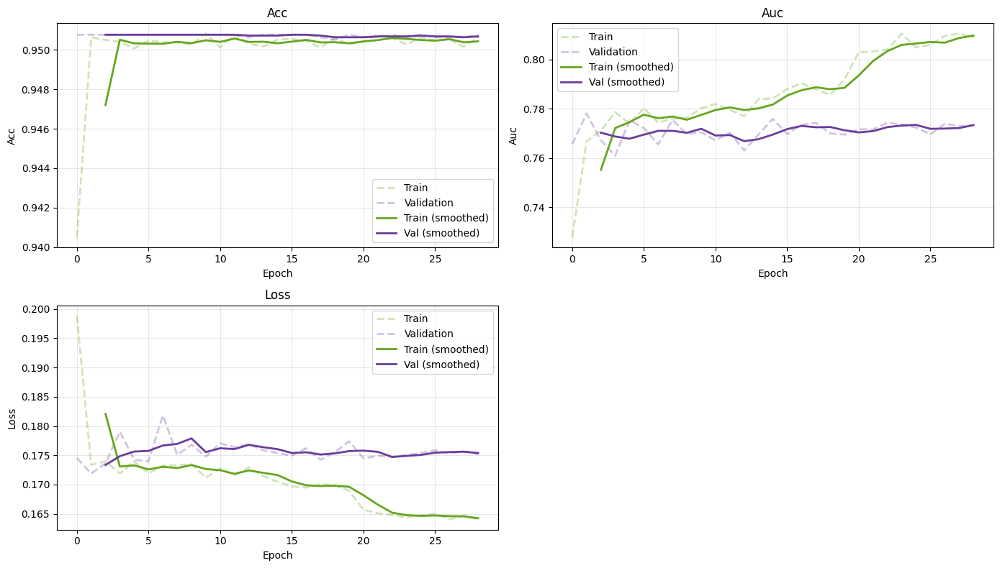

In [ ]:
plot_training_history(ResNet_fusion_224_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_224) / 64))

In [ ]:
evaluation = ResNet_fusion_224.evaluate(fusion_test_gen, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

Test loss     : 0.1831
Test accuracy : 0.9479
Test AUC      : 0.7603


In [ ]:
y_prob_R_F_224 = ResNet_fusion_224.predict(fusion_test_gen, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_224[:, i], y_prob_R_F_224[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_224,
    y_probs       = y_prob_R_F_224,
    model_name    = "ResNet_18")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/resnet_fusion_224.keras"
history_path = '/content/drive/MyDrive/chestMNIST/resnet_fusion_224_history.pkl'

ResNet_fusion_224 = keras.models.load_model(model_path)
ResNet_fusion_224_history = pickle.load(open(history_path, 'rb'))

In [ ]:
plot_multimodel_roc(
    y_true           = test_labels_224,
    y_prob_list      = [y_prob_R_G_224, y_prob_R_l_224, y_prob_R_F_224],
    model_names      = ["Global", "Local", "Fusion"],
    class_labels     = CLASS_LABELS,
    n_cols           = 4,
    figsize          = (20, 12),
    cmap_name      = "viridis"
)

### 3) DenseNet_121

#### 1- Global Branch

In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/DenseNet_global_224'

DenseNet_global_224 , DenseNet_global_224_history = run_experiment(
    loss='binary_crossentropy',
    batch_size=64,
    num_epochs=50,
    model= DenseNet121(input_shape=(224, 224, 1),num_classes=14, growth_rate=32,reduction=0.5),
    train_generator=train_generator_224,
    val_generator=valid_generator_224,
    model_base=model_base
)

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(



Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 294s 2s/step - acc: 0.9070 - auc: 0.6499 - loss: 0.2815 - val_acc: 0.8212 - val_auc: 0.4957 - val_loss: 414412192.0000 - learning_rate: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 17s 277ms/step - acc: 0.9457 - auc: 0.7498 - loss: 0.1961 - val_acc: 0.8189 - val_auc: 0.4735 - val_loss: 265.0189 - learning_rate: 0.0100

Epoch 3: LearningRateScheduler setting learning rate to 0.01.
Epoch 3/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 17s 278ms/step - acc: 0.9458 - auc: 0.7498 - loss: 0.1926 - val_acc: 0.9062 - val_auc: 0.4793 - val_loss: 24.3695 - learning_rate: 0.0100

Epoch 4: LearningRateScheduler setting learning rate to 0.01.
Epoch 4/50
62/62 ━━━━━━━━━━━━━━━━━━━━ 17s 278ms/step - acc: 0.9459 - auc: 0.7566 - loss: 0.1898 - val_acc: 0.9126 - val_auc: 0.4954 - val_loss: 13.4615 - learning_rate: 0.0100

Epoch 5: LearningRateScheduler settin

##### Evaluation

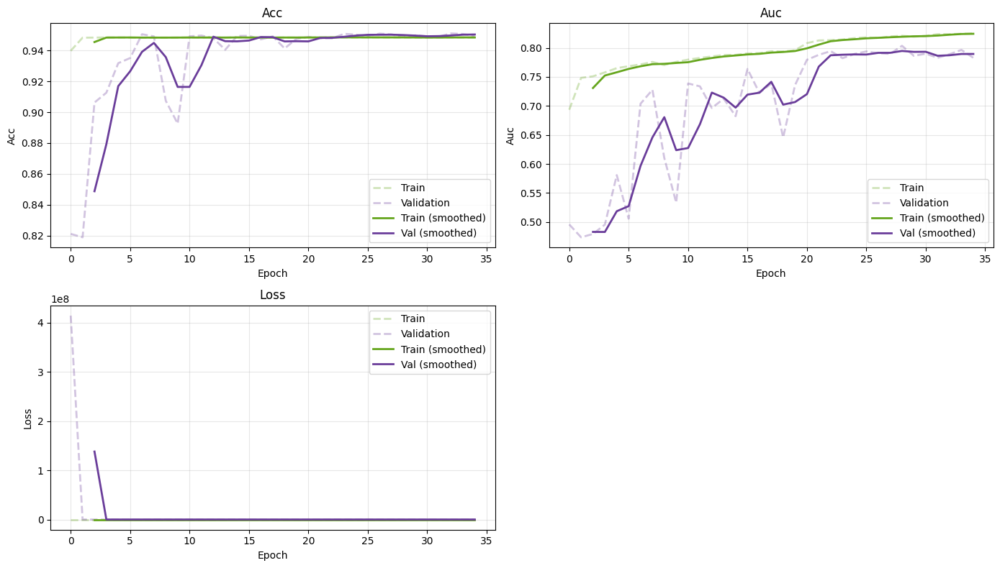

In [ ]:
plot_training_history(DenseNet_global_224_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_224) / 64))

In [ ]:
evaluation = DenseNet_global_224.evaluate(test_generator_224, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:1063: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, which overrides setting of `featurewise_center`.
  warnings.warn(


Test loss     : 0.1791
Test accuracy : 0.9476
Test AUC      : 0.7847


In [ ]:
y_prob_D_G_224 = DenseNet_global_224.predict(test_generator_224, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_224[:, i], y_prob_D_G_224[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}


Per-class AUROC
--------------------------------------------------------------------------------
atelectasis         : 0.4414453036528942
cardiomegaly        : 0.5175887331059744
effusion            : 0.5251338973841497
infiltration        : 0.4948924415187492
mass                : 0.4972586049345112
nodule              : 0.4561110454115421
pneumonia           : 0.5642470694319207
pneumothorax        : 0.48072273986401404
consolidation       : 0.5003548085901027
edema               : 0.4414428815004262
emphysema           : 0.46501923646049126
fibrosis            : 0.3735294117647059
pleural_thickening  : 0.523963133640553
hernia              : 0.3896336014298481


<ipython-input-14-dc71f3da9654>:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap     = cm.get_cmap(base_cmap, n_classes)


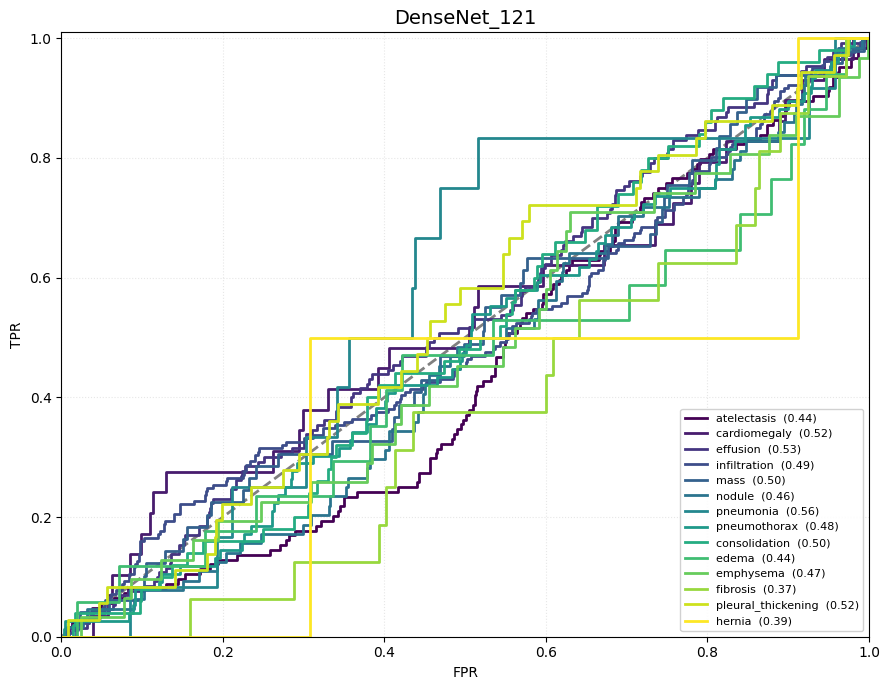

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_224,
    y_probs       = y_prob_D_G_224,
    model_name    = "DenseNet_121")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/DenseNet_global_224.keras"
history_path = '/content/drive/MyDrive/chestMNIST/DenseNet_global_224_history.pkl'

DenseNet_global_224 = keras.models.load_model(model_path)
DenseNet_global_224_history = pickle.load(open(history_path, 'rb'))

In [ ]:
DenseNet_global_224.summary()

Model: "DenseNet121"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)  │ (None, 224, 224,  │          0 │ -                 │
│                     │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │      3,136 │ input[0][0]       │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        256 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_relu (ReLU)    │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_pool           │ (None, 56, 56,    │          0 │ stem_relu[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb1_bn1      │ (None, 56, 56,    │        256 │ stem_pool[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb1_relu1    │ (None, 56, 56,    │          0 │ dense1_cb1_bn1[0… │
│ (ReLU)              │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb1_conv1    │ (None, 56, 56,    │      8,192 │ dense1_cb1_relu1… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb1_bn2      │ (None, 56, 56,    │        512 │ dense1_cb1_conv1… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb1_relu2    │ (None, 56, 56,    │          0 │ dense1_cb1_bn2[0… │
│ (ReLU)              │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb1_conv2    │ (None, 56, 56,    │     36,864 │ dense1_cb1_relu2… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_concat1      │ (None, 56, 56,    │          0 │ stem_pool[0][0],  │
│ (Concatenate)       │ 96)               │            │ dense1_cb1_conv2… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb2_bn1      │ (None, 56, 56,    │        384 │ dense1_concat1[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb2_relu1    │ (None, 56, 56,    │          0 │ dense1_cb2_bn1[0… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb2_conv1    │ (None, 56, 56,    │     12,288 │ dense1_cb2_relu1… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb2_bn2      │ (None, 56, 56,    │        512 │ dense1_cb2_conv1… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense1_cb2_relu2    │ (None, 56, 56,    │          0 │ dense1_cb2_bn2[0

 Total params: 20,969,452 (79.99 MB)

 Trainable params: 6,961,934 (26.56 MB)

 Non-trainable params: 83,648 (326.75 KB)

 Optimizer params: 13,923,870 (53.12 MB)

#### 2- Local Branch

##### Bounding Box

In [ ]:
batch_size = 1
train_generator2_224 = data_generator_2(train_images_224, train_labels_224, batch_size=1)
valid_generator2_224 = data_generator_2(val_images_224, val_labels_224, batch_size=1)
test_generator2_224 = data_generator_2(test_images_224, test_labels_224, batch_size=1)

In [ ]:
out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "train_bbox_densenet_224.npz")

num_samples = len(train_images_224)
cropped_images_list, labels_list, bboxes_list = [], [], []

processed = 0

pbar = tqdm(total=num_samples,
            desc='Processing images',
            unit='img',
            leave=False,
            ncols=80,
            mininterval=0.2)


# ── 1.  Loop until we have seen every image exactly once ──────────────────────
while processed < num_samples:
    img, lbl = next(train_generator2_224)
    B = img.shape[0]

    heatmaps = generate_heatmaps_batch(img, DenseNet_global_224, "conv2d_4", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.5)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox)[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))


    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save everything ───────────────────────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)


print(f"\nDone!  Saved one epoch of masked data to:\n{out_path}")



In [ ]:
out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "val_bbox_densenet_224.npz")

num_samples = len(val_images_224)
cropped_images_list, labels_list, bboxes_list = [], [], []

processed = 0

pbar = tqdm(total=num_samples,
            desc='Processing images',
            unit='img',
            leave=False,
            ncols=80,
            mininterval=0.2)


# ── 1.  Loop until we have seen every image exactly once ──────────────────────
while processed < num_samples:
    img, lbl = next(valid_generator2_224)
    B = img.shape[0]

    heatmaps = generate_heatmaps_batch(img, DenseNet_global_224, "conv2d_4", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.5)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox)[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))


    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save everything ───────────────────────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)


print(f"\nDone!  Saved one epoch of masked data to:\n{out_path}")



In [ ]:
out_dir  = "/content/drive/MyDrive/chestMNIST/BBox"
os.makedirs(out_dir, exist_ok=True)
out_path = os.path.join(out_dir, "test_bbox_densenet_224.npz")

num_samples = len(test_images_224)
cropped_images_list, labels_list, bboxes_list = [], [], []

processed = 0

pbar = tqdm(total=num_samples,
            desc='Processing images',
            unit='img',
            leave=False,
            ncols=80,
            mininterval=0.2)


# ── 1.  Loop until we have seen every image exactly once ──────────────────────
while processed < num_samples:
    img, lbl = next(test_generator2_224)
    B = img.shape[0]

    heatmaps = generate_heatmaps_batch(img, DenseNet_global_224, "conv2d_4", "dense")

    avg_heatmaps  = heatmaps.mean(axis=-1)
    avg_heatmaps /= avg_heatmaps.max(axis=(1,2), keepdims=True)

    bboxes_batch  = []
    cropped_batch = []
    for hm, im in zip(avg_heatmaps, img):
      mask  = heatmap_to_mask(hm, thresh=0.5)
      bbox  = mask_to_bbox(mask)

      # fall-back: if mask empty, use a centred square
      if bbox is None:
        H, W = im.shape[:2]
        side = min(H, W)
        y0   = (H - side)//2
        x0   = (W - side)//2
        bbox = (x0, y0, x0+side-1, y0+side-1)

    bboxes_batch.append(bbox)
    cropped = crop_and_resize(im.squeeze(), bbox)[..., None]
    cropped_batch.append(cropped.astype(float))

    cropped_batch = np.array(cropped_batch)

    cropped_images_list.append(cropped_batch)
    labels_list.append(lbl)
    bboxes_list.append(np.array(bboxes_batch))


    processed += B
    pbar.update(B)

pbar.close()

# ── 2.  Save everything ───────────────────────────────────────────────────────
np.savez_compressed(
    out_path,
    images = np.concatenate(cropped_images_list, axis=0)[:num_samples],
    labels = np.concatenate(labels_list,        axis=0)[:num_samples],
    bboxes = np.concatenate(bboxes_list,        axis=0)[:num_samples]
)


print(f"\nDone!  Saved one epoch of masked data to:\n{out_path}")



##### Loading Bbox Images

In [ ]:
data_4 = np.load('/content/drive/MyDrive/chestMNIST/BBox/train_bbox_densenet_224.npz')
train_img_bbox_224_D = data_4['images']
train_img_bbox_224_D = np.squeeze(train_img_bbox_224_D)
train_lbl_bbox_224_D = data_4['labels']
train_lbl_bbox_224_D = np.squeeze(train_lbl_bbox_224_D)

In [ ]:
data_5 = np.load('/content/drive/MyDrive/chestMNIST/BBox/val_bbox_densenet_224.npz')
val_img_bbox_224_D = data_5['images']
val_img_bbox_224_D = np.squeeze(val_img_bbox_224_D)
val_lbl_bbox_224_D = data_5['labels']
val_lbl_bbox_224_D = np.squeeze(val_lbl_bbox_224_D)

In [ ]:
data_6 = np.load('/content/drive/MyDrive/chestMNIST/BBox/test_bbox_densenet_224.npz')
test_img_bbox_224_D = data_6['images']
test_img_bbox_224_D = np.squeeze(test_img_bbox_224_D)
test_lbl_bbox_224_D = data_6['labels']
test_lbl_bbox_224_D = np.squeeze(test_lbl_bbox_224_D)

##### Run the Model

In [ ]:
SEED = 42

In [ ]:
train_generator_128 = data_generator_1(train_img_bbox_224_D, train_lbl_bbox_224_D, batch_size=64, augmentation=True, seed=SEED)
valid_generator_224 = data_generator_1(val_img_bbox_224_D, val_lbl_bbox_224_D, batch_size=64, augmentation=False, seed=SEED)
test_generator_224 = data_generator_1(test_img_bbox_224_D, test_lbl_bbox_224_D,batch_size=64, augmentation=False, seed=SEED)

In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/densenet_local_224'

DenseNet_local_224 , DenseNet_local_224_history = run_experiment(
    loss='binary_crossentropy',
    batch_size=64,
    num_epochs=50,
    model= DenseNet121(input_shape=(224, 224, 1), num_classes= 14, growth_rate=16, reduction=0.5),
    train_generator=train_generator_224,
    val_generator=valid_generator_224,
    model_base=model_base
)

##### Evaluation

In [ ]:
plot_training_history(DenseNet_local_224_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_224) / 64))

In [ ]:
evaluation = DenseNet_local_224.evaluate(test_generator_224, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

In [ ]:
y_prob_D_l_224 = DenseNet_local_224_history.predict(test_generator_224, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_224[:, i], y_prob_D_l_224[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_224,
    y_probs       = y_prob_D_l_224,
    model_name    = "DenseNet 121")

In [ ]:
model_path   = "/content/drive/MyDrive/chestMNIST/DenseNet_local_224.keras"
history_path = '/content/drive/MyDrive/chestMNIST/DenseNet_local_224_history.pkl'

DenseNet_local_224 = keras.models.load_model(model_path)
DenseNet_local_224_history = pickle.load(open(history_path, 'rb'))

#### 3- Fusion Branch

In [ ]:
fusion_train_gen = data_generator_3(train_images_224, train_img_bbox_224_D, train_labels_224, batch_size=64, datagen= et_datagen(True))
fusion_val_gen   = data_generator_3(val_images_224, val_img_bbox_224_D, val_labels_224, batch_size=64, datagen= get_datagen(False))
fusion_test_gen = data_generator_3(test_images_224, test_img_bbox_224_D, test_labels_224, batch_size=64, datagen= get_datagen(False))

In [ ]:
model_base = '/content/drive/MyDrive/chestMNIST/DenseNet_fusion_224'

DenseNet_fusion_224 , DenseNet_fusion_224_history = run_experiment(
        loss='binary_crossentropy',
        batch_size=64,
        num_epochs=50,
        model= fusion_model(DenseNet_global_224, DenseNet_local_224, num_classes=14, hidden_units=256, dropout_rate=0.3, fine_tune_backbones=False),
        train_generator = fusion_train_gen,
        val_generator   = fusion_val_gen,
        model_base      = model_base)

##### Evaluation

In [ ]:
plot_training_history(DenseNet_fusion_224_history, smoothing_window= 3, show_raw=True)

In [ ]:
steps = int(np.ceil(len(test_labels_224) / 64))

In [ ]:
evaluation = DenseNet_fusion_224.evaluate(test_generator_224, steps=steps, verbose=0)
print(f"Test loss     : {evaluation[0]:.4f}")
print(f"Test accuracy : {evaluation[1]:.4f}")
print(f"Test AUC      : {evaluation[2]:.4f}")

In [ ]:
y_prob_D_F_224 = DenseNet_fusion_224.predict(fusion_test_gen, steps=steps, verbose=0)

In [ ]:
per_class_auc = {}
for i, label in enumerate(CLASS_LABELS):
    try:
        per_class_auc[label] = roc_auc_score(test_labels_224[:, i], y_prob_D_F_224[:, i])
    except ValueError:
        per_class_auc[label] = np.nan

print("\nPer-class AUROC")
print("-" * 80)
for k, v in per_class_auc.items():
    print(f"{k:20s}: {v if not np.isnan(v) else 'undef'}")
results = {"metrics": metrics,
           "per_class_auc": per_class_auc}

In [ ]:
plot_multiclass_roc (
    y_true        = test_labels_224,
    y_probs       = y_prob_D_F_224,
    model_name    = "DenseNet_121")

# Data Visualization


In [ ]:
def sum_of_columns(labels):
    if isinstance(labels, list):
      labels = np.array(labels)
    return np.sum(labels, axis=0)

train_sums = sum_of_columns(train_labels_64)
val_sums = sum_of_columns(val_labels_64)
test_sums = sum_of_columns(test_labels_64)

print("Train label sums:", train_sums)
print("Validation label sums:", val_sums)
print("Test label sums:", test_sums)

Train label sums: [402 102 475 708 206 189  56 185 166  86  89  45 118   3]
Validation label sums: [ 52  12  56 101  29  31   6  28  21  11  15   8  13   3]
Test label sums: [124  29 130 181  49  64  12  76  50  17  31  16  36   2]


In [ ]:
train_sums+val_sums+test_sums

array([578, 143, 661, 990, 284, 284,  74, 289, 237, 114, 135,  69, 167,
         8], dtype=uint64)

In [ ]:
def count_all_zeros(data):
    count = 0
    for row in data:
        if np.all(row == 0):
            count += 1
    return count

train_zeros = count_all_zeros(train_labels_64)
val_zeros = count_all_zeros(val_labels_64)
test_zeros = count_all_zeros(test_labels_64)

print(f"Number of rows with all zeros in training data: {train_zeros}")
print(f"Number of rows with all zeros in validation data: {val_zeros}")
print(f"Number of rows with all zeros in test data: {test_zeros}")

total_zeros = train_zeros + val_zeros + test_zeros
print(f"Total number of rows with all zeros: {total_zeros}")

Number of rows with all zeros in training data: 2119
Number of rows with all zeros in validation data: 319
Number of rows with all zeros in test data: 602
Total number of rows with all zeros: 3040


In [ ]:
data = [ 578, 143, 661, 990, 284, 284,  74, 289, 237, 114, 135,  69, 167,
         8, 637]
labels = ['atelectasis', 'cardiomegaly', 'effusion', 'infiltration', 'mass', 'nodule', 'pneumonia', 'pneumothorax', 'consolidation', 'edema', 'emphysema', 'fibrosis', 'pleural_thickening', 'hernia', 'No Finding']

total_count = len(train_images_64)+len(val_images_64)+len(test_images_64)
percentages = [(count / total_count) * 100 for count in data]

df = pd.DataFrame({'Label': labels, 'Count': data, 'Percentage': [f'{p:.2f}' for p in percentages]})

styled_df = df.style.set_properties(**{'text-align': 'center'})
styled_df = styled_df.set_table_styles([
    {'selector': 'th', 'props': [('text-align', 'center')]},
    {'selector': '', 'props': [('border', '1px solid black')]},
    {'selector': 'td', 'props': [('border', '1px solid black')]},
])
display(styled_df)

,Label,Count,Percentage
0,atelectasis,578,10.31
1,cardiomegaly,143,2.55
2,effusion,661,11.80
3,infiltration,990,17.67
4,mass,284,5.07
5,nodule,284,5.07
6,pneumonia,74,1.32
7,pneumothorax,289,5.16
8,consolidation,237,4.23
9,edema,114,2.03


In [ ]:
all_labels = np.concatenate([train_labels_64, val_labels_64, test_labels_64])
n_classes = all_labels.shape[1]

co_occurrence_matrix = np.zeros((n_classes, n_classes), dtype=int)

# Calculate co-occurrence counts
for i in range(n_classes):
    for j in range(n_classes):
        co_occurrence_matrix[i, j] = np.sum(all_labels[:, i] & all_labels[:, j])

print("Co-occurrence Matrix:")
print(co_occurrence_matrix)

Co-occurrence Matrix:
[[578  16 143 172  40  33  14  47  62  12  28  12  21   1]
 [ 16 143  62  30   7   7   2   2   8   9   1   2   5   0]
 [143  62 661 202  67  38  14  59  64  26  24   9  37   1]
 [172  30 202 990  70  77  30  57  55  43  29  17  37   0]
 [ 40   7  67  70 284  43   1  24  33   9  14   6  21   1]
 [ 33   7  38  77  43 284   5  19  25   7   5   7  18   0]
 [ 14   2  14  30   1   5  74   1   5  16   1   0   1   0]
 [ 47   2  59  57  24  19   1 289  14   1  47   2  15   0]
 [ 62   8  64  55  33  25   5  14 237   8   2   3   7   0]
 [ 12   9  26  43   9   7  16   1   8 114   2   0   5   0]
 [ 28   1  24  29  14   5   1  47   2   2 135   1   6   0]
 [ 12   2   9  17   6   7   0   2   3   0   1  69   8   1]
 [ 21   5  37  37  21  18   1  15   7   5   6   8 167   0]
 [  1   0   1   0   1   0   0   0   0   0   0   1   0   8]]


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
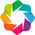

:Chord   [Source,Target]   (Value)

In [ ]:
hv.extension('bokeh')

labels = [
    "atelectasis", "cardiomegaly", "effusion", "infiltration", "mass",
    "nodule", "pneumonia", "pneumothorax", "consolidation", "edema",
    "emphysema", "fibrosis", "pleural_thickening", "hernia"
]

custom_colors = [
    "#1f77b4", "#ff7f0e", "#2ca02c", "#d62728",
    "#9467bd", "#8c564b", "#e377c2", "#7f7f7f",
    "#bcbd22", "#17becf", "#aec7e8", "#ffbb78",
    "#98df8a", "#ff9896"
]

links = []
for i in range(len(labels)):
    for j in range(i + 1, len(labels)):  # Ensure i < j to remove duplicates
        value = co_occurrence_matrix[i, j] + co_occurrence_matrix[j, i]  # Combine both directions
        if value > 0:  # Only include non-zero connections
            links.append((labels[i], labels[j], value))

#DataFrame for links
df_links = pd.DataFrame(links, columns=["Source", "Target", "Value"])

chord = hv.Chord(df_links).opts(
    opts.Chord(
        labels='index',  \
        edge_color='Source',
        edge_cmap=custom_colors,
        node_color='index',
        node_cmap=custom_colors,
        node_size=15,
        width=600,
        height=600,
        title= " Disease Co-occurrence Diagram",
        label_text_font_size="10pt"
  )
)

hv.output(chord)

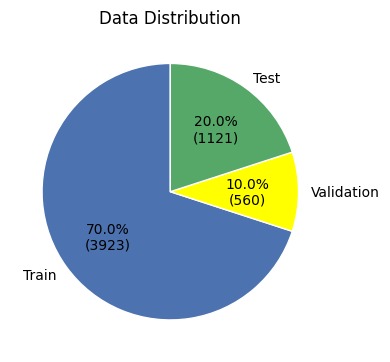

In [ ]:
counts = [len(train_images_64), len(val_images_64), len(test_images_64)]
labels = ['Train', 'Validation', 'Test']


total = sum(counts)
sizes = [c / total * 100 for c in counts]


# Custom autopct to show percent + count
def make_autopct(values):
    def autopct(pct):
        absolute = int(round(pct * total / 100.0))
        return f"{pct:.1f}%\n({absolute})"
    return autopct

# Plot
plt.figure(figsize=(4,4))
plt.pie(
    sizes,
    labels= labels,
    autopct=make_autopct(counts),
    startangle=90,
    colors = ['#4C72B0',"#FFFF00",'#55A868'],
    wedgeprops=dict(edgecolor='white', linewidth=1)
)
plt.title('Data Distribution')
plt.tight_layout()
plt.show()


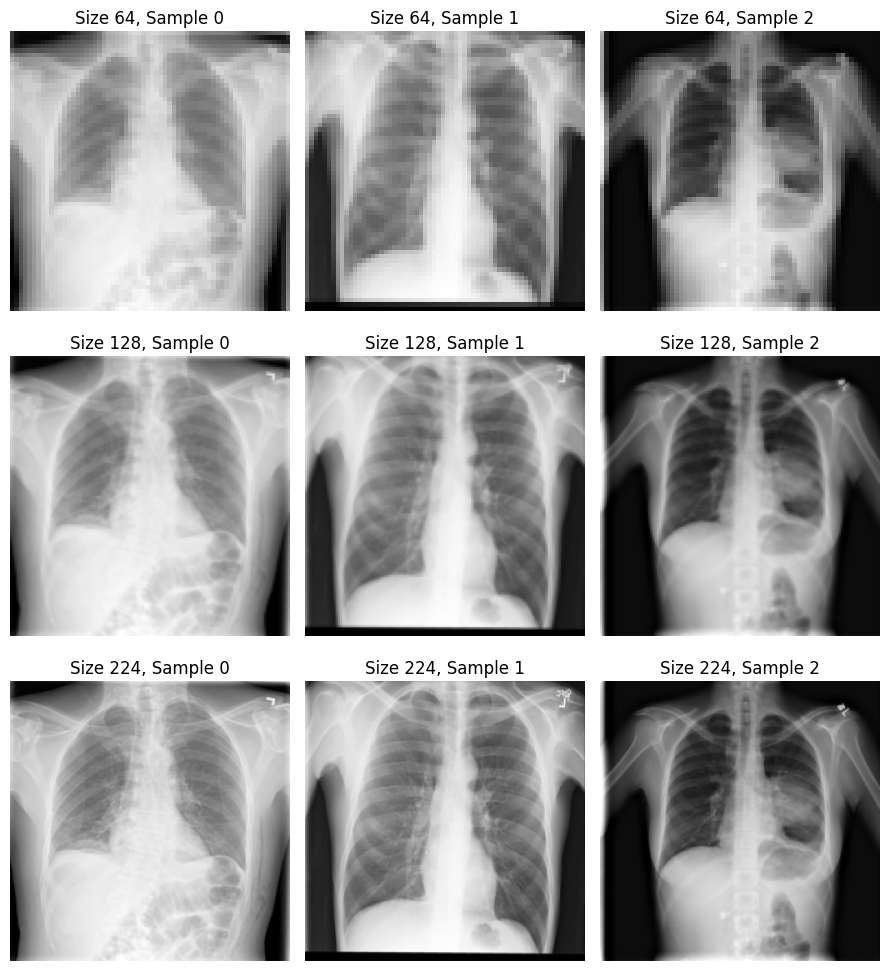

In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(9, 10))
sizes = [64, 128, 224]
sets = (train_images_64, train_images_128, train_images_224)

for i, (size, imgs) in enumerate(zip(sizes, sets)):
    for j in range(3):
        ax = axes[i, j]
        ax.imshow(imgs[j], cmap='gray')
        ax.axis('off')
        ax.set_title(f"Size {size}, Sample {j}")

plt.tight_layout()
plt.show()